## Introduction

### Contexte

L'agence Santé publique France souhaite améliorer sa base de données Open Food Facts et fait appel aux services de votre entreprise. Cette base de données open source est mise à la disposition de particuliers et d’organisations afin de leur permettre de connaître la qualité nutritionnelle de produits. 
 
Aujourd’hui, pour ajouter un produit à la base de données d'Open Food Facts, il est nécessaire de remplir de nombreux champs textuels et numériques, ce qui peut conduire à des erreurs de saisie et à des valeurs manquantes dans la base. 

L’agence Santé publique France confie à votre entreprise la création d’un système de suggestion ou d’auto-complétion pour aider les usagers à remplir plus efficacement la base de données. Dans un premier temps, vous devez vous concentrer sur la prise en main des données, et d’abord les nettoyer et les explorer. 

### Problématique

__Est-il possible de suggérer des valeurs pour certains champs lors de l'ajout d'un nouveau produit afin de réduire les erreurs de saisie et les valeurs manquantes dans la base de données Open Food Facts ?__

### Objectifs

- Préparer un dataset dans le but de prédire une variable quantitative (catégorielle).
- Explorer les stratégies qui pourraient être mises en place pour maximiser la performance du modèle.

### About RGPD

La RGPD ne s'applique que dans le cadre de la manipulation de données personnelles.

Les grands principes de la RGPD sont les suivants:
1. Ne collectez que les données vraiment nécessaires pour atteindre votre objectif
2. Soyez transparent
3. Organisez et facilitez l'exercice des droits des personnes (consultation, accès, rectification, suppression, ...)
4. Fixez des durées de conservation des données
5. Sécurisez les données et identifiez les risques
6. Inscrivez la mise en conformité dans une démarche continue

Dans le cadre de ce projet, aucune donnée personnelle n'est récoltée. 

PS : Après réflexion et analyse plus détaillée des données, il semble que la variable "creator", qui contient l'identifiant du contributeur, pourrait contenir des prénoms/noms. Par conséquent, il aurait été plus judicieux de retirer cette variable dès le début de l'analyse.

## Imports and setup

In [ ]:
import unicodedata
from difflib import SequenceMatcher
from fuzzywuzzy import fuzz
from typing import Optional, Callable, Literal
from functools import wraps, partial
import time
import cProfile
import os 
from datetime import datetime
import re
import math
from collections import Counter
import textwrap as twp
from IPython import extract_module_locals

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
from matplotlib.offsetbox import AnchoredText
import matplotlib.dates as mdates
import seaborn as sns
import missingno as msno

from googletrans import Translator
from geopy.geocoders import Nominatim

from httpx import Timeout
from sklearn.linear_model import LinearRegression
from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import pairwise_distances

from scipy.spatial.distance import squareform
from scipy.stats.contingency import association
from scipy.stats import entropy, skewtest, skew

from joblib import Parallel, delayed
import pickle

In [ ]:
# time decorator to quickly measure efficiency of functions
def timeit(func):
    @wraps(func)
    def timeit_wrapper(*args, **kwargs):
        start_time = time.perf_counter()
        result = func(*args, **kwargs)
        end_time = time.perf_counter()
        total_time = end_time - start_time
        print(f'Execution of function {func.__name__} took {total_time:.4f} seconds')
        return result
    return timeit_wrapper

In [11]:
# Data collection

# Using low_memory = False to remove the DTypeWarning resulted in "code" column being modified.
# For example :
# low_memory = True : 11778, 11778
# low_memory = False : 0011778, 00011778
# All duplicates seem to be removed like this with low_memory = False

# Collect data and store it in a DataFrame
try:
  products = pd.read_csv('fr.openfoodfacts.org.products.csv', sep="\t", low_memory=True)
except FileNotFoundError:
  raise FileNotFoundError("Please add products csv file in the root directory.")

KeyboardInterrupt: 

In [ ]:
products["created_datetime"].dropna().max()

'SuperU,Leclerc'

## General and basic data exploration

Text(0.5, 1.05, 'Missing values visualization in the complete products dataset')

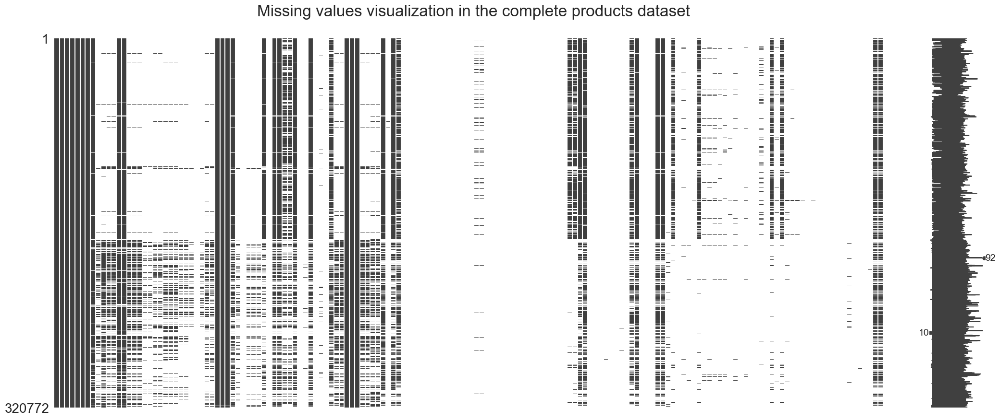

In [ ]:
# Visualize missing values
fig = msno.matrix(products)
fig.set_title("Missing values visualization in the complete products dataset", size=24, y=1.05)

There are a lot of missing values.  
We can distinguish some patterns here but this will be investigated later.

In [ ]:
def display_unique_values(s:pd.Series, df:pd.DataFrame):
    n_unique_values = df.loc[s.name, "nbr_unique_values"]
    if n_unique_values == 0:
        return "no value"
    if n_unique_values < 6:
        return ", ".join(f"{s.value_counts().index[i]} ({v} occurrences)" for i, v in enumerate(s.value_counts()))
    
    return "too many to display"

def add_additional_comment(s:pd.Series, df:pd.DataFrame, sensitivity:float):   
    value_counts = s.value_counts()

    if len(value_counts) > 0:
        # Calculate top common values based on sensitivity
        n_top_common_values = int(len(value_counts) * sensitivity)
        top_common_values = value_counts.values[:n_top_common_values]
        
        # Check if the top common values represent a significant proportion of the data
        if value_counts.quantile(1 - sensitivity) / value_counts.max() < 0.25 and n_top_common_values <= 10:
            sum_top_common_values = top_common_values.sum()
            top_common_values_prop = round(sum_top_common_values / df.loc[s.name, "nbr_non_null_values"], 2)
            top_common_values_info = [f"{value_counts.index[i]} ({value})" for i, value in enumerate(top_common_values)]
            
            # Print additional comments on common values
            return f"""First {n_top_common_values} unique values represent {top_common_values_prop * 100}% of total values : {', '.join(top_common_values_info)}"""
        
        return
    
    else:
        return "This column only contains null values."


def compute_modes(s:pd.Series):
    value_counts = s.value_counts()
    modes = s.mode()
    n_modes = len(modes)

    if n_modes > 0:
        return ", ".join(str(v) if i < 3 else f"... ({n_modes} elements)" for i, v in enumerate(modes[:min(n_modes, 4)])) + f" ({value_counts.values[0]} occurrence(s))"
    
    return


def get_df_variables_info(df:pd.DataFrame) -> pd.DataFrame:

    (n_rows, n_columns) = df.shape
    print(f"This DataFrame has {n_rows} rows and {n_columns} columns.")
    
    top_common_values_sensitivity = 0.15

    n_unique_values = df.nunique()
    n_values = df.count()

    df_info = pd.DataFrame({
        'column_type':df.dtypes,
        'missing_value_percentage': (df.isnull().mean()*100).round(3),
        'nbr_unique_values': n_unique_values,
        'nbr_null_values': df.isnull().sum(),
        'nbr_non_null_values': n_values,
        'duplicates_percentage':round(100-n_unique_values/(n_values.where(n_values != 0, np.nan))*100, 2),
        'mode': df.apply(compute_modes),
        'min': df.min(numeric_only=True),
        'max': df.max(numeric_only=True),
        'mean': df.mean(numeric_only=True),
        'median': df.median(numeric_only=True),
        'std': df.std(numeric_only=True)
        })

    df_info["unique_values"] = df.apply(display_unique_values, df=df_info)
    df_info["additional_comment"] = df.apply(add_additional_comment, df=df_info, sensitivity=top_common_values_sensitivity)

    return df_info


In [ ]:
products_info = get_df_variables_info(products)

This DataFrame has 320772 rows and 162 columns.


## Dtypes fixes

### Incorrect datetime formats

Columns "last_modified_datetime" and "created_datetime" should be of dtype "datetime64[ns]". Let's try to convert them.

In [ ]:
# products["last_modified_datetime"] = pd.to_datetime(products["last_modified_datetime"])

The previous commented line gives an error: 'time data "en:belgium,en:france" doesn't match format "%Y-%m-%dT%H:%M:%S%z"'.
Some datetime values are not formatted correctly. Let's identify the products that have this issue.

In [ ]:
# Convert to datetime, and highlight errors with NaT.
products["last_modified_datetime"] = pd.to_datetime(products["last_modified_datetime"], errors='coerce')
products["created_datetime"] = pd.to_datetime(products["created_datetime"], errors='coerce')

annoying_products = products.loc[products["last_modified_datetime"].isna() | products["created_datetime"].isna()]

print(f"Here are the {len(annoying_products)} products with incorrect datetime format:")
annoying_products[["code", "product_name", "created_datetime", "last_modified_datetime"]]

Here are the 24 products with incorrect datetime format:


,code,product_name,created_datetime,last_modified_datetime
187478,3017760038409,Lulu la barquette (Fraise),NaT,2017-03-08 16:54:15+00:00
189068,NaN,"Belgique,France",NaT,NaT
189103,NaN,France,NaT,NaT
189109,NaN,"Belgique,France,Suisse",NaT,NaT
189119,NaN,France,NaT,NaT
189152,NaN,France,NaT,NaT
189160,NaN,France,NaT,NaT
189162,NaN,France,NaT,NaT
189168,NaN,France,NaT,NaT
189242,NaN,France,NaT,NaT


Columns seem to have been mixed for most of those products. Reorganizing values in their correct column is quite difficult since there is no information on the product "code".
Those lines will just be dropped because it doesn't represent much data.  
Only index "187478" will be kept because it is a special case : all columns are correctly assigned, only the created_datetime and created_t are weird.  


In [ ]:
# Remove index 187478 from annoying products
annoying_products = annoying_products.drop(index=187478)

# Remove annoying products from products
products = products.drop(index=annoying_products.index).reset_index(drop=True)

# Replace missing created_datetime with corresponding last_modified_datetime
# Ideally, we could impute created_datetime value based on created_t column, but created_t is 0 for index 187478.
products.loc[187478, "created_datetime"] = products.loc[187478, "last_modified_datetime"]

### Fixed mixed types

In [ ]:
def check_for_mixed_types(df:pd.DataFrame) -> list:
    '''
    Checks a DataFrame for columns with inconsistent types.

    Parameters:
    df (pd.Dataframe): DataFrame to check

    Returns:
    List of column with inconsistent types.
    '''
    cols_mixed_types = []
    for col in df.columns:
        col_dropped_na = df[col].dropna(ignore_index=True)
        if len(col_dropped_na) > 0:
          unique_types = col_dropped_na.apply(type).unique()
          if len(unique_types) > 1:
            cols_mixed_types.append({col:unique_types.tolist()})
    
    print(f"{len(cols_mixed_types)} column(s) have inconsistent types (excluding NaN values).")
    
    return cols_mixed_types

In [ ]:
check_for_mixed_types(products)

3 column(s) have inconsistent types (excluding NaN values).


[{'code': [int, str]},
 {'created_t': [int, str]},
 {'last_modified_t': [int, str]}]

In [ ]:
# We want to keep NaN values
# Converting to int is not possible due to codes exceeding int size limit. Therefore we convert it to strings
products.loc[products["code"].notna(), "code"] = products.loc[products["code"].notna(), "code"].astype(str)

In [ ]:
products.loc[products["created_t"].notna(), "created_t"] = products.loc[products["created_t"].notna(), "created_t"].astype(int)

In [ ]:
products.loc[products["last_modified_t"].notna(), "last_modified_t"] = products.loc[products["last_modified_t"].notna(), "last_modified_t"].astype(int)

In [ ]:
check_for_mixed_types(products)

0 column(s) have inconsistent types (excluding NaN values).


[]

### Minor notes

Columns "ingredients_from_palm_oil" and "ingredients_that_may_be_from_palm_oil" should be of type "object" instead of "float64", but since there are only null values it doesn't really matter.  
Same thing for column "nutrition_grade_uk".

## Missing data patterns investigation

<Axes: >

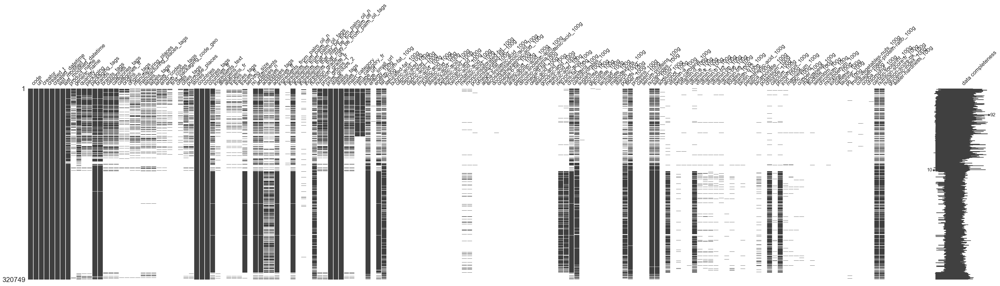

In [ ]:
msno.matrix(products.sort_values(by="created_datetime"), labels = True, figsize=(50,10))

After sorting by creation date, it seems pretty clear that there's a relation between the creation date and the amount of missing data.

In [ ]:
def visualize_smth(df:pd.DataFrame, x:str="event_date", y=None, date_format:str='%Y%m%d', x_is_date:bool|Literal["auto"]="auto", suptitle:str="Title", method:Callable=sns.displot, barlabels_params:Optional[dict]={'padding':2, 'fmt':lambda x: int(x) if int(x) > 0 else ''}, subplot_params:dict={}, **plot_params):
    '''
    Handy function to visualizes data from a pandas DataFrame using a specified plotting method.

    Parameters:
    -----------
    df : pd.DataFrame
        The DataFrame containing the data to be visualized.
    
    x : str, default="event_date"
        The column name in the DataFrame to be used for the x-axis.
    
    y : str or None, optional, default=None
        The column name in the DataFrame to be used for the y-axis. If None, no y-axis is used.
    
    date_format : str, optional, default='%Y%m%d'
        The format to be used when converting the x-axis data (if applicable) to datetime.
    
    x_is_date : bool or "auto", default="auto"
        If "auto", the function will attempt to determine whether the x-axis column can be treated as a date.
        If True, the x-axis will be treated as a date. If False, it will not.
    
    suptitle : str, default="Title"
        The title of the plot, displayed at the top of the figure.
    
    method : Callable, default=sns.displot
        The plotting function (e.g., `sns.displot`, `sns.lineplot`, etc.) that will be used for visualization.
    
    barlabels_params : dict, optional, default={'padding': 2, 'fmt': lambda x: int(x) if int(x) > 0 else ''}
        Parameters to control the appearance of bar labels (if applicable). This can be used to customize the appearance of labels on bar charts.
    
    subplot_params : dict, default={}
        Additional parameters to pass to the plotting method.
    
    plot_params : dict, optional
        Additional parameters to customize the plot (such as row-wise facet splitting, etc.).
    
    Returns:
    --------
    None
        Displays the plot and shows it to the user.
    
    Notes:
    ------
    - If `x_is_date` is set to "auto", the function will attempt to parse the `x` column as datetime using the provided `date_format`.
    - The function automatically handles the filtering of data based on row facets if provided in `plot_params["row"]`.
    - The `wrapper` function ensures proper date formatting and handling of bar labels for various plot methods.
    - The `method` argument can be any seaborn plotting function (such as `sns.displot`, `sns.lineplot`, etc.).
    - The function can handle faceted visualizations if the chosen method supports it.
    
    Example usage:
    ---------------
    visualize_smth(df, x="event_date", y="sales", date_format="%Y-%m-%d", method=sns.lineplot, suptitle="Sales Over Time")
    '''
    
    data = df.copy()

    if "row" in plot_params:
        # Define the maximum number of rows
        max_rows = 10
        # Create a subset of the data based on the maximum number of rows
        unique_rows = df[plot_params["row"]].unique()[:max_rows]
        # Filter the dataset
        data = df[df[plot_params["row"]].isin(unique_rows)]

    if x_is_date: # "auto" or True
        try:
            # Convert event_date from string to datetime
            data[x] = pd.to_datetime(data[x], format=date_format, errors='raise')
            x_is_date = True

        except Exception:
            x_is_date = False
            print("Data on X axis will not be considered as a date.")
    
    data = data.sort_values(by=x)
    data = data.reset_index(drop=True)

    locator = mdates.AutoDateLocator(minticks=70)

    def wrapper(locator, barlabels_params, **params):
        ax = plt.gca()
        # method(x=x_date, y=y, ax=ax, **subplot_params)
        ax.tick_params(axis='x', labelrotation=90, labelbottom=True)
        if barlabels_params:
          for i in range(len(ax.containers)):
              ax.bar_label(ax.containers[i], **barlabels_params)
        if x_is_date:
            ax.xaxis.set_major_locator(locator)

    method_type = type(method())
    plt.close()
    
    if method_type == sns.axisgrid.FacetGrid:
        g = method(data=data, x=x, y=y, **plot_params, **subplot_params)
    else:
        g = sns.FacetGrid(data=data, **plot_params)
        g.map_dataframe(func=method, x=x, y=y, **subplot_params)
    
    g.map_dataframe(func=wrapper, locator=locator, barlabels_params=barlabels_params)
    g.figure.suptitle(suptitle, y=1)
    #g.ax.legend(loc=2)
    #g.add_legend()
    g.tight_layout()
    plt.show()

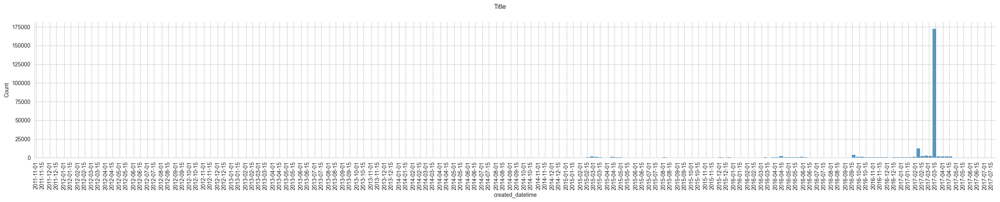

In [ ]:
visualize_smth(df=products, x="created_datetime", barlabels_params=None, aspect=5)

In [ ]:
# Only keep products from the big spike to analyze it
spike_added_products = products.loc[(products["created_datetime"].dt.date >= pd.to_datetime("20170309", format="%Y%m%d").date()) & (products["created_datetime"].dt.date <= pd.to_datetime("20170310", format="%Y%m%d").date())]

c:\Git-OpenClassrooms\DS_3\.venv\Lib\site-packages\seaborn\axisgrid.py:123: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  self._figure.tight_layout(*args, **kwargs)
c:\Git-OpenClassrooms\DS_3\.venv\Lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: AutoDateLocator was unable to pick an appropriate interval for this date range. It may be necessary to add an interval value to the AutoDateLocator's intervald dictionary. Defaulting to 30.
  fig.canvas.print_figure(bytes_io, **kw)


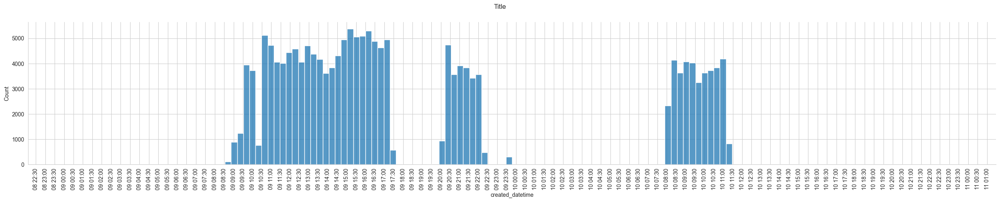

In [ ]:
visualize_smth(df=spike_added_products, x="created_datetime", barlabels_params=None, aspect=5)

Data on X axis will not be considered as a date.


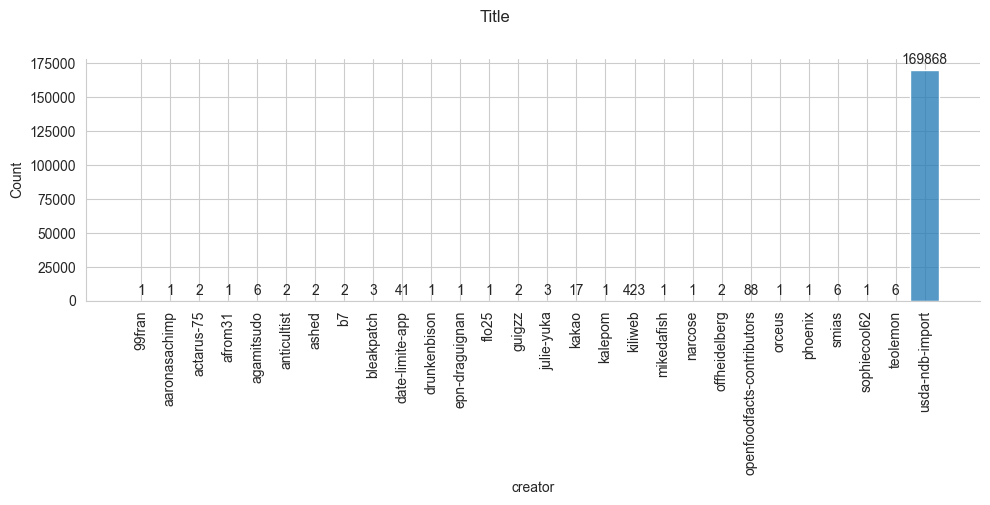

In [ ]:
# Who is responsible for those products ?
visualize_smth(df=spike_added_products, x="creator", aspect=2)

In [ ]:
# Only keep usda-ndb imported products
usda_ndb_imported_products = products.loc[products["creator"] == "usda-ndb-import"]

<Axes: >

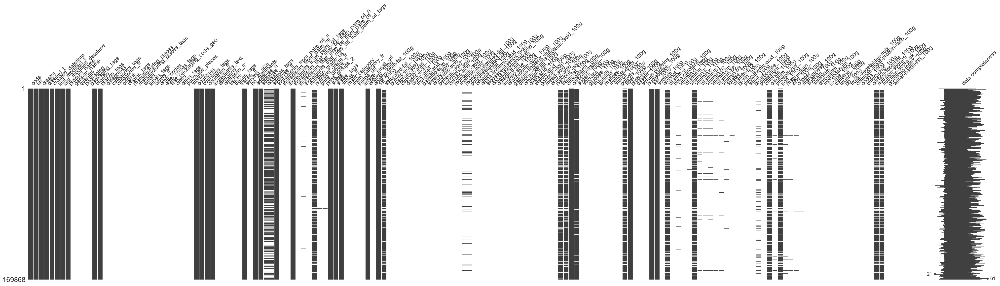

In [ ]:
msno.matrix(usda_ndb_imported_products, labels=True, figsize=(50,10))

They all follow similar missing data patterns.

In [ ]:
# Update products_info
products_info = get_df_variables_info(products)

This DataFrame has 320749 rows and 162 columns.


## Data cleaning and filtering

### Finding hidden missing values

It seems some values should actually be considered as missing values.  
Let's identify as many of those hidden missing values as possible in the columns of type "object".

In [ ]:
def standardize_str(s:str, escape_chars:list=[]):
    ''' 
    Removes non words characters (even whitespaces) and set to lower case.
    Used to detect hidden missing values ('N/A', 'UNKNOWN', ...)
    '''
    if pd.isnull(s):
        return s
    escape_pattern = ''.join(re.escape(char) for char in escape_chars)
    pattern = r'[^\w' + escape_pattern + r']|_'
    return re.sub(pattern, '', str(s), flags=re.UNICODE).lower()

In [ ]:
def find_hidden_missing_values(df:pd.DataFrame, print_result:bool = True, impute_nan:bool=False, additional_hidden_null_values:list[str] = ["unknown", "null", "nan", "na", "0", "inconnu", "unavailable", "not stated"]):   
    df_copy = df.copy()

    for col in df_copy:
        data = df_copy[col].map(standardize_str)
        contains_alphanumeric = data.str.contains(pat=r'\w', na=True, regex=True)
        hidden_null_values_condition = ~contains_alphanumeric | data.isin(additional_hidden_null_values)
        
        if hidden_null_values_condition.any():
            if print_result:
                hidden_null_values = df_copy.loc[hidden_null_values_condition, col]
                print(f"""
{hidden_null_values.shape[0]} values in '{col}' can be considered as null values:
{hidden_null_values}
{'*'*30}""")
            if impute_nan:
                df_copy.loc[hidden_null_values_condition, col] = np.nan
    
    if impute_nan:
        return df_copy

In [ ]:
# Identify columns with type "object", which can contain hidden null values.
products_object_columns = products.select_dtypes(include=object)
# Remove columns with only null values
products_object_columns = products_object_columns.dropna(axis='columns', how='all')

In [ ]:
# Get the list of values identified as hidden missing values, without imputing
# find_hidden_missing_values(df=products_object_columns, print_result=True, impute_nan=False)

In [ ]:
# Fix some product names after checking their page using the provided url
products.loc[268391, "product_name"] = "5 stars"
products.loc[268392, "product_name"] = "3 stars"
products.loc[315650, "product_name"] = "Dors Tequila"

In [ ]:
# Update products_objects_columns to take last changes into account
products_object_columns = products.select_dtypes(include=object)
products_object_columns = products_object_columns.dropna(axis='columns', how='all')

products_object_columns = find_hidden_missing_values(df=products_object_columns, print_result=False, impute_nan=True)

In [ ]:
# Replace object columns with the new object columns (with hidden null values imputed as NaN)
products[products_object_columns.columns] = products_object_columns

### Removing irrelevant columns

It seem "additives" column contains information on all ingredients, and not only on additives as it is illustrated in the next cell.  
It shows that additives can be detected even if their code is not written. Example : alcohol -> e1510.
All detected additives are listed in the column "additives_tags".
Column "additives" does not bring additional information and will be removed for the rest of the analysis.

In [ ]:
# Illustrate that "additives" column seems to have been created from values in "ingredients_text" column
with pd.option_context('display.max_colwidth', None):
    display(products.loc[products["additives"].notna(), ["product_name", "ingredients_text", "additives"]])

,product_name,ingredients_text,additives
1,Banana Chips Sweetened (Whole),"Bananas, vegetable oil (coconut oil, corn oil and/or palm oil) sugar, natural banana flavor.",[ bananas -> en:bananas ] [ vegetable-oil -> en:vegetable-oil ] [ oil -> en:oil ] [ coconut-oil -> en:coconut-oil ] [ oil -> en:oil ] [ corn-oil-and-or-palm-oil-sugar -> en:corn-oil-and-or-palm-oil-sugar ] [ oil-and-or-palm-oil-sugar -> en:oil-and-or-palm-oil-sugar ] [ and-or-palm-oil-sugar -> en:and-or-palm-oil-sugar ] [ or-palm-oil-sugar -> en:or-palm-oil-sugar ] [ palm-oil-sugar -> en:palm-oil-sugar ] [ oil-sugar -> en:oil-sugar ] [ sugar -> en:sugar ] [ natural-banana-flavor -> en:natural-banana-flavor ] [ banana-flavor -> en:banana-flavor ] [ flavor -> en:flavor ]
2,Peanuts,"Peanuts, wheat flour, sugar, rice flour, tapioca starch, salt, leavening (ammonium bicarbonate, baking soda), soy sauce (water, soybeans, wheat, salt), potato starch.",[ peanuts -> en:peanuts ] [ wheat-flour -> en:wheat-flour ] [ flour -> en:flour ] [ sugar -> en:sugar ] [ rice-flour -> en:rice-flour ] [ flour -> en:flour ] [ tapioca-starch -> en:tapioca-starch ] [ starch -> en:starch ] [ salt -> en:salt ] [ leavening -> en:leavening ] [ ammonium-bicarbonate -> en:ammonium-bicarbonate ] [ bicarbonate -> en:bicarbonate ] [ baking-soda -> en:baking-soda ] [ soda -> en:soda ] [ soy-sauce -> en:soy-sauce ] [ sauce -> en:sauce ] [ water -> en:water ] [ soybeans -> en:soybeans ] [ wheat -> en:wheat ] [ salt -> en:salt ] [ potato-starch -> en:potato-starch ] [ starch -> en:starch ]
3,Organic Salted Nut Mix,"Organic hazelnuts, organic cashews, organic walnuts almonds, organic sunflower oil, sea salt.",[ organic-hazelnuts -> en:organic-hazelnuts ] [ hazelnuts -> en:hazelnuts ] [ organic-cashews -> en:organic-cashews ] [ cashews -> en:cashews ] [ organic-walnuts-almonds -> en:organic-walnuts-almonds ] [ walnuts-almonds -> en:walnuts-almonds ] [ almonds -> en:almonds ] [ organic-sunflower-oil -> en:organic-sunflower-oil ] [ sunflower-oil -> en:sunflower-oil ] [ oil -> en:oil ] [ sea-salt -> en:sea-salt ] [ salt -> en:salt ]
4,Organic Polenta,Organic polenta,[ organic-polenta -> en:organic-polenta ] [ polenta -> en:polenta ]
5,Breadshop Honey Gone Nuts Granola,"Rolled oats, grape concentrate, expeller pressed canola oil, sunflower seeds, almonds, walnuts oat bran, sesame seeds, cashews, natural vitamin e.",[ rolled-oats -> en:rolled-oats ] [ oats -> en:oats ] [ grape-concentrate -> en:grape-concentrate ] [ concentrate -> en:concentrate ] [ expeller-pressed-canola-oil -> en:expeller-pressed-canola-oil ] [ pressed-canola-oil -> en:pressed-canola-oil ] [ canola-oil -> en:canola-oil ] [ oil -> en:oil ] [ sunflower-seeds -> en:sunflower-seeds ] [ seeds -> en:seeds ] [ almonds -> en:almonds ] [ walnuts-oat-bran -> en:walnuts-oat-bran ] [ oat-bran -> en:oat-bran ] [ bran -> en:bran ] [ sesame-seeds -> en:sesame-seeds ] [ seeds -> en:seeds ] [ cashews -> en:cashews ] [ natural-vitamin-e -> en:natural-vitamin-e ] [ vitamin-e -> en:vitamin-e ] [ e -> en:e ]
...,...,...,...
320735,Miel de Camargue,Miel,[ miel -> fr:miel ]
320740,Thé vert Earl grey,"thé vert, arôme naturel bergamote avec autres arômes naturels, écorces d'orange douce 3%",[ the-vert -> fr:the-vert ] [ the -> fr:the ] [ arome-naturel-bergamote-avec-autres-aromes-naturels -> fr:arome-naturel-bergamote-avec-autres-aromes-naturels ] [ arome-naturel-bergamote-avec-autres-aromes -> fr:arome-naturel-bergamote-avec-autres-aromes ] [ arome-naturel-bergamote-avec-autres -> fr:arome-naturel-bergamote-avec-autres ] [ arome-naturel-bergamote-avec -> fr:arome-naturel-bergamote-avec ] [ arome-naturel-bergamote -> fr:arome-naturel-bergamote ] [ arome-naturel -> fr:arome-naturel ] [ arome -> fr:arome ] [ ecorces-d-orange-douce-3 -> fr:ecorces-d-orange-douce-3 ] [ ecorces-d-orange-douce -> fr:ecorces-d-orange-douce ] [ ecorces-d-orange -> fr:ecorces-d-orange ] [ ecorces-d -> fr:ecorces-d ] [ ecorces -> fr:ecorces ]
320742,Rillette d'oie,"viande d'oie, graisse d

In [ ]:
products.drop(columns="additives", inplace=True)

Let's also remove empty columns.

In [ ]:
columns_before = set(products.columns)
products.dropna(axis=1, how="all", inplace=True)
removed_columns = columns_before.difference(set(products.columns))
print(f"""{len(removed_columns)} columns were removed:\n{"\n".join(removed_columns)}""")

21 columns were removed:
butyric-acid_100g
behenic-acid_100g
caproic-acid_100g
ingredients_that_may_be_from_palm_oil
no_nutriments
mead-acid_100g
nervonic-acid_100g
cerotic-acid_100g
dihomo-gamma-linolenic-acid_100g
glycemic-index_100g
erucic-acid_100g
cities
water-hardness_100g
elaidic-acid_100g
melissic-acid_100g
chlorophyl_100g
lignoceric-acid_100g
ingredients_from_palm_oil
allergens_fr
gondoic-acid_100g
nutrition_grade_uk


### Removing duplicated columns

#### Highlighting some columns similarities  

In [ ]:
# Check that columns "image_small_url" and "image_url" are almost identical. Only the 7th character from the end changes. 
# All urls in image_small_url end with "200.jpg" when all urls in image_url end with "400.jpg"
products.loc[(products["image_small_url"] != (products["image_url"].str[:-7] + "2" + products["image_url"].str[-6:])) & (products["image_url"].notna()), ["image_small_url", "image_url"]]

,image_small_url,image_url


In [ ]:
# Only difference between "state" and "states_tags" columns is that :
# - values are separated by ", " in "states" column (with whitespace)
# - values are separated by "," in "states_tags" column (without whitespace)
products.loc[(products["states"].str.split(', ') != products["states_tags"].str.split(',')) & (products["states"].notna()), ["states", "states_tags"]]

,states,states_tags


#### Highlighting relation between 2 categorical variables

In [ ]:
def get_crosstab_pair_features(df:pd.DataFrame, col1:str, col2:str):
    dropped_df = df.dropna(subset=[col1, col2])
    if (len(dropped_df[col1].unique()) > 30000) or (len(dropped_df[col2].unique()) > 30000): # Arbitrarly threshold just to avoid too long execution time
      raise Exception("Too many unique values to compute crosstab_result.")

    crosstab_result = pd.crosstab(index=dropped_df[col1], columns=dropped_df[col2])
    association_metric = association(crosstab_result)
    print("The association variable between",crosstab_result.index.name,"and",crosstab_result.columns.name,"is:",association_metric)

    return crosstab_result


In [ ]:
get_crosstab_pair_features(df=products, col1="pnns_groups_1", col2="pnns_groups_2")

The association variable between pnns_groups_1 and pnns_groups_2 is: 1.0


pnns_groups_2,Appetizers,Artificially sweetened beverages,Biscuits and cakes,Bread,Breakfast cereals,Cereals,Cheese,Chocolate products,Dairy desserts,Dressings and sauces,...,Soups,Sweetened beverages,Sweets,Vegetables,cereals,fruits,legumes,nuts,pastries,vegetables
pnns_groups_1,,,,,,,,,,,,,,,,,,,,,
Beverages,0,261,0,0,0,0,0,0,0,0,...,0,2170,0,0,0,0,0,0,0,0
Cereals and potatoes,0,0,0,1838,1408,4106,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Composite foods,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Fat and sauces,0,0,0,0,0,0,0,0,0,3602,...,0,0,0,0,0,0,0,0,0,0
Fish Meat Eggs,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Fruits and vegetables,0,0,0,0,0,0,0,0,0,0,...,503,0,0,2840,0,0,0,0,0,0
Milk and dairy products,0,0,0,0,0,0,4024,0,783,0,...,0,0,0,0,0,0,0,0,0,0
Salty snacks,2101,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Sugary snacks,0,0,4561,0,0,0,0,3109,0,0,...,0,0,4698,0,0,0,0,0,0,0


Displaying crosstab table and calculating association of pnns_groups_1 and pnns_groups_2 allows us to clearly see that pnns_groups_2 contains subcategories of pnns_groups_1. Therefore, only pnns_groups_2 will be kept for the rest of this analysis.

#### Highlighting relation between a categorical variable and a numerical variable

In [ ]:
def remove_outliers(s: pd.Series) -> pd.Series:
    '''
    Removes outliers from a Series based on the IQR method.

    Parameters:
    s (pd.Series): Series from which to remove outliers.

    Returns:
    pd.Series: Series with outliers replaced by NaN.
    '''
    s_copy = s.copy()
    
    q1 = s_copy.quantile(0.25)
    q3 = s_copy.quantile(0.75)
    iqr = q3 - q1

    # Define the bounds for outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    # Remove rows with outliers
    s_copy.loc[(s_copy < lower_bound) | (s_copy > upper_bound)] = np.nan

    return s_copy

In [ ]:
# Apply a list of functions to transform the data
def transform_data(df:pd.DataFrame, funcs:list[Callable]) -> pd.DataFrame:
    '''
    Applies a list of functions to transform the DataFrame.

    Parameters:
    df (pd.DataFrame): DataFrame to transform.
    funcs (list[Callable]): List of functions to apply to the DataFrame.

    Returns:
    pd.DataFrame: Transformed DataFrame.
    '''
    df_copy = df.copy()
    if funcs is not None and len(funcs) > 0:
        for f in funcs:
            try:
                # Iterate over numeric columns
                for col in df_copy.select_dtypes(include=[np.number]).columns:
                    df_copy[col] = f(df_copy[col])
            except AttributeError:
                df_copy = f(df_copy)

    return df_copy

In [ ]:
def eta_squared(x:pd.Series, y:pd.Series):
    '''
    Calculates the eta-squared statistic, a measure of effect size for categorical variables.

    Parameters:
    x (array-like): Categorical variable.
    y (array-like): Continuous variable.

    Returns:
    float: Eta-squared value representing the proportion of variance in y explained by x.
    '''
    y = y.dropna()
    moyenne_y = y.mean()
    classes = []
    x.fillna(value="", inplace=True)
    for classe in x.unique():
        yi_classe = y[x==classe]
        if len(yi_classe) > 0:
            classes.append({'ni': len(yi_classe),
                            'moyenne_classe': yi_classe.mean()})
    
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])

    return SCE/SCT

In [ ]:
def ANOVA(df:pd.DataFrame, x:str, y:str, plot_function:Callable=sns.violinplot, transforms:Optional[list[Callable]]=None, figsize:tuple=(15,25), **plot_params):
    '''
    Performs ANOVA analysis and visualizes the results using a specified plotting function.

    Parameters:
    df (pd.DataFrame): DataFrame containing the data.
    x (str): Categorical variable for grouping.
    y (str): Continuous variable for analysis.
    countries: List of countries to filter.
    inds: List of indicators to include.
    year: Year for filtering data.
    plot_function (Callable): Function for plotting results. Defaults to sns.violinplot.
    **plot_params: Additional parameters for the plotting function.

    Returns:
    None: Displays the plot with eta-squared value annotated.
    '''
    transformed_df = transform_data(df, funcs=transforms)

    eta = round(eta_squared(transformed_df[y],transformed_df[x]), 2)

    fig, ax = plt.subplots(figsize=figsize)
    plot_function(transformed_df, ax=ax, x=x, y=y, **plot_params)
    corr_text = AnchoredText(f"η² = {eta}", loc="upper left")
    ax.add_artist(corr_text)
    ax.set_title(f"ANOVA of {x} and {y} illustrated with {plot_function.__name__}")

    plt.plot()

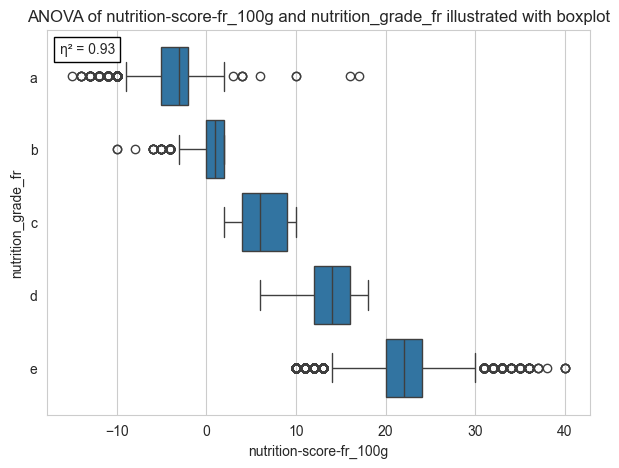

In [ ]:
ANOVA(products, y="nutrition_grade_fr", x="nutrition-score-fr_100g", figsize=(7,5), plot_function=sns.boxplot, order=products["nutrition-score-fr_100g"].groupby(products["nutrition_grade_fr"]).mean().sort_values().index, legend=None)

These boxplots clearly highlights the correlation between those 2 variables. For the rest of the analysis, only the numeric variable "nutrition-score-fr_100g" will be kept.

#### Using given information

According to description of fields from the provided documentation :  

> "fields that end with _tags are comma separated list of tags (e.g. categories_tags is the set of normalized tags computed from the categories field)"

Therefore, when several columns contain the same data ("countries", "countries_tags" and "countries_fr" for example), the column wth suffix "_tags" will be preferred because it is normalized.

In [ ]:
# Remove duplicated columns
columns_to_drop = [
    "image_small_url", # duplicate of image_url
    "additives_fr", # french duplicate of additives_tags
    "brands", # unstandardized duplicate of brands_tags
    "categories", # unstandardized duplicate of categories_tags
    "categories_fr", # french duplicate of categories_tags
    "countries", # unstandardized duplicate of countries_tags
    "countries_fr", # french duplicate of countries_tags
    "emb_codes", # unstandardized duplicate of emb_code_tags
    "labels", # unstandardized duplicate of labels_tags
    "labels_fr", # french duplicate of labels_tags
    "main_category_fr", # french duplicate of main_category
    "manufacturing_places", # unstandardized duplicate of manufacturing_places_tags
    "nutrition_grade_fr", # contains similar information as nutrition-score-fr_100g
    "origins", # unstandardized duplicate of origins_tags
    "packaging", # unstandardized duplicate of packaging_tags
    "pnns_groups_1", # contains same information as pnns_groups_2
    "states", # duplicate of states_tags
    "states_fr", # french duplicate of state_tags
    "traces", # unstandardized duplicate of traces_tags
    "traces_fr" # french duplicate of traces_tags
]

products.drop(columns=columns_to_drop, inplace=True)

_Note : Before droping those columns, verifications were made to reduce the chances of losing valuable information._

In [ ]:
# Update products_info
products_info = get_df_variables_info(products)

This DataFrame has 320749 rows and 120 columns.


### Choosing the target

At first, we'll start by establishing the feasibility of suggesting missing values for one variable.  

Suggestions will be made using Machine Learning, and therefore it needs to be trained on a complete dataset.
Here are the steps to follow in order to prepare the training dataset.

1. Only keep products where the target is not missing. (Filter rows)
2. Drop duplicates.* (Filter rows)
3. Only keep relevant features to predict the target. (Filter columns)
4. Identify and handle extreme values properly.
5. Impute missing values.

The goal for the moment is simply to evaluate the feasibility of the project. Therefore, a variable with more than 50% values missing will be chosen.

\* About dropping duplicated products:
Here a product is considered duplicated if there is another product with 
- Same "product_name", "brands_tags", and "countries_tags"  
OR
- Same "code"

The duplicates with the least information (the most missing values) will be withdrawn.

In [ ]:
# Visualize catetgory variables with at least 50% of missing values
products_info.loc[(products_info["column_type"] == "object") & (products_info["missing_value_percentage"] > 50)].dropna(axis=1, how='all').sort_values(by="missing_value_percentage", ascending=False)

,column_type,missing_value_percentage,nbr_unique_values,nbr_null_values,nbr_non_null_values,duplicates_percentage,mode,unique_values,additional_comment
ingredients_from_palm_oil_tags,object,98.493,14,315914,4835,99.71,huile-de-palme (4586 occurrence(s)),too many to display,First 2 unique values represent 98.0% of total...
ingredients_that_may_be_from_palm_oil_tags,object,96.354,160,309053,11696,98.63,e160a-beta-carotene (2843 occurrence(s)),too many to display,None
first_packaging_code_geo,object,94.138,1602,301946,18803,91.48,"47.633333,-2.666667 (279 occurrence(s))",too many to display,None
cities_tags,object,93.672,2570,300452,20297,87.34,theix-morbihan-france (270 occurrence(s)),too many to display,None
origins_tags,object,93.102,4350,298623,22126,80.34,france (5303 occurrence(s)),too many to display,None
traces_tags,object,92.415,3578,296420,24329,85.29,en:nuts (2051 occurrence(s)),too many to display,None
allergens,object,91.170,12919,292426,28323,54.39,blé (1279 occurrence(s)),too many to display,None
emb_codes_tags,object,90.866,8156,291452,29297,72.16,emb-56251e (218 occurrence(s)),too many to display,None
manufacturing_places_tags,object,88.630,6734,284280,36469,81.54,france (9451 occurrence(s)),too many to display,None
labels_tags,object,85.458,13653,274105,46644,70.73,"en:organic,en:eu-organic,fr:ab-agriculture-bio...",too many to display,None


The chosen target is "pnns_groups_2". It has 77.59% missing values and only 41 unique values (actually 36 after removing invalid values and duplicates).

### Filtering according to the target

- Only keep products for which we have data for the target.
- Only keep features with sufficient data
- Drop duplicates
- Remove redundant features

In [ ]:
invalid_targets = [
    "code", 
    "last_modified_datetime", 
    "creator", 
    "url", 
    "last_modified_t", 
    "created_datetime", 
    "created_t", 
    "image_url", 
    "states_tags"
    ]

In [ ]:
def filter_to_keep_relevant_features(df: pd.DataFrame, target:str, visualize:bool=False) -> pd.DataFrame:
    assert target not in invalid_targets

    # Remove products where there is no value for target variable
    filtered_products = df.dropna(subset=target)
    print(f"Only keeping products with non-null target ({target}) : {df.shape[0] - filtered_products.shape[0]} products removed.")

    # Remove the target from the dataset
    target_data = filtered_products[target]
    features_data = filtered_products.drop(columns=target)
    print(f"Separating target data from the rest of the data : column '{target}' removed.")
    
    # Define columns that will be irrelevant no matter what target is choosen.
    always_irrelevant_columns = [
       "last_modified_datetime", # No useful information for prediction
       "creator", # No useful information for prediction
       "url", # No useful information for prediction
       "last_modified_t", # No useful information for prediction
       "created_datetime",  # No useful information for prediction
       "created_t", # No useful information for prediction
       "image_url", # No useful information for prediction
       "states_tags", # No useful information for prediction
    ]
    features_data.drop(columns=always_irrelevant_columns, inplace=True)
    print(f"Removing {len(always_irrelevant_columns)} columns that won't be useful to predict any target : '{"', '".join(always_irrelevant_columns)}'.")

    # Only keep columns with sufficient data (over 50%)
    insufficient_data_columns = features_data.columns[features_data.notna().mean() < 0.5]
    features_data.drop(columns=insufficient_data_columns, inplace=True)
    print(f"Removing {len(insufficient_data_columns)} columns with insufficient data (less than 50%) : '{"', '".join(insufficient_data_columns)}'.")

    # Drop duplicates
    columns_used_drop_dups = ["product_name", "brands_tags", "countries_tags"]
    features_data["missing_count"] = features_data.isna().sum(axis=1) # Calculate number of missing values for each product
    features_data.sort_values(by=["missing_count"], ascending=True, inplace=True) # Put products with the least missing values at the top
    features_data_without_dups = features_data.drop_duplicates(subset="code", keep='first') # Remove duplicates but keep the first one (the one with the least missing values)
    features_data_without_dups = features_data_without_dups.drop_duplicates(subset=[c for c in columns_used_drop_dups if c in features_data], keep='first') # Remove duplicates but keep the first one (the one with the least missing values)
    features_data_without_dups = features_data_without_dups.drop(columns=["code", "missing_count"])
    print(f"Removing {features_data.shape[0] - features_data_without_dups.shape[0]} duplicated products.")

    if visualize:
      msno.bar(features_data_without_dups, sort="ascending")

    return target_data, features_data_without_dups

Only keeping products with non-null target (pnns_groups_2) : 248882 products removed.
Separating target data from the rest of the data : column 'pnns_groups_2' removed.
Removing 8 columns that won't be useful to predict any target : 'last_modified_datetime', 'creator', 'url', 'last_modified_t', 'created_datetime', 'created_t', 'image_url', 'states_tags'.
Removing 85 columns with insufficient data (less than 50%) : 'origins_tags', 'manufacturing_places_tags', 'emb_codes_tags', 'first_packaging_code_geo', 'cities_tags', 'allergens', 'traces_tags', 'serving_size', 'additives_tags', 'ingredients_from_palm_oil_tags', 'ingredients_that_may_be_from_palm_oil_tags', 'energy-from-fat_100g', 'caprylic-acid_100g', 'capric-acid_100g', 'lauric-acid_100g', 'myristic-acid_100g', 'palmitic-acid_100g', 'stearic-acid_100g', 'arachidic-acid_100g', 'montanic-acid_100g', 'monounsaturated-fat_100g', 'polyunsaturated-fat_100g', 'omega-3-fat_100g', 'alpha-linolenic-acid_100g', 'eicosapentaenoic-acid_100g', 'do

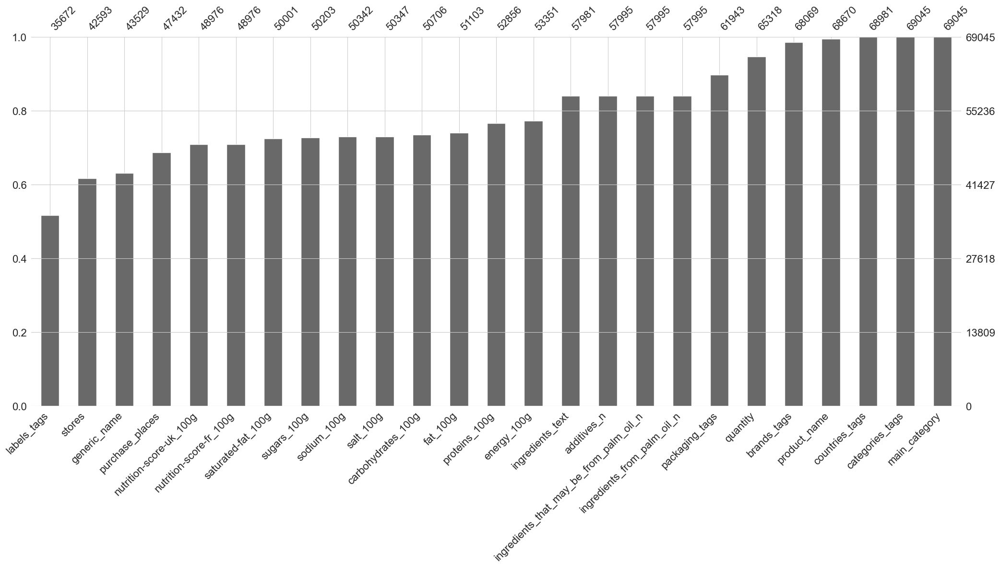

In [ ]:
target_data, filtered_data = filter_to_keep_relevant_features(df=products, target="pnns_groups_2", visualize=True)

In [ ]:
# Columns product_name and generic_name contain similar information, let's fuse them to only keep generic_name
filtered_data.loc[filtered_data["generic_name"].isna(), "generic_name"] = filtered_data.loc[filtered_data["generic_name"].isna(), "product_name"] 

In [ ]:
manual_drop = ["quantity", "purchase_places", "stores", "product_name"] # No useful information for prediction of pnns_group_2 and poorly filled
filtered_data.drop(columns=manual_drop, inplace=True)

_Note : There might still be some columns which are strongly correlated with each other. These columns will be used later, after removing outliers, to predict some values if possible._

In [ ]:
LISTLIKE_COLS = ["countries_tags", "packaging_tags", "brands_tags", "categories_tags", "labels_tags", "stores", "ingredients_text"]
NUTRIENTS_COLS =  ['proteins_100g', 'sugars_100g', 'carbohydrates_100g', 'saturated-fat_100g', 'fat_100g', 'sodium_100g', 'salt_100g']

## Values normalization and mapping

### Mapping CSV creation

Some columns contain different values that should be considered equal.

In [ ]:
def remove_diacritics(s):
    ''' 
    Removes accents
    '''
    return ''.join(c for c in unicodedata.normalize('NFKD', s) if not unicodedata.combining(c))

def remove_language_indicator(s):
    # Remove 2-letter language indicator
    match = re.match(r'\w{2}:(.*)', s)
    if match:
        return match.group(1)
    
    return s

def replace_non_words_char_by_space(s):
    # Remove non words characters
    return re.sub(r'[^\w\s]', ' ', s, flags=re.UNICODE)

In [ ]:
def normalizeString(s:str):
    s = remove_language_indicator(s)
    s = replace_non_words_char_by_space(s)
    s = s.replace('_', '')
    s = remove_diacritics(s) # Remove accents
    s = ' '.join(s.split()) # replace multiple whitespaces with only 1 whitespace

    return s.lower()

In [ ]:
def normalizeIngredients(s:str):
    s = remove_language_indicator(s)

    # if there's a column (':') a string, only keep what's after the first column.
    if ':' in s:
      parts = s.split(':', maxsplit=1)
      s = parts[1]
      if normalizeString(s) == "": # If there's nothing interesting after the ":", keep the part before the ":"
         s = parts[0]

    s = replace_non_words_char_by_space(s)
    s = s.replace('_', '')
    s = remove_diacritics(s) # Remove accents
    s = ' '.join(s.split()) # trim and replace multiple whitespaces with only 1 whitespace
    
    return s.lower()

In [ ]:
def preprocess_ingredients(s:str):
  # Remove percentages, making sure that the most cases are covered
  if isinstance(s, str):
    return re.sub(r'(?:\d|l)+(?:[\.,](?:\d|l)+)?(?:[^\w]|\s|_)*%', '', s, flags=re.UNICODE)
  return s

In [ ]:
timeout=Timeout(10.0)
translator = Translator(user_agent="DS-3", timeout=timeout)

geolocator = Nominatim(user_agent="DS-3", timeout=5)
geocode = partial(geolocator.geocode, language="en")

In [ ]:
def getCountry(string:str, compute_type:Literal["safe","raw"]='safe', geocode:partial=geocode):
    '''
    Parameters:
    string (str) : initial string from which country should be determined
    compute_type (str) : Can be "safe" or "raw". 
        "safe" : First considers that "string" is a country ('US' for example), if no result it considers that "string" is a state or a county ('Great Britain' for example), then it considers
            it as a city ('Marseille' for example)
        "raw" : "string" can be anything (a street, a part of an adress or a building for example). This gives result more often but can be less accurate
    geocode (partial) : partial instance to use as geocode

    Returns :
    '''
    
    granularities = ['country', 'state', 'county', 'city']
    if compute_type == 'raw':
        result = geocode(string)
        if result is not None and len(result) > 0:
            importance = float(result.raw["importance"])
            country = result[0].split(', ')[-1]
            
            return (country, importance)
    
    else:
        for g in granularities:
            result = geocode({g:string})
            if result is not None and len(result) > 0:
                importance = float(result.raw["importance"])
                country = result[0].split(', ')[-1]
                
                return (country, importance)

    return None, 0

In [ ]:
def isUnique(s):
    '''
    Parameters:
    s (pd.Series) : Series for which we want to check if all the values are the same

    Returns : The unique value of the series or False if there are different values
    '''
    a = s.to_numpy()
    if (len(a) > 0) and (a[0] == a).all():
        return a[0]
    return False

In [ ]:
def normalizeCountry(s:str, translator:Translator=translator):
    '''
    This function definitely lacks efficiency (takes about 9 minutes). It assigns an existing country to most of the unique values in "countries_tags" columns.  
    It uses 'googletrans' library to translate and 'geopy' to determine the corresponding country.

    It reduces the amount of uninque values (from 267 to 145)
    In the future, the best would be to limit users who add new products in the database by only allowing them to choose among a list of given countries / options. 
    '''
    print(s)
    splitted_s = remove_language_indicator(s)
    formatted_s = normalizeString(splitted_s)
    formatted_s = re.sub(r'\d', '', formatted_s).strip()
    translated_s = translator.translate(formatted_s).text
    
    suggestions_df = pd.DataFrame(
        {'raw':getCountry(splitted_s, compute_type='raw'), 
         'formatted':getCountry(formatted_s), 
         'translated':getCountry(translated_s)
        }, 
        index=['suggestion', 'importance']
        ).transpose()

    unique_v = isUnique(suggestions_df["suggestion"])
    if unique_v:
        return unique_v
    
    unique_probable_v = isUnique(suggestions_df.loc[suggestions_df["importance"] > 0.85, "suggestion"])
    if unique_probable_v:
        return unique_probable_v
    
    suggestions_df = suggestions_df.sort_values(by="importance", ascending=False)
    return f'({", ".join(suggestions_df["suggestion"].dropna().unique())})'


In [ ]:
def complete_countries_mapping(df:pd.DataFrame):
    df.loc[df["initial"] == "en:soviet-union", 'formatted'] = "Russia"
    df.loc[df["initial"] == "other-العراق", 'formatted'] = "Iraq"
    df.loc[df["initial"] == "en:gulf-countries", 'formatted'] = "United Arab Emirates"
    df.loc[df["initial"] == "en:republique-de-chine", 'formatted'] = "China"
    df.loc[df["initial"] == "other-turquie", 'formatted'] = "Turkey"

    united_kingdom = ["es:nagy-britannia", "fr:nagy-britannia"]
    df.loc[df["initial"].isin(united_kingdom), 'formatted'] = "United Kingdom"

    japan = ["other-japon", "en:other-日本", "other-日本"]
    df.loc[df["initial"].isin(japan), 'formatted'] = "Japan"

    france = ["fr:bourgogne-aube-nogent-sur-seine", "fr:bouches-du-rhone", "fr:77-provins"]
    df.loc[df["initial"].isin(france), 'formatted'] = "France"

    # Add "World" option
    world = ["en:world", "en:worldwide", "de:weltweit", "en:global-market", "en:all-over-the-world"]
    df.loc[df["initial"].isin(world), 'formatted'] = "World"

    # Add "Europe" option
    europe = ["en:european-union"]
    df.loc[df["initial"].isin(europe), 'formatted'] = "Europe"

    # Set remaining NaN values to empty string
    df.loc[df["formatted"].isna(), 'formatted'] = ""

    return df

In [ ]:
def complete_labels_mapping(df:pd.DataFrame):
    df.loc[df["initial"] == "en:ⓜ", "formatted"] = "ⓜ"
    df.loc[df["initial"] == "en:℮", "formatted"] = "℮"
    df.loc[df["initial"] == "de:℮", "formatted"] = "℮"
    
    return df

In [ ]:
def get_chunks(arr, size:int):
    '''
    Split an array-like object in chunks of given size.

    Parameters:
    arr (Any): Array-like object to split in chunks.
    size (int): Maximum size of the chunks.

    Returns:
    tuple(arr): Tuple containing the chunks.
    '''
    return (arr[pos:pos + size] for pos in range(0, len(arr), size))

In [ ]:
# Compute parallel pairwise distance matrix
@timeit
def compute_parallel_distance_matrix(X:pd.DataFrame, metric:Callable, **kwargs):

  # Convert DataFrame to numpy array
    v = np.array(X)
    N = v.shape[0]

    # Handle the case where X is 1D
    if v.ndim == 1:
      # Compute pairwise distances in parallel
      distances_chunked = Parallel(n_jobs=-1)(
          delayed(pairwise_distances)([v[i]], v[i + 1:N], metric=metric, ensure_all_finite='allow-nan', **kwargs) 
          for i in range(N - 1)
      )

    else:
      # Compute pairwise distances in parallel
      distances_chunked = Parallel(n_jobs=-1)(
          delayed(pairwise_distances)([v[i, :]], v[i + 1:N, :], metric=metric, ensure_all_finite='allow-nan', **kwargs) 
          for i in range(N - 1)
      )

    # Concatenate results and return squareform distance matrix
    return squareform(np.concatenate([d.flatten() for d in distances_chunked]))

In [7]:
def group_similar_values(value_counts: pd.Series, metric:Callable, threshold:int, **kwargs) -> pd.Series:
    """
    Groups similar strings in a Pandas Series by clustering based on fuzzy string matching.

    Parameters:
    - unique_values (pd.Series): Column with string unique values to clean.
    - threshold (int): Similarity threshold for grouping (0-100). Higher values mean stricter matching.

    Returns:
    - pd.Series: Series with values replaced by their representative group values.
    """   
    unique_values = value_counts.index
    print(f"This Series contains {len(unique_values)} unique values.")
    
    # Compute parallel pairwise distance matrix
    distance_matrix = compute_parallel_distance_matrix(unique_values, metric=metric, **kwargs)
    
    # Clustering with DBSCAN
    clustering = DBSCAN(
        eps=threshold,
        min_samples=1,
        metric="precomputed"
    ).fit(distance_matrix)
    
    # Map each cluster to its most frequent string
    labels = clustering.labels_
    
    cluster_map = {}
    for label in set(labels):
        members = [unique_values[i] for i in range(len(labels)) if labels[i] == label]
        
        # Determine the most frequent string in the cluster
        members_value_counts = dict((k,value_counts.get(k, 0)) for k in members)
        most_frequent = max(members_value_counts,  key=members_value_counts.get)
        
        # Map all members of the cluster to the most frequent string
        cluster_map.update({member: most_frequent for member in members})

        if len(members) > 1:
            print(members)

    
    # Replace values in the original series
    return cluster_map

In [8]:
def calculate_distance_between_groups(group1:str, group2:str, feature_name:str="main_category", df:pd.DataFrame=filtered_data.dropna(subset=NUTRIENTS_COLS), cols:list[str]=NUTRIENTS_COLS, max_distance:float=math.sqrt(len(NUTRIENTS_COLS)*100**2)):   
    if group1 == group2:
        return 0
    df_filtered = df[df[feature_name].isin([group1, group2])]
    medians = df_filtered.groupby(feature_name)[cols].median().loc[[group1, group2]]
    medians_difference = medians.loc[group1] - medians.loc[group2]

    return np.linalg.norm(medians_difference)/max_distance*100 # normalize the distance between 0 and 100

NameError: name 'filtered_data' is not defined

In [ ]:
class FeatureToNormalizeAndMap():

    def __init__(
            self, 
            name:str, 
            preprocessing: Optional[list[Callable]] = None,
            normalize_method:Callable = normalizeString, 
            cluster_method:Callable = partial(group_similar_values, metric=lambda s1, s2: 100-fuzz.ratio(s1, s2), threshold=10),
            possible_sep:Optional[list[re.Pattern]]=[","],
            after_mapping_adjustements:Optional[list[Callable]] = None
    ):
        self._name = name
        self._preprocessing = preprocessing
        self._normalize_method = normalize_method
        self._cluster_method = cluster_method
        self._possible_sep = None
        if self._name in LISTLIKE_COLS:
            self._possible_sep = possible_sep
        self._after_mapping_adjustements = after_mapping_adjustements

In [ ]:
features_to_normalize_and_map = [
    FeatureToNormalizeAndMap(name="generic_name"),
    FeatureToNormalizeAndMap(name="countries_tags", normalize_method=normalizeCountry, cluster_method=None, after_mapping_adjustements=[complete_countries_mapping]),
    FeatureToNormalizeAndMap(name="packaging_tags"),
    FeatureToNormalizeAndMap(name="brands_tags"),
    FeatureToNormalizeAndMap(name="categories_tags"),
    FeatureToNormalizeAndMap(name="labels_tags", after_mapping_adjustements=[complete_labels_mapping]),
    FeatureToNormalizeAndMap(name="main_category", normalize_method=None, cluster_method=partial(group_similar_values, threshold=1, metric=calculate_distance_between_groups)),
    FeatureToNormalizeAndMap(name="ingredients_text", preprocessing=[preprocess_ingredients], normalize_method=normalizeIngredients, possible_sep=[",", r"\(", r"\)", r"\[", r"\]", r"\.", ";", r"[^\w]-[^\w]", r"[^\w]·[^\w]", r"[^\w]—[^\w]"])
]

In [ ]:
def create_mapping_csv(feature:FeatureToNormalizeAndMap, df:pd.DataFrame):
  MAX_UNIQUE_VALUES = 40000 # From 50 000 distinct values in the Series, there is a risk to reach the maximum memory on the used computer (32 Go)

  print(f"{'*'*30}\n{feature._name}")
  
  # Get initial unique values
  initial = df[feature._name].copy()

  if feature._preprocessing is not None:
    for f in feature._preprocessing:
      initial = initial.apply(f)
      
  if feature._name in LISTLIKE_COLS:
    sep_pattern = '|'.join(sorted(list(set(feature._possible_sep)-set(',')))) # sorting the list to get consistent results
    if sep_pattern != '':
      initial = initial.apply(lambda s: re.sub(sep_pattern, ",", s, flags=re.UNICODE) if isinstance(s, str) else s)
    initial = initial.str.split(',').explode()
  unique_initial = pd.Series(initial.dropna(ignore_index=True).unique())
  mapping_df = pd.DataFrame(data={"initial":unique_initial})
  
  if feature._normalize_method is not None:
    normalized = mapping_df["initial"].apply(feature._normalize_method)
    mapping_df["normalized"] = normalized
  else:
    mapping_df["normalized"] = mapping_df["initial"]
  
  # Get unique normalized values and their count
  intermediate_mapping_dict = dict(zip(mapping_df["initial"], mapping_df["normalized"]))
  # Here mapping is necessary to get the count of total values in "initial" Series, and not only the unique values.
  value_counts = initial.map(intermediate_mapping_dict).value_counts(sort=False) # Do not sort because chunks wouldn't be "randomly" built later.

  # Group similar values together
  if feature._cluster_method is not None:
    clustered = {}
    for chunk in get_chunks(value_counts, size=MAX_UNIQUE_VALUES):
      clustered.update(feature._cluster_method(value_counts=chunk))
    mapping_df["clustered"] = mapping_df["normalized"].map(clustered)
  else:
    mapping_df["clustered"] = mapping_df["normalized"]
  mapping_file_name = os.path.join("utils", "mapping", f"{feature._name}.csv")
  mapping_df.to_csv(mapping_file_name)

In [ ]:
# for feature in features_to_normalize_and_map:
#     create_mapping_csv(feature=feature, df=filtered_data)

### Values mapping

In [ ]:
def map_values_list_like_col(series:pd.Series, mapping_filename:str, special_treatment:Optional[list[Callable]]=None):
    df = pd.read_csv(mapping_filename, index_col=0)
    assert ('initial' in df) and ('clustered' in df)
    
    if special_treatment is not None:
      for f in special_treatment:
          df = f(df)

    mapping_dict = df.set_index('initial')['clustered'].to_dict()

    initial_values = [[s for s in set(v.split(',')) if re.match(r'\w', s, flags=re.UNICODE)] if isinstance(v, str) else np.nan for v in series]

    mapped_series = [','.join(set([mapping_dict[v] for v in values if pd.notna(mapping_dict[v])])) if isinstance(values, list) else np.nan for values in initial_values]

    return mapped_series

In [ ]:
def map_values(feature:FeatureToNormalizeAndMap, df:pd.DataFrame):
  print(f"{'*'*30}\n{feature._name}")
    
  series = df[feature._name].copy()

  if feature._preprocessing is not None:
    for f in feature._preprocessing:
      series = series.apply(f)
  mapping_file_name = os.path.join("utils", "mapping", f"{feature._name}.csv")
  if feature._name in LISTLIKE_COLS:
    sep_pattern = '|'.join(sorted(list(set(feature._possible_sep)-set(','))))
    if sep_pattern != '':
      series = series.apply(lambda s: re.sub(sep_pattern, ",", s, flags=re.UNICODE) if isinstance(s, str) else s)
    return map_values_list_like_col(series, mapping_filename=mapping_file_name, special_treatment=feature._after_mapping_adjustements)
  else:
    df = pd.read_csv(mapping_file_name, index_col=0)
    mapping_dict = dict(zip(df["initial"], df["clustered"])) 
    return series.map(mapping_dict)

In [ ]:
for feature in features_to_normalize_and_map:
    filtered_data[feature._name] = map_values(feature, df=filtered_data)

******************************
generic_name
******************************
countries_tags
******************************
packaging_tags
******************************
brands_tags
******************************
categories_tags
******************************
labels_tags
******************************
main_category
******************************
ingredients_text


In [ ]:
filtered_data_info = get_df_variables_info(filtered_data)

This DataFrame has 69045 rows and 21 columns.


## Outliers detection and handling

### Using logical value domain

Some variables have predetermined domain out of which values cannot be.  
For example all nutrients per 100g should be between 0g and 100g. 

In [ ]:
outliers_domain = filtered_data.loc[
    (filtered_data[NUTRIENTS_COLS] < 0).any(axis=1) | 
    (filtered_data[NUTRIENTS_COLS] > 100).any(axis=1) | 
    (filtered_data["sodium_100g"] > 40)
    ]

# with pd.option_context('display.max_columns', None):
#     display(outliers_domain)

There are very few of those outliers and it is most likely due to human errors. Let's set the incoherent values to NaN for the moment.

In [ ]:
filtered_data[NUTRIENTS_COLS] = filtered_data[NUTRIENTS_COLS].where((filtered_data[NUTRIENTS_COLS].values > 0) & (filtered_data[NUTRIENTS_COLS].values < 100), np.nan)
filtered_data.loc[filtered_data["sodium_100g"]>40, "sodium_100g"] = np.nan  # There can be only 40g of sodium for 100g of salt so let's set 40 as the maximum amount of sodium

### Using other logic

Sum of carbohydrates, proteins and fat content needs to be lower than 100g for 100g of food. Let's up it to 103 in case of rounded values.

In [ ]:
macros_nutrients = ["carbohydrates_100g", "proteins_100g", "fat_100g"]
outliers_sum_macros_logic = filtered_data.loc[filtered_data[macros_nutrients].sum(axis=1) > 103] # 103 instead of 100 because it seems nutrients can be rounded up to the next integer
# outliers_sum_macros_logic.head()

In [ ]:
print(f"{outliers_sum_macros_logic.shape[0]} products have a sum of macronutrients above 103. Their macronutrients values will be set to NaN.")
filtered_data.loc[filtered_data[macros_nutrients].sum(axis=1) > 103, macros_nutrients] = np.nan


44 products have a sum of macronutrients above 103. Their macronutrients values will be set to NaN.


Sugars content needs to be lower than carbohydrates content.

In [ ]:
outliers_sugars_carbo_logic = filtered_data.loc[filtered_data["sugars_100g"] > filtered_data["carbohydrates_100g"]]
# with pd.option_context('display.max_columns', None):
#     display(outliers_sugars_carbo_logic)

In [ ]:
print(f"{outliers_sugars_carbo_logic.shape[0]} products have more sugars than carbohydrates. Their sugars content will be set to their carbohydrates content.")
filtered_data.loc[filtered_data["sugars_100g"] > filtered_data["carbohydrates_100g"], "sugars_100g"] = filtered_data["carbohydrates_100g"]

83 products have more sugars than carbohydrates. Their sugars content will be set to their carbohydrates content.


Saturated fats content needs to be lower than fats content.

In [ ]:
outliers_satfat_fat_logic = filtered_data.loc[filtered_data["saturated-fat_100g"] > filtered_data["fat_100g"]]
# outliers_satfat_fat_logic

In [ ]:
print(f"{outliers_satfat_fat_logic.shape[0]} products have more saturated fats than total fats. Their saturated fats content will be set to their fats content.")
filtered_data.loc[filtered_data["saturated-fat_100g"] > filtered_data["fat_100g"], "saturated-fat_100g"] = filtered_data["fat_100g"]

41 products have more saturated fats than total fats. Their saturated fats content will be set to their fats content.


According to the [French gouvernment](https://sante.gouv.fr/IMG/pdf/guide_alimentairepro.pdf), fat is the most energy dense macronutrient with 1 g of fat corresponding to 9 kcal. It is also said that 1g of carbohydrates or proteins corresponds to 4 kcal approximately and 1g of alcohol is about 7 kcal.

If we assume that energy_100g should be in kcal, it should never be above 900 kcal (pure fat). If it is, we can make the assumption that it is in the wrong unit (kJ), and should be converted to kcal by diving it by 4.184. 

In [ ]:
MAX_KCAL_100g = 900
MAX_KJ_100g = MAX_KCAL_100g*4.2 # Should be 4.184 but rounded for oils and other pure fat products which are at the limit.

In [ ]:
# Products with energy above maximum kJ threshold should be considered as nan
outliers_max_kj_energy_logic = filtered_data.loc[(filtered_data["energy_100g"] > MAX_KJ_100g)]
print(f"{outliers_max_kj_energy_logic.shape[0]} products exceeds the maximum energy in kJ. Their energy will be set to NaN.")
filtered_data.loc[(filtered_data["energy_100g"] > MAX_KJ_100g), "energy_100g"] = np.nan

23 products exceeds the maximum energy in kJ. Their energy will be set to NaN.


In [ ]:
def convert_kj_to_kcal(n:float):
    return n/4.184

In [ ]:
# Products with energy above maximum kcal threshold but below kJ threshold should be converted to kcal
outliers_max_kcal_energy_logic = filtered_data.loc[(filtered_data["energy_100g"] > MAX_KCAL_100g) & (filtered_data["energy_100g"] < MAX_KJ_100g)]
print(f"{outliers_max_kcal_energy_logic.shape[0]} products exceeds the maximum energy in kcal. Their energy will be converted to kcal.")
filtered_data.loc[(filtered_data["energy_100g"] > MAX_KCAL_100g) & (filtered_data["energy_100g"] < MAX_KJ_100g), "energy_100g"] = filtered_data.loc[(filtered_data["energy_100g"] > 900) & (filtered_data["energy_100g"] < 900*4.2), "energy_100g"].apply(convert_kj_to_kcal)

28151 products exceeds the maximum energy in kcal. Their energy will be converted to kcal.


In [ ]:
# Set remaining products with energy above 900 to 900. Those products are only the ones with energy slightly above 900 because it was rounded

filtered_data.loc[filtered_data["energy_100g"] > 900, "energy_100g"] = 900

### Using IQR rule

In [ ]:
def identify_outliers_iqr(df:pd.DataFrame, categorical_col:str, numeric_cols:list[str], factor:float=1.5):
    df_copy = df.copy()

    for col in numeric_cols:
        # sub_df = df.dropna(subset=[col])
        # Calculate Q1, Q3, and IQR
        q1 = df_copy.groupby(categorical_col)[col].quantile(0.25)
        q3 = df_copy.groupby(categorical_col)[col].quantile(0.75)
        iqr = q3 - q1

        # Calculate bounds
        lower_bound = q1 - factor * iqr
        upper_bound = q3 + factor * iqr

        # Map lower and upper bounds to the sub_df
        df_copy['lower_bound'] = df_copy[categorical_col].map(lower_bound)
        df_copy['upper_bound'] = df_copy[categorical_col].map(upper_bound)
        
        # Create a DataFrame to flag outliers
        df_copy['is_outlier'] = (df_copy[col] < df_copy['lower_bound']) | (df_copy[col] > df_copy['upper_bound'])

        # Create the strip plot
        fig, ax = plt.subplots(figsize=(10, 20))
        sns.boxplot(data=df_copy[~df_copy['is_outlier']], y=categorical_col, x=col, color='blue', ax=ax)
        sns.stripplot(data=df_copy[df_copy['is_outlier']], y=categorical_col, x=col, color='red', jitter=False, ax=ax)

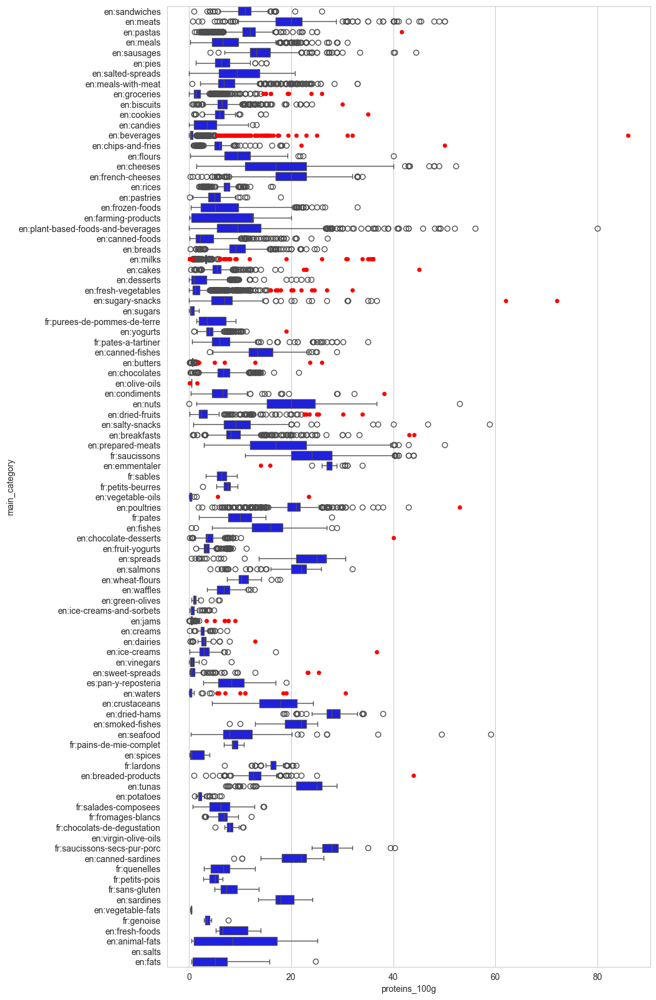

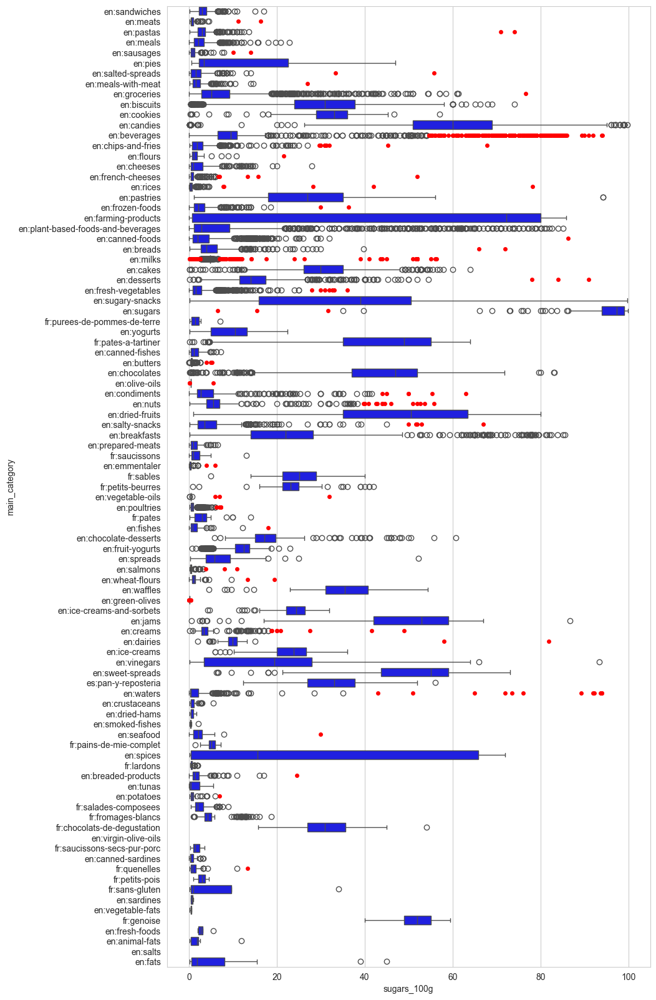

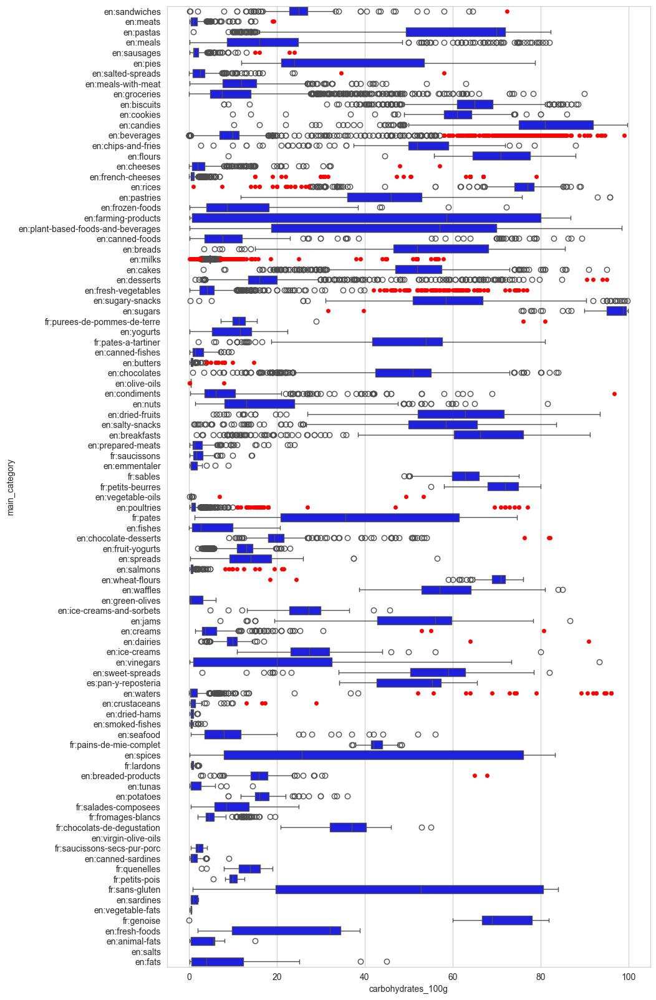

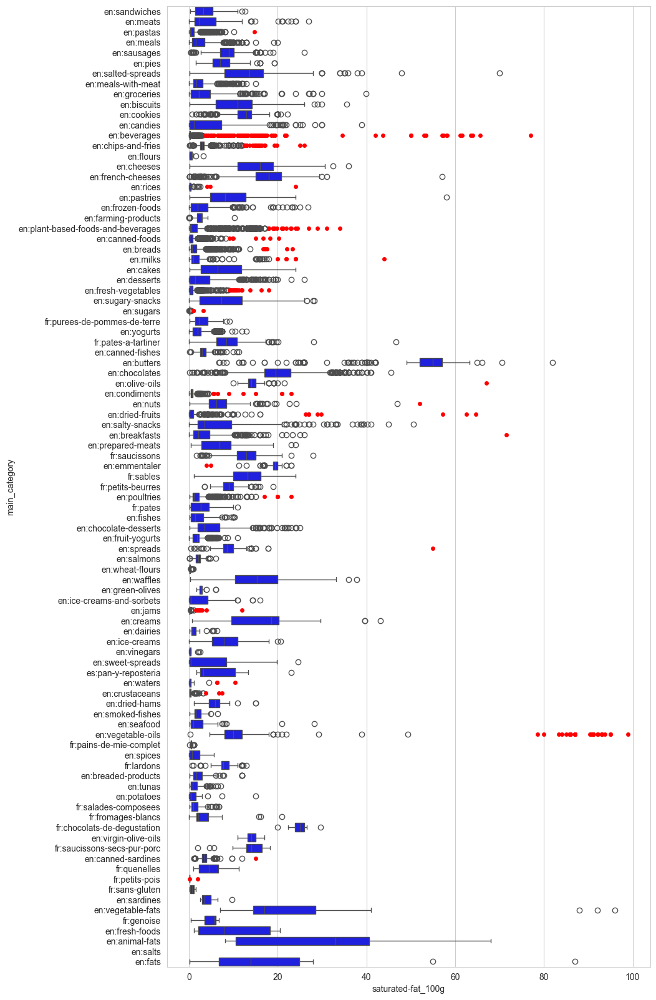

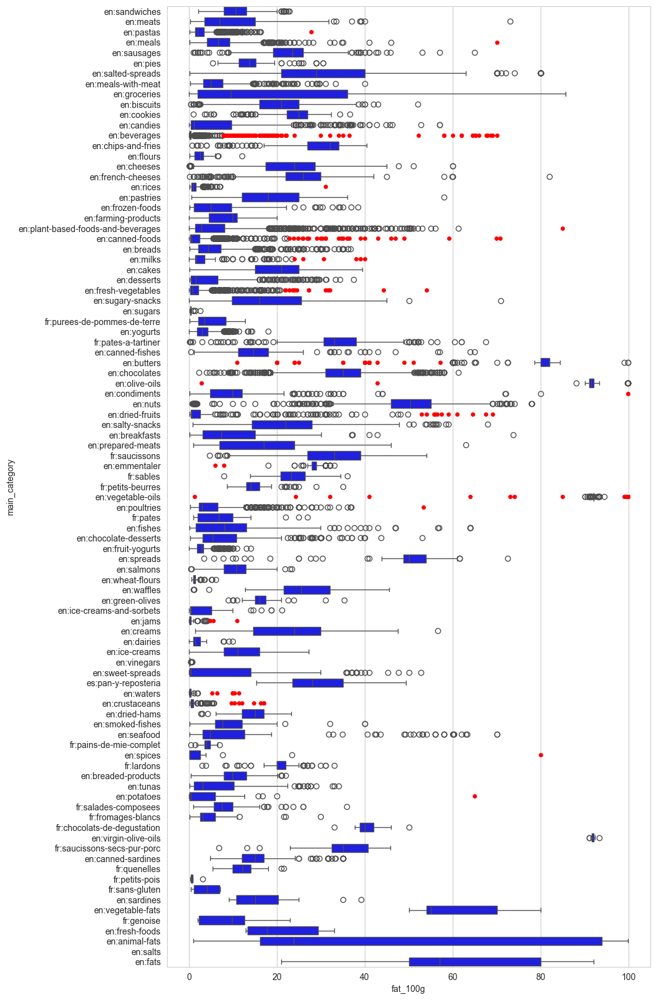

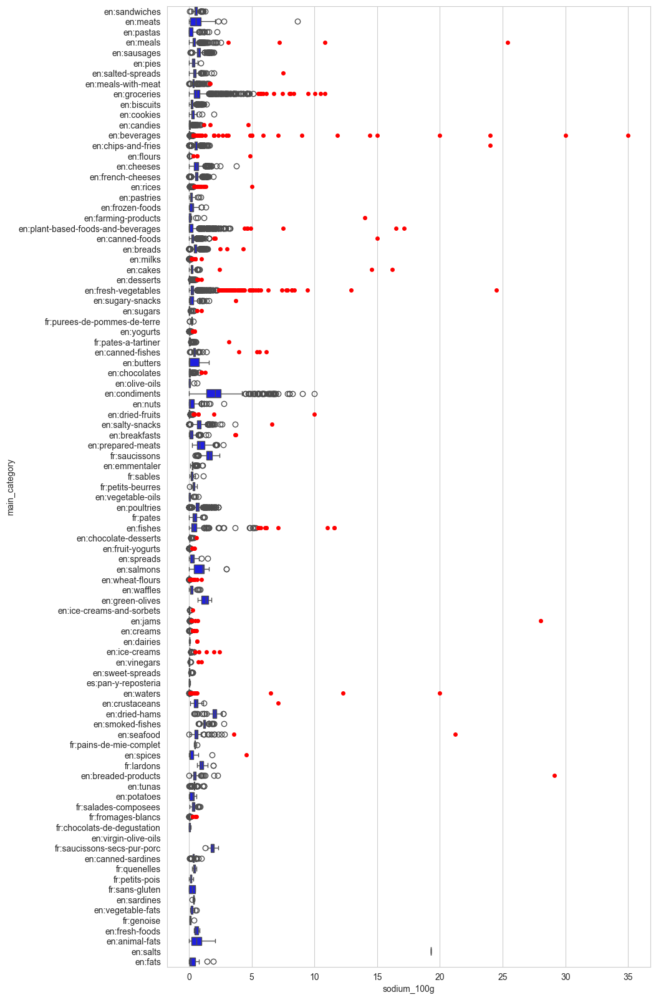

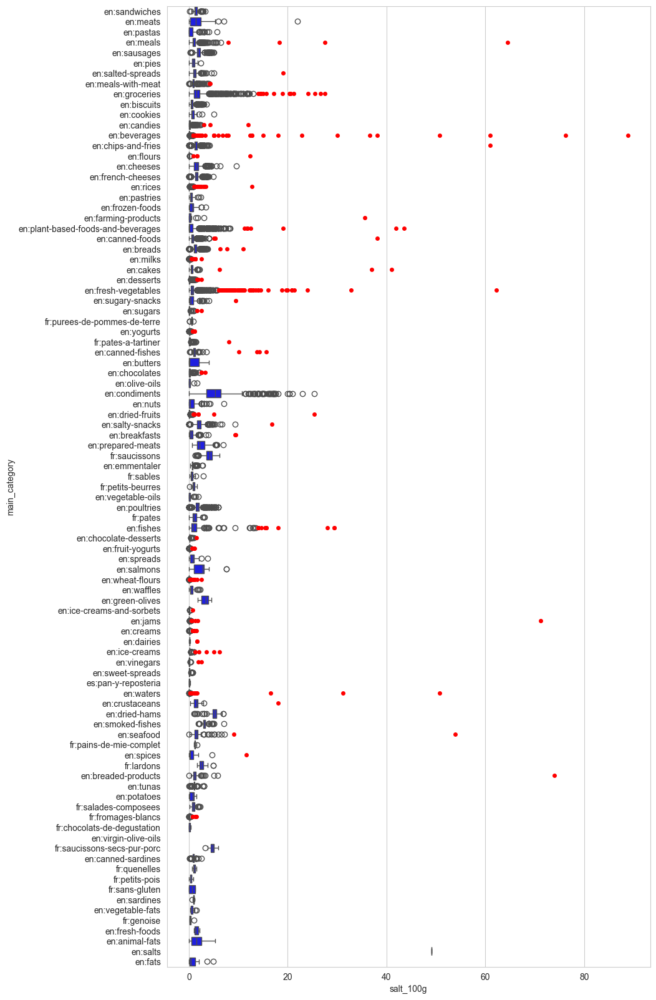

In [ ]:
identify_outliers_iqr(df=filtered_data, categorical_col="main_category", numeric_cols=NUTRIENTS_COLS, factor=10)

Even with a factor of 10, outlier detection with IQR rule seems too strict and could have a significant impact on some distributions.  
It is very likely that there would be a lot of false positives. Therefore, this method will not be applied.  
Some outliers may remain. It is assumed that their impact iwill not be significant for the rest of the analysis.

## Missing data handling

### Using linear regression

In [ ]:
def impute_using_linreg(df:pd.DataFrame, target:str, threshold:float, visualize:bool=False, impute:bool=True):
    corr_matrix = df.corr(numeric_only=True, min_periods=100)**2
    corr_series = corr_matrix[target].sort_values(ascending=False)

    # Select correlated features
    correlated_features = corr_series[corr_series > threshold].index.difference([target]).tolist()

    if not correlated_features:
        print(f"No correlated features found for target '{target}'.")
        return

    if visualize:
        n = len(correlated_features)
        fig, axes = plt.subplots(n, figsize=(10, 5*n), gridspec_kw={'hspace':0.3})
        if not isinstance(axes, np.ndarray): # If there is only 1 correlated feature, therefore only 1 ax
            axes = [axes] # Convert it to a list to make it iterable
        for ax, corr_feature in zip(axes, correlated_features):
            r_square = corr_series[corr_feature]
            corr_coef = AnchoredText(f"R² = {round(r_square, 2)}", loc="upper left")
            ax.add_artist(corr_coef)
            ax.set_title(f"Illustration of the correlation between '{corr_feature}' and '{target}'")
            sns.regplot(data=df, x=corr_feature, y=target, ci=None, ax=ax)

    if impute:
      missing_target_data = df.loc[df[target].isna() & df[correlated_features].notna().all(axis=1)]
      train_data = df.loc[df[target].notna() & df[correlated_features].notna().all(axis=1)]

      el_to_predict_cnt = missing_target_data.shape[0]
      if el_to_predict_cnt == 0:
          print(f"""No value of target '{target}' can be predicted using features '{"', '".join(correlated_features)}'.""")
          return
      
      print(f"""{el_to_predict_cnt} values of target '{target}' can be predicted using features '{"', '".join(correlated_features)}'.""")

      # Prepare training data
      X_train = train_data[correlated_features]
      y_train = train_data[target]

      # Train the regression model
      model = LinearRegression(positive=True)
      model.fit(X_train, y_train)

      # Predict missing values
      X_missing = missing_target_data[correlated_features]
      df.loc[df[target].isna() & df[correlated_features].notna().all(axis=1), target] = model.predict(X_missing)

No correlated features found for target 'additives_n'.
No correlated features found for target 'ingredients_from_palm_oil_n'.
No correlated features found for target 'ingredients_that_may_be_from_palm_oil_n'.
No correlated features found for target 'energy_100g'.
No correlated features found for target 'fat_100g'.
No correlated features found for target 'saturated-fat_100g'.
No correlated features found for target 'carbohydrates_100g'.
No correlated features found for target 'sugars_100g'.
No correlated features found for target 'proteins_100g'.
No value of target 'salt_100g' can be predicted using features 'sodium_100g'.
3 values of target 'sodium_100g' can be predicted using features 'salt_100g'.
No value of target 'nutrition-score-fr_100g' can be predicted using features 'nutrition-score-uk_100g'.
No value of target 'nutrition-score-uk_100g' can be predicted using features 'nutrition-score-fr_100g'.


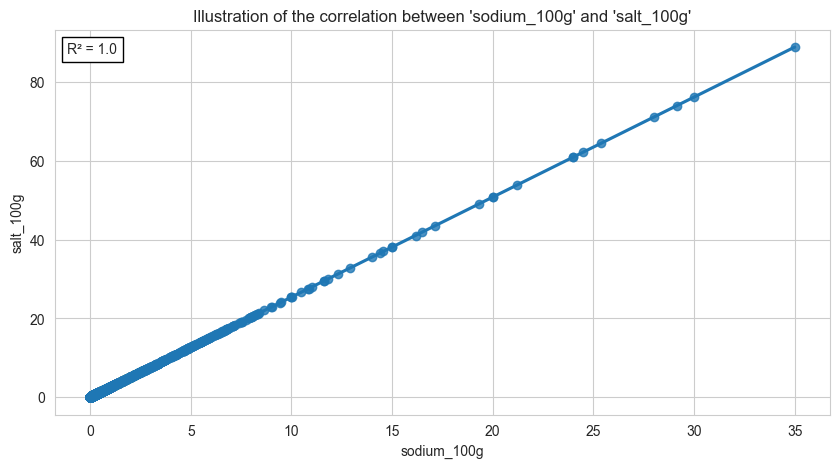

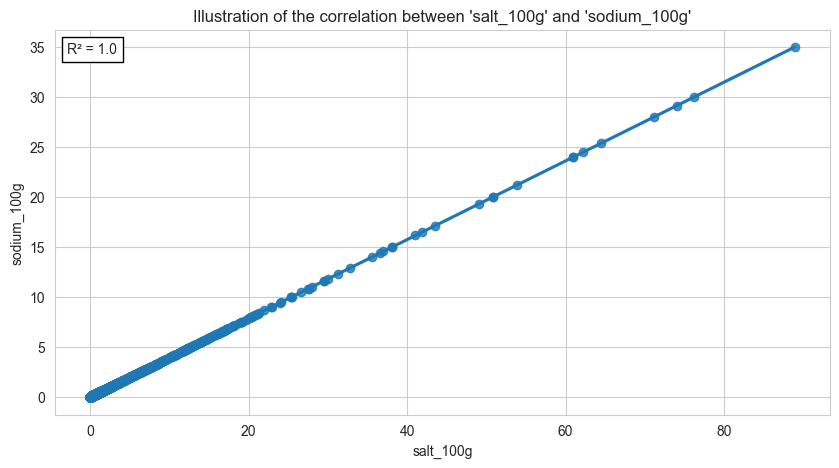

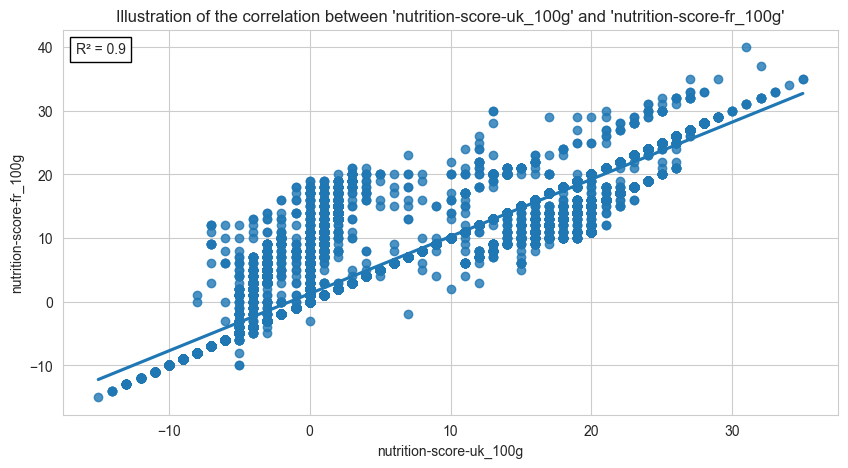

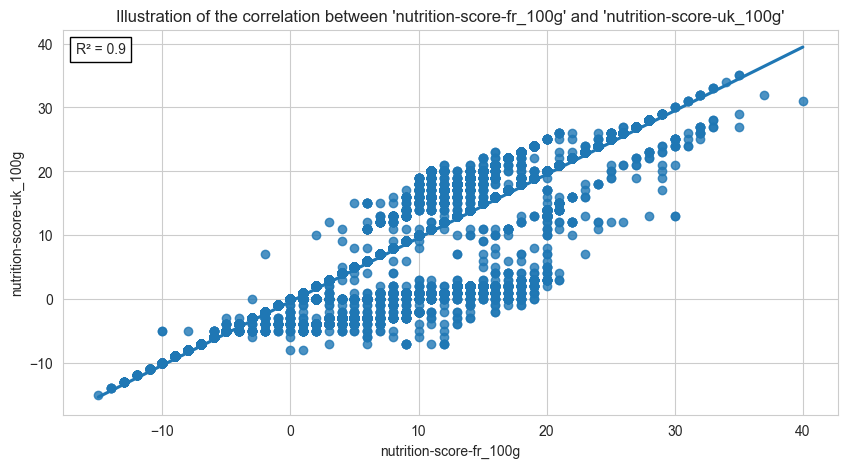

In [ ]:
for col in filtered_data.select_dtypes(include=np.number).columns:
    impute_using_linreg(df=filtered_data, target=col, threshold=0.85, visualize=True)

### Remove highly correlated

In [ ]:
def remove_outliers(s: pd.Series) -> pd.Series:
    '''
    Removes outliers from a Series based on the IQR method.

    Parameters:
    s (pd.Series): Series from which to remove outliers.

    Returns:
    pd.Series: Series with outliers replaced by NaN.
    '''
    s_copy = s.copy()
    
    q1 = s_copy.quantile(0.25)
    q3 = s_copy.quantile(0.75)
    iqr = q3 - q1

    # Define the bounds for outliers
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    # Remove rows with outliers
    s_copy.loc[(s_copy < lower_bound) | (s_copy > upper_bound)] = np.nan

    return s_copy

In [ ]:
# Apply a list of functions to transform the data
def transform_data(df:pd.DataFrame, funcs:list[Callable]) -> pd.DataFrame:
    '''
    Applies a list of functions to transform the DataFrame.

    Parameters:
    df (pd.DataFrame): DataFrame to transform.
    funcs (list[Callable]): List of functions to apply to the DataFrame.

    Returns:
    pd.DataFrame: Transformed DataFrame.
    '''
    df_copy = df.copy()
    if funcs is not None and len(funcs) > 0:
        for f in funcs:
            try:
                # Iterate over numeric columns
                for col in df_copy.select_dtypes(include=[np.number]).columns:
                    df_copy[col] = f(df_copy[col])
            except AttributeError:
                df_copy = f(df_copy)

    return df_copy

In [ ]:
def draw_heatmap(corr_matrix:pd.DataFrame, **plot_params):
    '''
    Draws a heatmap for the given correlation matrix.

    Parameters:
    corr_matrix (pd.DataFrame): Correlation matrix to visualize.
    '''
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    fig, ax = plt.subplots(figsize=(15, 10))
    ax = sns.heatmap(corr_matrix, ax=ax, mask=mask, center=0, **plot_params)
    ax.set_xticklabels(labels=[twp.fill(c, 20) for c in corr_matrix.columns], fontsize=16)
    ax.set_yticklabels(labels=[twp.fill(c, 20) for c in corr_matrix.columns], fontsize=16)
    ax.set_title("Correlation matrix", size=24)
    plt.plot()

In [ ]:
def drop_highly_correlated_features(df:pd.DataFrame, threshold:float):
    df_copy = df.copy()

    df_copy.loc["Missing Data Percentage"] = df_copy.select_dtypes(include=np.number).isna().mean()
    df_copy.sort_values(by="Missing Data Percentage", axis=1, inplace=True, ascending=False)
    df_copy.drop(index="Missing Data Percentage", inplace=True)

    transformed_df = transform_data(df_copy, [remove_outliers])
    corr_matrix = transformed_df.corr(min_periods=20, numeric_only=True)
    draw_heatmap(corr_matrix=corr_matrix, vmin=-1, vmax=1, cmap="vlag", annot=True, fmt=".2f", annot_kws={'fontsize':12})
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    tri = corr_matrix.where(~mask)

    # sns.heatmap(data=tri, vmin=-1, vmax=1, mask=mask, cmap="vlag", annot=True, fmt=".2f")

    to_drop = [column for column in tri.columns if any(tri[column] > threshold)]
    print(f"Dropped columns: {', '.join(to_drop)}")

    return df.drop(columns=to_drop)


Dropped columns: salt_100g, nutrition-score-fr_100g


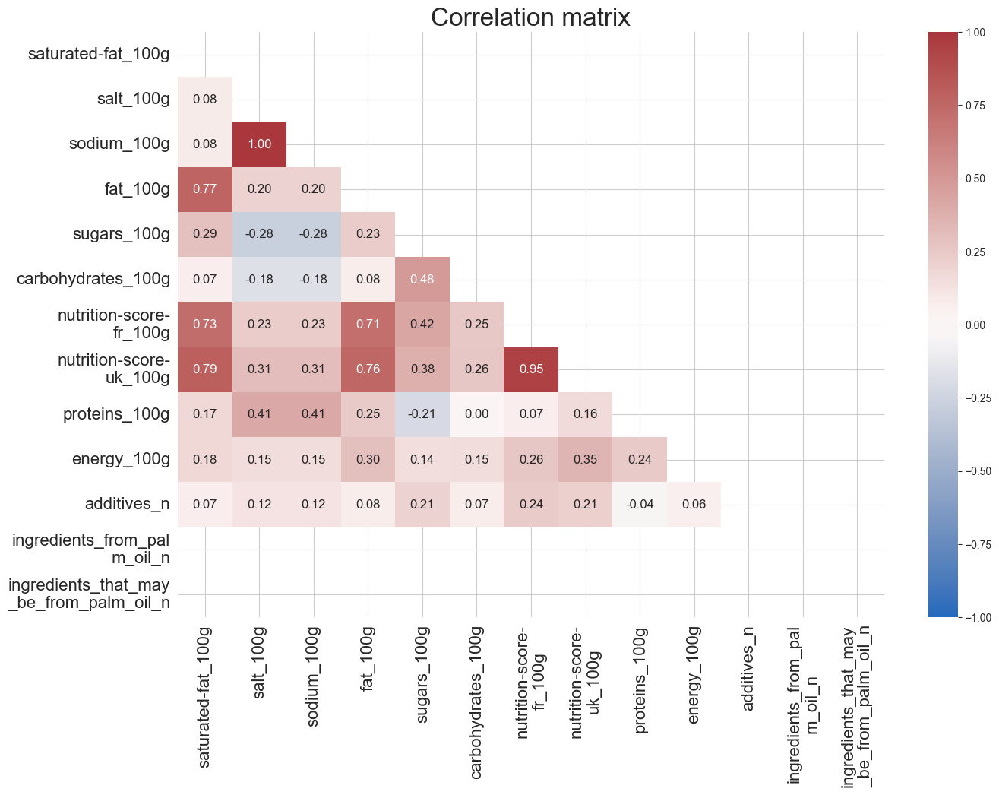

In [ ]:
filtered_data = drop_highly_correlated_features(filtered_data, 0.9)

### Using median imputation

In [ ]:
def simple_imputation(df:pd.DataFrame, group:str, cols:list[str]=NUTRIENTS_COLS, method:Callable="median", variation_threshold:float=3, count_threshold:int=20):
    '''
    Imputes missing values for a specified indicator in a DataFrame using group averages or a specified method.

    Parameters:
    df (pd.DataFrame): Original DataFrame.
    group (str): Grouping variable for aggregation.
    cols (list): List of columns where missing values should be imputed. Defaults to NUTRIENTS_COLS.
    method (Callable): Imputation method (e.g., mean, median). Defaults to "median".

    Returns:
    pd.DataFrame: DataFrame with imputed values for the specified cols.
    '''

    if isinstance(method, str):
      method_name = method
    elif isinstance(method, Callable):
      method_name = method.__name__
    else:
      raise TypeError("Argument 'method' should be of type 'str' or 'Callable'.")
    
    df_copy = df.copy()

    cols = [c for c in cols if c in df_copy]
    assert len(cols) > 0
      
    d = dict.fromkeys(cols, [method, 'std', "count"])


    medians_and_count = df_copy[cols+[group]].groupby(group).agg(d)
    
    for col in cols:
      print(f"\n{"*"*30}\n{col}")
      missing_data = df_copy.loc[(df_copy[col].isna()) & (df_copy[group].notna())]
      missing_values_count = missing_data.shape[0]
      if missing_values_count == 0:
        print(f"No data to estimate for '{col}'.")
      else:
        print(f"{missing_values_count} missing values")
        group_values = missing_data[group]
        variation_condition = ((medians_and_count.loc[group_values, (col, "count")] == 0) | (medians_and_count.loc[group_values, (col, "std")] < variation_threshold))
        count_condition = (medians_and_count.loc[group_values, (col, "count")] > count_threshold)
        condition_mask = variation_condition & count_condition

        print(f"{condition_mask.sum()} missing values can be estimated:")

        condition_mask = condition_mask.set_axis(group_values.index)
        missing_data.loc[condition_mask, col] = medians_and_count.loc[group_values[condition_mask], (col, method_name)].set_axis(missing_data.loc[condition_mask, col].index)
        df_copy.update(missing_data)

        print(f"{(variation_condition & ~count_condition).sum()} missing values could not be estimated due to insufficient data.")
        print(f"{(count_condition & ~variation_condition).sum()} missing values could not be estimated because coefficient of variation was too high.")
        print(f"{(~variation_condition & ~count_condition).sum()} missing values could not be estimated because none of the condition above were met.")

    return df_copy

In [ ]:
simple_imputation(df=filtered_data, group="generic_name", count_threshold=10)


******************************
proteins_100g
19387 missing values
1273 missing values can be estimated:
16350 missing values could not be estimated due to insufficient data.
235 missing values could not be estimated because coefficient of variation was too high.
1529 missing values could not be estimated because none of the condition above were met.

******************************
sugars_100g
22200 missing values
1465 missing values can be estimated:
18310 missing values could not be estimated due to insufficient data.
417 missing values could not be estimated because coefficient of variation was too high.
2008 missing values could not be estimated because none of the condition above were met.

******************************
carbohydrates_100g
20560 missing values
1113 missing values can be estimated:
16537 missing values could not be estimated due to insufficient data.
660 missing values could not be estimated because coefficient of variation was too high.
2250 missing values could n

In [ ]:
filtered_data = simple_imputation(df=filtered_data, group="generic_name", count_threshold=10)


******************************
proteins_100g
19387 missing values
1273 missing values can be estimated:
2482 missing values could not be estimated due to insufficient data.
235 missing values could not be estimated because coefficient of variation was too high.
15397 missing values could not be estimated because none of the condition above were met.

******************************
sugars_100g
22200 missing values
1465 missing values can be estimated:
2685 missing values could not be estimated due to insufficient data.
417 missing values could not be estimated because coefficient of variation was too high.
17633 missing values could not be estimated because none of the condition above were met.

******************************
carbohydrates_100g
20560 missing values
1113 missing values can be estimated:
2226 missing values could not be estimated due to insufficient data.
660 missing values could not be estimated because coefficient of variation was too high.
16561 missing values could n

In [ ]:
filtered_data = simple_imputation(df=filtered_data, group="main_category", cols=NUTRIENTS_COLS)


******************************
proteins_100g
18300 missing values
12413 missing values can be estimated:
326 missing values could not be estimated due to insufficient data.
5459 missing values could not be estimated because coefficient of variation was too high.
102 missing values could not be estimated because none of the condition above were met.

******************************
sugars_100g
20911 missing values
5451 missing values can be estimated:
347 missing values could not be estimated due to insufficient data.
14638 missing values could not be estimated because coefficient of variation was too high.
475 missing values could not be estimated because none of the condition above were met.

******************************
carbohydrates_100g
19618 missing values
1857 missing values can be estimated:
299 missing values could not be estimated due to insufficient data.
16991 missing values could not be estimated because coefficient of variation was too high.
471 missing values could not 

### Characterizing the type of missing data (MCAR, MAR, MNAR)

<Axes: >

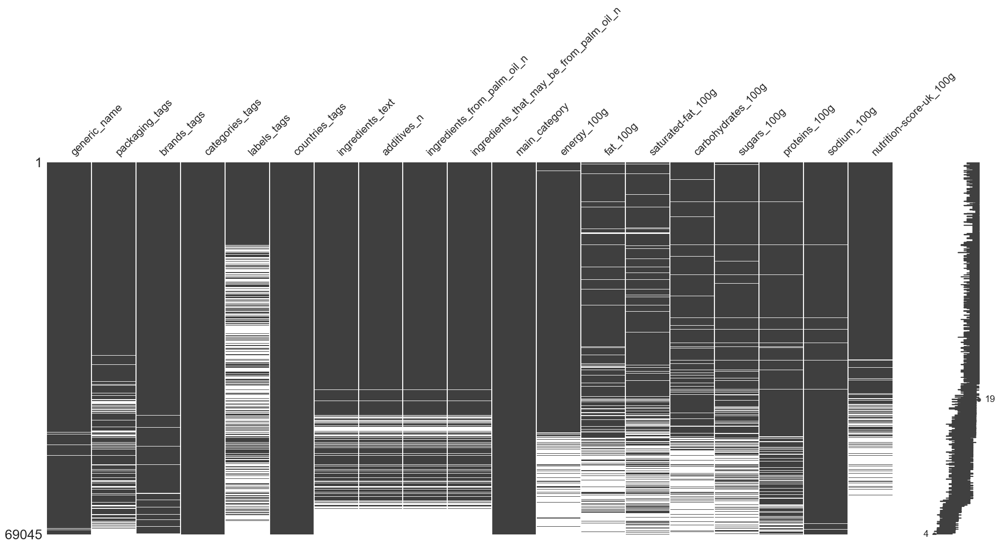

In [ ]:
msno.matrix(df=filtered_data) # products are still sorted by ascending missing values

<Axes: >

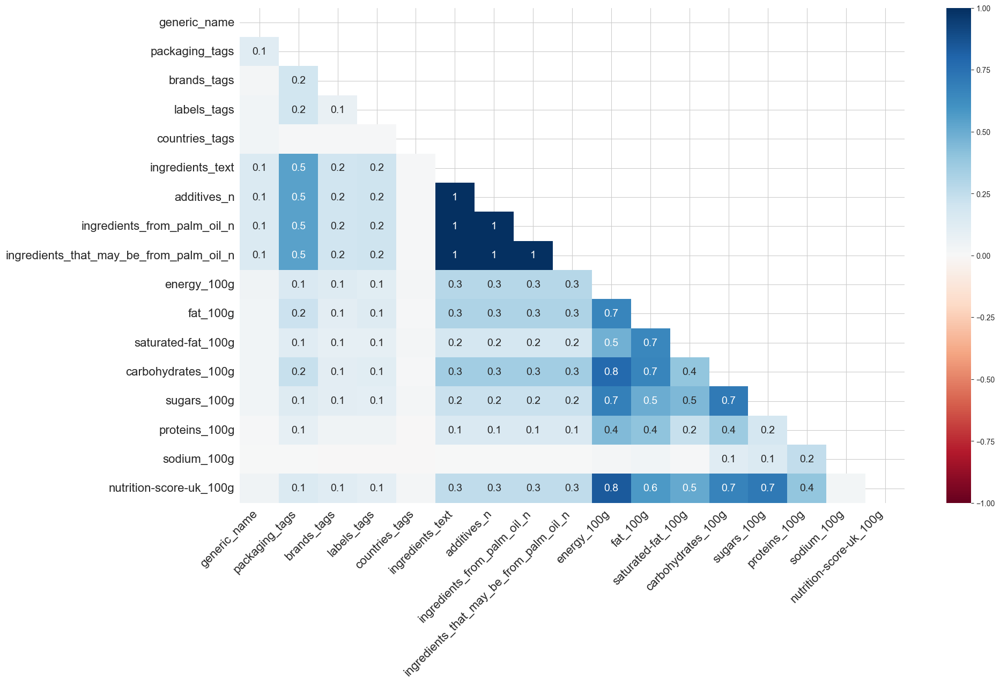

In [ ]:
msno.heatmap(df=filtered_data)

<Axes: >

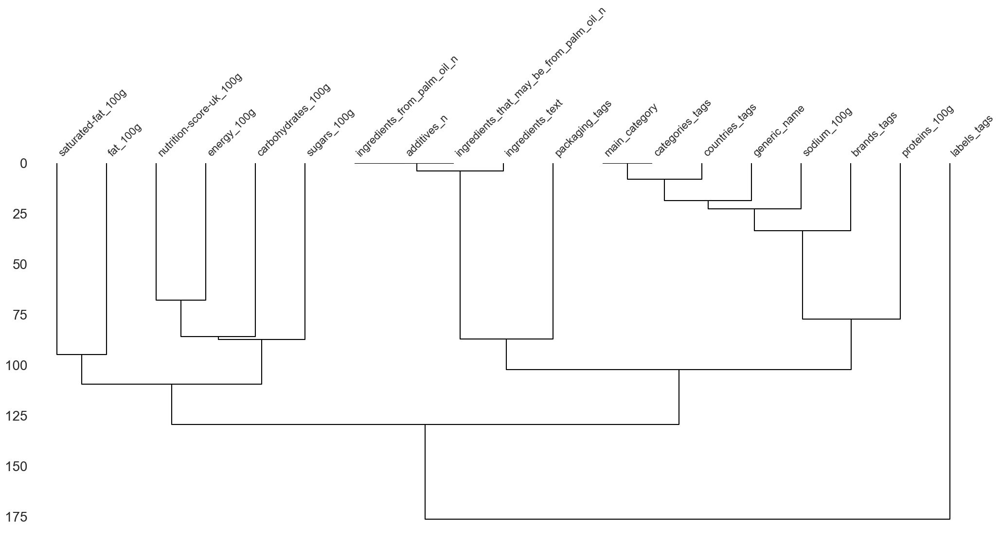

In [ ]:
msno.dendrogram(df=filtered_data)

We can clearly observe a correlation between missing values of some columns. This likely excludes MCAR type.  
After exploring and going through the data, it seems those relations cannot be explained by the measured data.  
However, it is difficult to determine whether it is MAR or MNAR.  
Here are some ideas to exaplin the missing data:

- Time of day: at night, less values filled because contributors are tired (but it depends on timezone so hard to measure)
- External events: contributor is not fully focused or does not really have time, for example contributors are likely to being shopping when filling information
- Type of products (might be measurable with main_category or packaging_tags): Some information might be easier to retrieve on some products than on others.

The data could be qualified as MNAR (Missing Not At Random). This could actually becomes an issue when using traditional imputation methods, so the results of this study should be taken with caution.

### Using K-Nearest Neighbors

In [ ]:
def edit_distance_unordered(list1, list2):
    # Noticed a bit late that this function is actually really close to "1 - SequenceMatcher(a=x, b=y).ratio()", which works for lists
    # Only difference is that it does not give the same result if there are duplicates in the lists
    """Calculate distance between 2 unordered lists based on the number of insertions and deletions."""
    set1, set2 = set(list1), set(list2)
    deletions = len(set1 - set2)  # Elements in list1 but not in list2
    insertions = len(set2 - set1)  # Elements in list2 but not in list1
    return (deletions + insertions) / (len(set1) + len(set2))

In [ ]:
def distance_nan_and_numeric(x, y):
    """Handle NaN and numeric differences efficiently."""
    if isinstance(x, list) or isinstance(y, list) or pd.isna(x) or pd.isna(y):
        return 1
    return abs(x-y) # I don't think using absolute is really necessary here because we're computing the euclidian distance just after

def custom_metric(X, Y):
    """Compute distance between 2 arrays."""
    # Convert to NumPy arrays for efficient processing
    X = np.array(X, dtype=object)
    Y = np.array(Y, dtype=object)
    str_dist = [1 - SequenceMatcher(a=x, b=y).ratio() if isinstance(x, str) and isinstance(y, str) else 0 for x, y in zip(X, Y)]
    numeric_dist = [distance_nan_and_numeric(x, y) if isinstance(x, (int, float, type(pd.NA), type(None))) or isinstance(y, (int, float , type(pd.NA), type(None))) else 0 for x, y in zip(X, Y)]
    other_dist = [edit_distance_unordered(x, y) if isinstance(x, list) and isinstance(y, list) else 0 for x, y in zip(X, Y)] # Noticed a bit late that edit_distance_unordered is actually really close to "1 - SequenceMatcher(a=x, b=y).ratio()", even for lists
    # Combine numeric and non-numeric differences
    difference = [string + num + non_num for string, num, non_num in zip(str_dist, numeric_dist, other_dist)]
    # Compute the distance
    distance = np.linalg.norm(difference)
    return distance

In [ ]:
def build_and_save_model(df: pd.DataFrame, n_neighbors:int, filename: str) -> None:
  """Build and save a model to a file."""
  print(f"{datetime.now()} - Computing distance matrix...")
  distance_matrix = compute_parallel_distance_matrix(X=df, metric=custom_metric)
  # print(f"{datetime.now()} - Distance matrix computed successfully.")
  print(f"{datetime.now()} - Building model...")
  neigh = NearestNeighbors(n_neighbors=n_neighbors, metric="precomputed")
  neigh.fit(distance_matrix)
  # print(f"{datetime.now()} - Model has been built successfully.")
  print(f"{datetime.now()} - Saving model...")
  with open(filename, 'wb') as f:
    pickle.dump(neigh, f)
  # print(f"{datetime.now()} - Model has been saved successfully.")
  
  return neigh

def load_model(filename: str) -> NearestNeighbors:
  """Load a model from a file."""
  # print("Loading model...")
  with open(filename, 'rb') as f:
    return pickle.load(f)

In [ ]:
def imputation(df:pd.DataFrame, features_to_estimate:list[str], n_neighbors:int=16, method:Literal['build_and_save', 'load']='build_and_save', file_suffix:str=None):
    '''
    Imputes missing values for specified features in a DataFrame using group averages or a specified method.

    Parameters:
    df (pd.DataFrame): Original DataFrame.
    features_to_estimate (str): Features for which missing data needs to be imputed.
    group_columns (str): Possible grouping variables for aggregation. All combinations will be attempted and the one with the lowest variation will be chosen for each missing value.
    method (Literal): Indicates whether the model should be built from scratch and saved ('save'), or rather loaded from a file ('load'). Defaults to 'save'.

    Returns:
    pd.DataFrame: DataFrame with imputed values for the specified indicator.
    '''    
    df_copy = df.copy()

    df_copy.reset_index(inplace=True, drop=True)

    # Transform columns with list-like values with split
    for col in LISTLIKE_COLS:
      if col in df_copy:
        df_copy[col] = df_copy[col].apply(lambda x: x.split(',') if isinstance(x, str) else x)
    
    numeric_columns = df_copy.select_dtypes(include=np.number).columns
    # Scale between 0 and 1
    scaler = MinMaxScaler() # This is sensitive to outliers
    df_scaled = df_copy.copy()
    df_scaled[numeric_columns] = pd.DataFrame(scaler.fit_transform(df_scaled[numeric_columns]), columns=numeric_columns)
    
    missing_data = df_scaled.loc[df_scaled[features_to_estimate].isna().any(axis=1)]

    if file_suffix is None:
       file_suffix = datetime.strftime(datetime.now(), "%Y%m%d_%H%M%S")
    filename = os.path.join('utils', 'models', f'{n_neighbors}_neighbors_{df_copy.shape[0]}_{file_suffix}.sav')

    if method == "load":
        neigh = load_model(filename)
        # print("Model has been loaded successfully.")
    elif method == "build_and_save":
        neigh = build_and_save_model(df=df_scaled, n_neighbors=n_neighbors, filename=filename)
    else:
        raise ValueError("Invalid method. Use 'build_and_save' or 'load'.")

    nbrs_indices = neigh.kneighbors(n_neighbors=n_neighbors, return_distance=False)

    @timeit
    def impute_missing(missing_data:pd.DataFrame, complete_data:pd.DataFrame, indices):
        imputed_data = complete_data.copy()
        for col in missing_data.columns:
            for i, row in missing_data.iterrows():
                if not isinstance(row[col], list) and pd.isna(row[col]):
                    neighbors = [complete_data.iloc[j][col] for j in indices[i] if isinstance(complete_data.iloc[j][col], list) or not pd.isna(complete_data.iloc[j][col])]
                    if not neighbors:
                      continue
                    if isinstance(neighbors[0], str):
                        imputed_data.at[i, col] = max(set(neighbors), key=neighbors.count) if neighbors else None
                    elif isinstance(neighbors[0], (float, int)):
                        imputed_data.at[i, col] = np.median(neighbors)
                    elif isinstance(neighbors[0], list):
                        list_union = [item for sublist in neighbors for item in sublist]
                        c = Counter(list_union)
                        # print(f"neighbors: {neighbors} // list_union: {list_union} // max_frequency_item: {max_frequency_item}")
                        imputed_data.at[i, col] = [k for k, v in c.items() if v>3] if neighbors else None
                    else:
                        imputed_data.at[i, col] = neighbors[0]
        return imputed_data
    
    imputed_data = impute_missing(missing_data=missing_data, complete_data=df_copy, indices=nbrs_indices)

    for col in LISTLIKE_COLS:
      if col in df_copy:
        imputed_data[col] = imputed_data[col].apply(lambda x: ','.join(x) if isinstance(x, list) else x)

    return imputed_data

In [ ]:
def random_imputation(df:pd.DataFrame, features_to_estimate:list[str]):
    '''
    Imputes missing values for specified features in a DataFrame using group averages or a specified method.

    Parameters:
    df (pd.DataFrame): Original DataFrame.
    features_to_estimate (str): Features for which missing data needs to be imputed.
    group_columns (str): Possible grouping variables for aggregation. All combinations will be attempted and the one with the lowest variation will be chosen for each missing value.
    method (Literal): Indicates whether the model should be built from scratch and saved ('save'), or rather loaded from a file ('load'). Defaults to 'save'.

    Returns:
    pd.DataFrame: DataFrame with imputed values for the specified indicator.
    '''    
    df_copy = df.copy()

    df_copy.reset_index(inplace=True, drop=True)

    # Transform columns with list-like values with split
    for col in LISTLIKE_COLS:
      if col in df_copy:
        df_copy[col] = df_copy[col].apply(lambda x: x.split(',') if isinstance(x, str) else x)
    
    numeric_columns = df_copy.select_dtypes(include=np.number).columns
    # Scale between 0 and 1
    scaler = MinMaxScaler() # This is sensitive to outliers
    df_scaled = df_copy.copy()
    df_scaled[numeric_columns] = pd.DataFrame(scaler.fit_transform(df_scaled[numeric_columns]), columns=numeric_columns)
    
    missing_data = df_scaled.loc[df_scaled[features_to_estimate].isna().any(axis=1)]

    @timeit
    def impute_missing(missing_data:pd.DataFrame, complete_data:pd.DataFrame):
        imputed_data = complete_data.copy()
        for col in missing_data.columns:
            for i, row in missing_data.iterrows():
                if not isinstance(row[col], list) and pd.isna(row[col]):
                    if col not in numeric_columns and col not in LISTLIKE_COLS:
                        imputed_data.at[i, col] = complete_data[col].dropna().sample(n=1, ignore_index=True)[0]
                    elif col in numeric_columns:
                        imputed_data.at[i, col] = np.random.random()
                    elif col in LISTLIKE_COLS:
                        random_list = complete_data[col].dropna().sample(n=1, ignore_index=True)[0]
                        imputed_data.at[i, col] = np.random.choice(random_list)
                    else:
                        imputed_data.at[i, col] = complete_data[col].dropna().sample(n=1, ignore_index=True)[0]
        return imputed_data
    
    imputed_data = impute_missing(missing_data=missing_data, complete_data=df_copy)

    for col in LISTLIKE_COLS:
      if col in imputed_data:
        imputed_data[col] = imputed_data[col].apply(lambda x: ','.join(x) if isinstance(x, list) else x)

    return imputed_data

In [ ]:
def build_test_data(df:pd.DataFrame, max_samples:int=1000):
    rng = np.random.RandomState(42)
    
    # Only keep samples with no missing values and only keep max_samples rows
    complete_portion = df.loc[df.notna().all(axis=1)][:max_samples]
    complete_portion.reset_index(inplace=True, drop=True)
    n_samples, n_features = complete_portion.shape
    
    # Create mask to insert random missing values
    cov = df.isna().cov()
    mean = df.isna().mean()
    mask = np.abs(rng.multivariate_normal(mean, cov, size=n_samples)).round(0)
    
    # Avoid completely empty rows
    mask[mask.all(1), rng.choice(range(n_features))] = 0

    df_with_missing = complete_portion.mask(mask.astype(bool))

    return complete_portion, df_with_missing

In [ ]:
def score_nan_and_numeric(x, y):
    """Handle NaN and numeric differences efficiently."""
    if isinstance(x, list) or isinstance(y, list) or pd.isna(x) or pd.isna(y):
        return 0
    return 1 - abs(x-y)

In [ ]:
def getImputationScore(ref:pd.DataFrame, test:pd.DataFrame, imputed:pd.DataFrame):
    
    ref_copy = ref.copy()
    imputed_copy = imputed.copy()

    df_compare = ref_copy.compare(imputed_copy, keep_shape=True, keep_equal=True)
    mask_na_after_multiindex = ref_copy.compare(imputed_copy, keep_shape=True, keep_equal=True).isnull()
    mask_na_after_multiindex = mask_na_after_multiindex * 3

    mask_diff_multiindex = ref_copy.compare(imputed_copy, keep_shape=True).notnull()
    mask_diff_multiindex = mask_diff_multiindex * 2

    mask_na_initial = test.isna()
    mask_na_initial_multiindex = pd.DataFrame(columns=df_compare.columns)
    for col in mask_na_initial.columns:
        mask_na_initial_multiindex[col, 'self'] = mask_na_initial[col]
        mask_na_initial_multiindex[col, 'other'] = mask_na_initial[col]

    mask_color_multiindex = mask_na_initial_multiindex + mask_diff_multiindex + mask_na_after_multiindex
    
    def apply_color(x):
        # Black: value was already there, no imputation needed
        # Green: the prediction is fully correct
        # Fuschia: Issue during imputation, no imputation was needed but it resulted in nan
        # Maroon: the prediction is not fully correct (does not mean that the score is 0 though)
        # Red: value was supposed to be predicted but no prediction was made 
        colors = {0: 'black', 1: 'green', 2:'fuchsia', 3:'maroon', 4:'red'}
        return mask_color_multiindex.map(lambda val: 'background-color: {}'.format(colors.get(val,'')))
    
    numeric_columns = ref_copy.select_dtypes(include=np.number).columns
    # Scale between 0 and 1
    scaler = MinMaxScaler()
    ref_copy[numeric_columns] = pd.DataFrame(scaler.fit_transform(ref_copy[numeric_columns]), columns=numeric_columns)
    imputed_copy[numeric_columns] = pd.DataFrame(scaler.transform(imputed_copy[numeric_columns]), columns=numeric_columns)
    
    # Transform columns with list-like values with split
    for col in LISTLIKE_COLS:
      if col in ref_copy:
        ref_copy[col] = ref_copy[col].apply(lambda x: x.split(',') if isinstance(x, str) else x)
        imputed_copy[col] = imputed_copy[col].apply(lambda x: x.split(',') if isinstance(x, str) else x)

    def wrapper_calc_score(ref:pd.Series, imputed:pd.Series):
      """Compute the custom metric efficiently."""
      return ref.combine(imputed, calc_score)
    
    def calc_score(ref, imputed):
      if isinstance(ref, str) and isinstance(imputed, str):
         return ref == imputed
      if isinstance(ref, (int, float, type(pd.NA), type(None))) or isinstance(imputed, (int, float, type(pd.NA), type(None))):
         return score_nan_and_numeric(ref, imputed)
      return set(imputed) and len(set(imputed).intersection(ref)) / len(set(imputed))
    
    score_df = ref_copy.combine(imputed_copy, wrapper_calc_score)
    score_df = score_df.mask(~mask_na_initial)

    score_df["mean_score"] = score_df.mean(axis=1)
    score_df.sort_values(by="mean_score", ascending=True, inplace=True)

    summarized_score_df = pd.DataFrame(data={"mean": score_df.drop(columns="mean_score").mean(), "sum":score_df.drop(columns="mean_score").sum()})

    str_cols = list(set(ref.select_dtypes(include="object").columns) - set(LISTLIKE_COLS))
    num_cols = ref.select_dtypes(include=np.number).columns

    summarized_score_df.loc["num", :] = [summarized_score_df.loc[num_cols, "mean"].mean(), summarized_score_df.loc[num_cols, "sum"].sum()]
    summarized_score_df.loc["str", :] = [summarized_score_df.loc[str_cols, "mean"].mean(), summarized_score_df.loc[str_cols, "sum"].sum()]
    summarized_score_df.loc["listlike", :] = [summarized_score_df.loc[[col for col in LISTLIKE_COLS if col in score_df.columns], "mean"].mean(), summarized_score_df.loc[[col for col in LISTLIKE_COLS if col in score_df.columns], "sum"].sum()]
    summarized_score_df.loc["global", :] = [summarized_score_df["mean"].mean(), summarized_score_df["sum"].sum()]
    
    return score_df, summarized_score_df, df_compare.style.apply(apply_color, axis=None)

#### Understanding how the score is calculated

Here is an example of what could look the dataframes passed as arguments in "getImputationScore" function:

In [ ]:
# Complete dataframe with no missing data
ref_test = pd.DataFrame(
    {'numeric':[0.1, 0.4, 0.5],
     'string': ['category1', 'sweet things', 'category_test'],
     'labels_tags':['lettre_a, lettre_b, test_c', 'd_test, e_lettre, f__', 'gest, example, nan']} # we're using a listlike column name so that it is recognized as such in the score calculation
)
ref_test

,numeric,string,labels_tags
0,0.1,category1,"lettre_a, lettre_b, test_c"
1,0.4,sweet things,"d_test, e_lettre, f__"
2,0.5,category_test,"gest, example, nan"


In [ ]:
# Dataframe with missing values added following missing data pattern in original dataframe
test_test = pd.DataFrame(
    {'numeric':[0.1, 0.4, np.nan],
     'string': [np.nan, np.nan, np.nan],
     'labels_tags':['lettre_a, lettre_b, test_c', np.nan, 'gest, example, nan']}
)
test_test

,numeric,string,labels_tags
0,0.1,NaN,"lettre_a, lettre_b, test_c"
1,0.4,NaN,NaN
2,NaN,NaN,"gest, example, nan"


In [ ]:
# Resulting imputed dataframe after custom knn imputation
imputed_test = pd.DataFrame(
    {'numeric':[0.1, 0.4, 0.3],
     'string': ['category', np.nan, 'category_test'],
     'labels_tags':['lettre_a, lettre_b, test_c', 'd_test', 'gest, example, nan']}
)
imputed_test

,numeric,string,labels_tags
0,0.1,category,"lettre_a, lettre_b, test_c"
1,0.4,NaN,d_test
2,0.3,category_test,"gest, example, nan"


In [ ]:
score_test, summarized_score_test, heatmap_test = getImputationScore(ref_test, test_test, imputed_test)

And here is what would the score results look like in that case:

In [ ]:
score_test

,numeric,string,labels_tags,mean_score
0,NaN,False,NaN,0.0
1,NaN,0,1.0,0.5
2,0.5,True,NaN,0.75


In [ ]:
summarized_score_test

,mean,sum
numeric,0.5,0.5
string,0.333333,1
labels_tags,1.0,1.0
num,0.5,0.5
str,0.333333,1
listlike,1.0,1.0
global,0.611111,5.0


In [ ]:
heatmap_test

Built
Execution of function impute_missing took 0.4874 seconds
Imputed


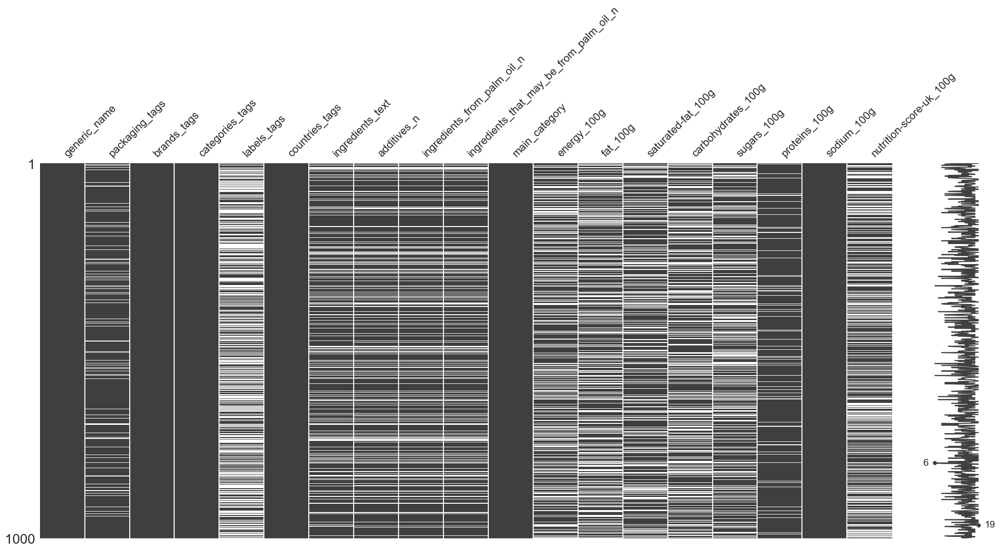

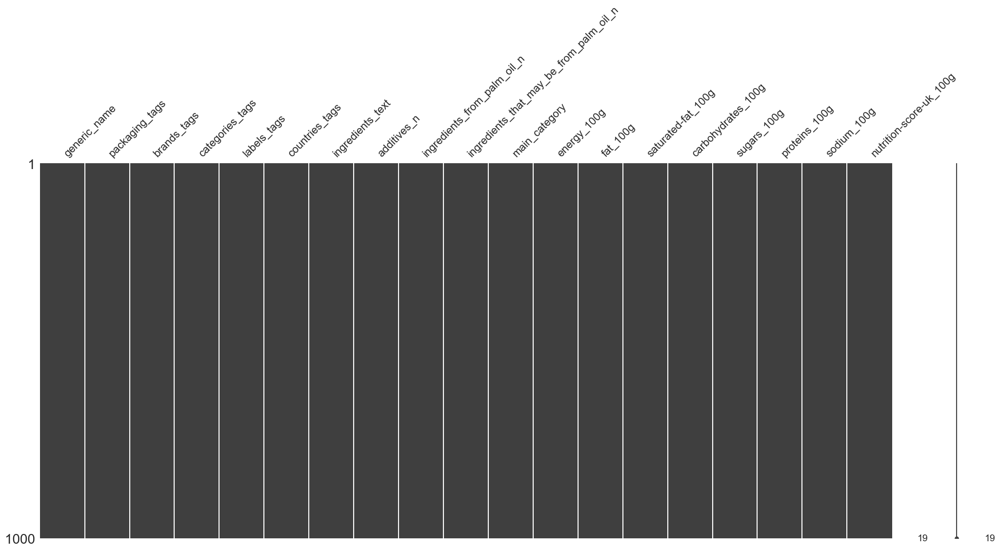

In [ ]:
# Perform random imputation, used as reference to better understand performance of custom knn imputation See "summarized_score" dataframe to have an overview of the performance.
ref, test = build_test_data(df=filtered_data, max_samples=1000)
print("Built")
msno.matrix(test)
imputed = pd.DataFrame(random_imputation(df=test, features_to_estimate=test.columns[test.isna().any()]))
print("Imputed")
msno.matrix(imputed)
score_random_imputation, summarized_score_random_imputation, heatmap_random_imputation = getImputationScore(ref, test, imputed)

Built
2025-02-14 15:39:26.180886 - Computing distance matrix...
Execution of function compute_parallel_distance_matrix took 8.2540 seconds
2025-02-14 15:39:34.428854 - Building model...
2025-02-14 15:39:34.428854 - Saving model...
Execution of function impute_missing took 4.2687 seconds
Imputed


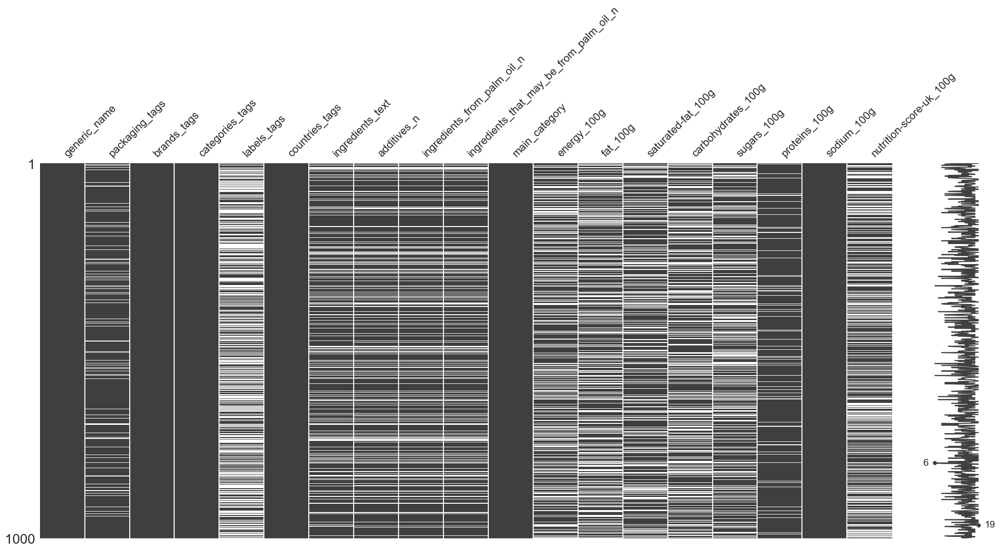

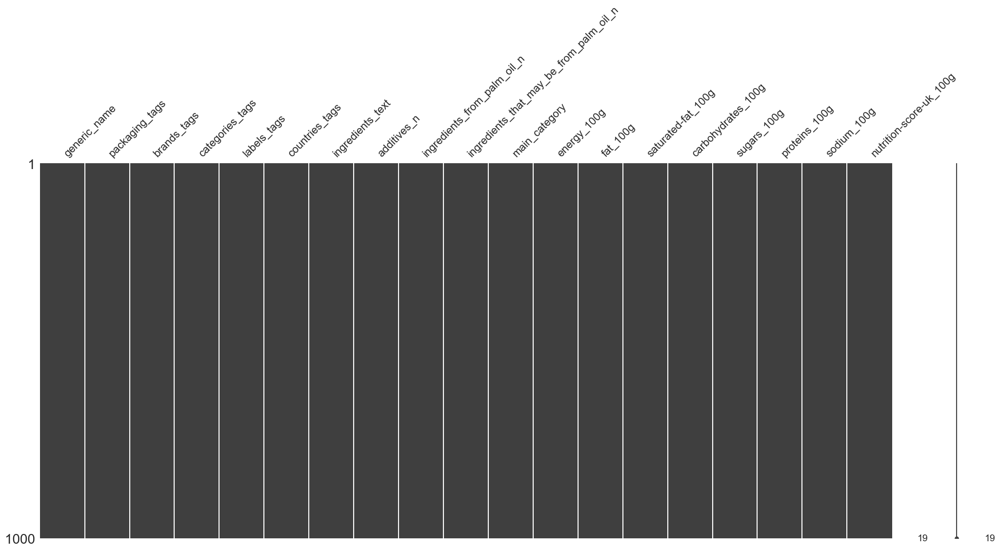

In [ ]:
# Test performance of imputation method. See "summarized_score" dataframe to have an overview of the performance.
ref, test = build_test_data(df=filtered_data, max_samples=1000)
print("Built")
msno.matrix(test)
# cProfile.run('imputation(df=test, features_to_estimate=test.columns[test.isna().any()], n_neighbors=16, method="build_and_save")', sort='cumtime')
imputed = pd.DataFrame(imputation(df=test, features_to_estimate=test.columns[test.isna().any()], n_neighbors=16, method="build_and_save"))
print("Imputed")
msno.matrix(imputed)
score, summarized_score, heatmap = getImputationScore(ref, test, imputed)

In [ ]:
summarized_score

,mean,sum
generic_name,NaN,0
packaging_tags,0.453167,45.316667
brands_tags,NaN,0.0
categories_tags,NaN,0.0
labels_tags,0.467354,245.361111
countries_tags,NaN,0.0
ingredients_text,0.227245,49.766667
additives_n,0.928,208.8
ingredients_from_palm_oil_n,0.973333,219.0
ingredients_that_may_be_from_palm_oil_n,0.974815,219.333333


Accuracy of imputation for list-like columns containing missing values (labels_tags, ingredients_text, packaging_tags) is low. They will therefore be removed, it is assumed that they do not bring significant additional information. 

In [ ]:
filtered_data.drop(columns=["labels_tags", "ingredients_text", "packaging_tags", "brands_tags"], inplace=True)

In [ ]:
# Impute using knn. Be careful, this line is really computationally intensive:
# With 20 cores and using multithreading, took about 6 hours.
# One option to reduce the execution time would be to reduce the number of products (for example the ones with the most missing values)
# filtered_data_imputed = pd.DataFrame(imputation(df=filtered_data, features_to_estimate=filtered_data.columns[filtered_data.isna().any()], n_neighbors=16, method="build_and_save"))

In [ ]:
# File "16_neighbors_69045_*******_*******.sav" is needed to execute this line (loads the previously built model)
# Takes about 18 minutes
# filtered_data_imputed = pd.DataFrame(imputation(df=filtered_data, features_to_estimate=filtered_data.columns[filtered_data.isna().any()], n_neighbors=16, method="load", file_suffix="20250131_005602"))

In [ ]:
path_to_precomputed_csv = os.path.join("utils", "filtered_data_imputed.csv")

In [ ]:
# Save the resulting dataframe in a csv file
# filtered_data_imputed.to_csv(path_to_precomputed_csv)

c:\Git-OpenClassrooms\DS_3\.venv\Lib\site-packages\missingno\missingno.py:61: UserWarning: Plotting a sparkline on an existing axis is not currently supported. To remove this warning, set sparkline=False.
  warnings.warn(


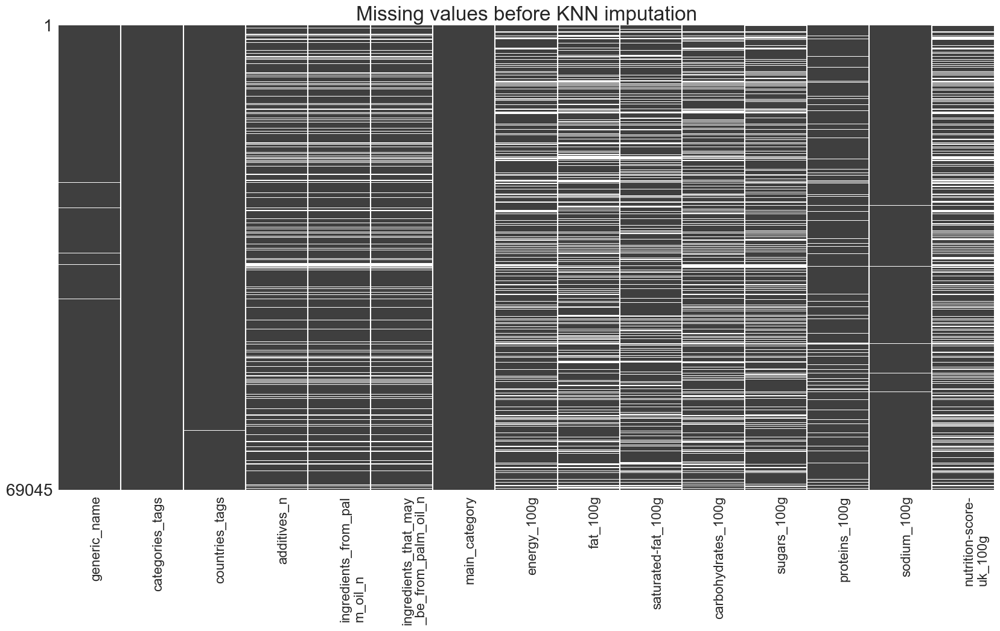

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
msno.matrix(filtered_data.sample(filtered_data.shape[0]), ax=ax)
ax.set_title("Missing values before KNN imputation", size=24)
ax.set_xticklabels(labels=[twp.fill(c, 20) for c in filtered_data.columns], fontsize=16)
ax.tick_params(axis='x', labelbottom=True, labeltop=False, rotation=90)

In [ ]:
# Most efficient method is to load the resulting dataframe (after knn imputation) from the csv file directly
filtered_data_imputed = pd.read_csv(path_to_precomputed_csv, index_col=0)

c:\Git-OpenClassrooms\DS_3\.venv\Lib\site-packages\missingno\missingno.py:61: UserWarning: Plotting a sparkline on an existing axis is not currently supported. To remove this warning, set sparkline=False.
  warnings.warn(


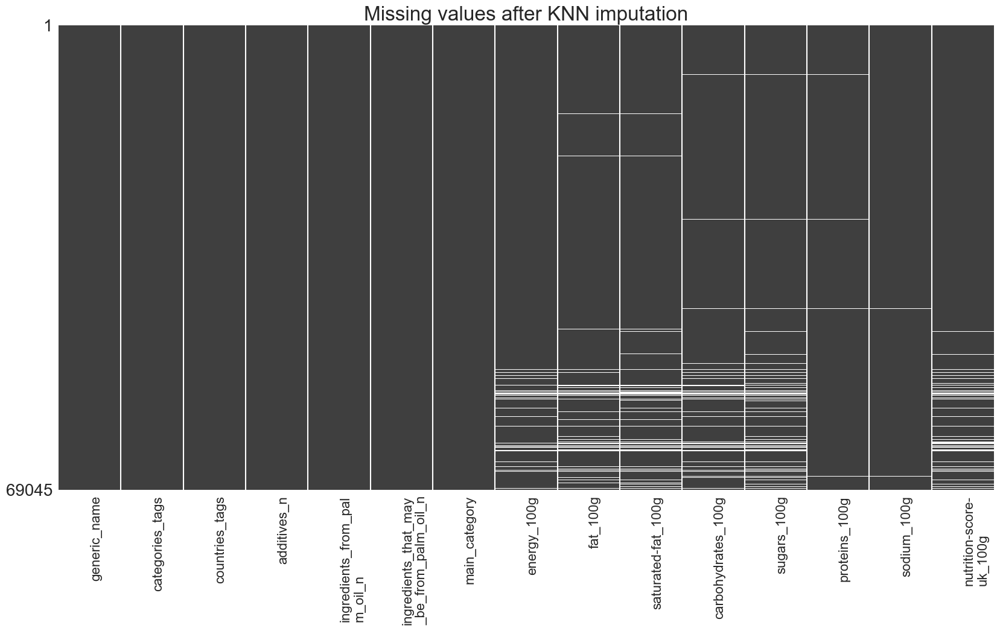

In [ ]:
fig, ax = plt.subplots(figsize=(20,10))
msno.matrix(filtered_data_imputed, ax=ax)
ax.set_title("Missing values after KNN imputation", size=24)
ax.set_xticklabels(labels=[twp.fill(c, 20) for c in filtered_data_imputed.columns], fontsize=16)
ax.tick_params(axis='x', labelbottom=True, labeltop=False, rotation=90)

It seems it was more difficult to impute missing values for products which had more missing values before imputing (at the bottom).
Let's complete the imputation using similar methods as the ones used until now.

### Completing imputation using various methods


******************************
proteins_100g
300 missing values
300 missing values can be estimated:
0 missing values could not be estimated due to insufficient data.
0 missing values could not be estimated because coefficient of variation was too high.
0 missing values could not be estimated because none of the condition above were met.

******************************
sugars_100g
3725 missing values
3725 missing values can be estimated:
0 missing values could not be estimated due to insufficient data.
0 missing values could not be estimated because coefficient of variation was too high.
0 missing values could not be estimated because none of the condition above were met.

******************************
carbohydrates_100g
3147 missing values
3147 missing values can be estimated:
0 missing values could not be estimated due to insufficient data.
0 missing values could not be estimated because coefficient of variation was too high.
0 missing values could not be estimated because none of 

<Axes: >

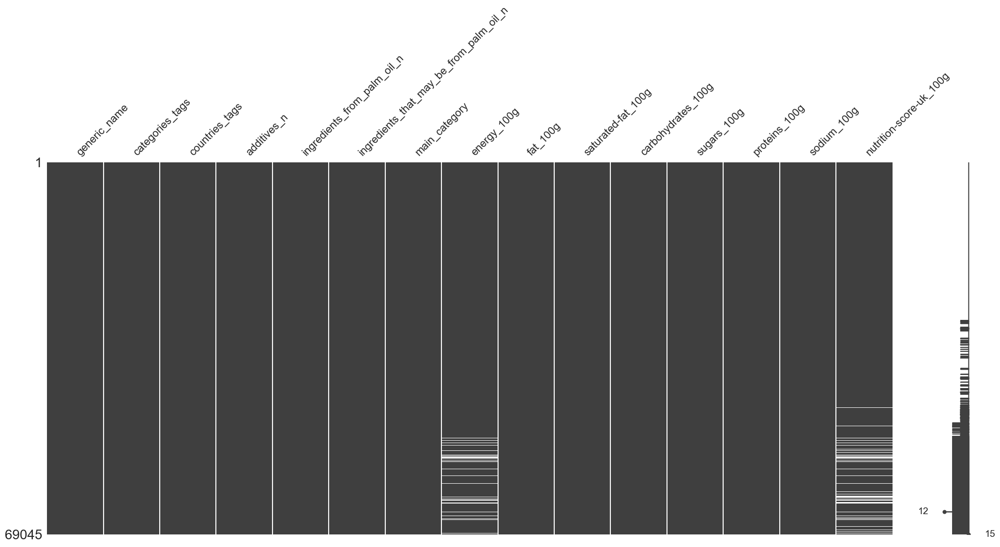

In [ ]:
# Complete median imputation on nutrients columns with more permissive thresholds
filtered_data_post_imputation = simple_imputation(df=filtered_data_imputed, group="main_category", cols=NUTRIENTS_COLS, variation_threshold=100, count_threshold=5)
msno.matrix(filtered_data_post_imputation)

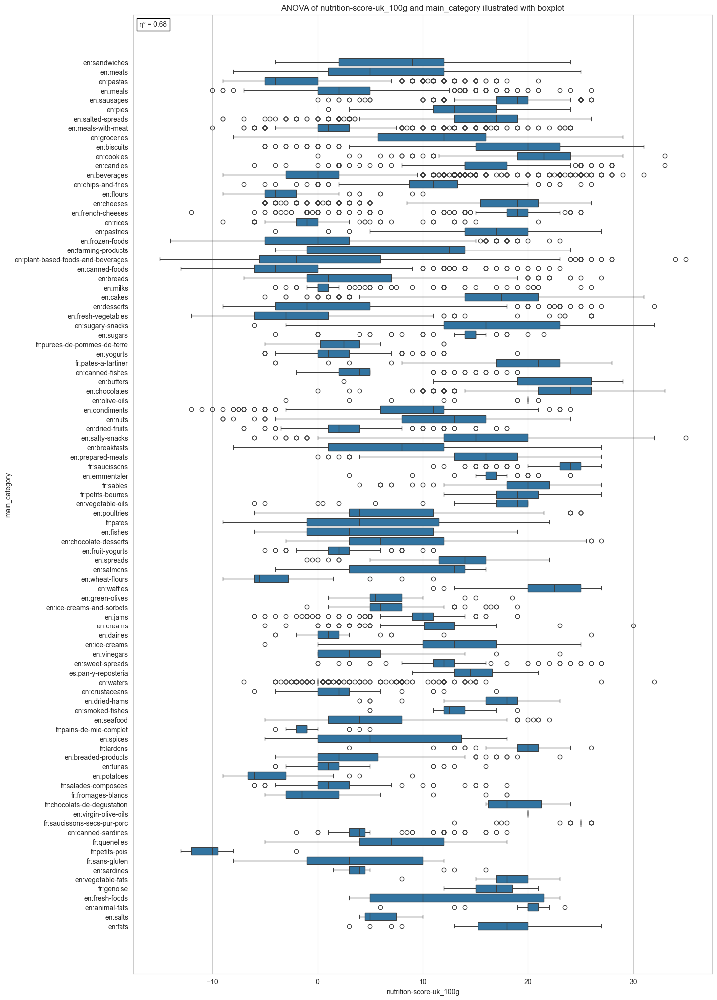

In [ ]:
ANOVA(df=filtered_data_post_imputation, x="nutrition-score-uk_100g", y="main_category", plot_function=sns.boxplot)


******************************
nutrition-score-uk_100g
3319 missing values
3319 missing values can be estimated:
0 missing values could not be estimated due to insufficient data.
0 missing values could not be estimated because coefficient of variation was too high.
0 missing values could not be estimated because none of the condition above were met.


<Axes: >

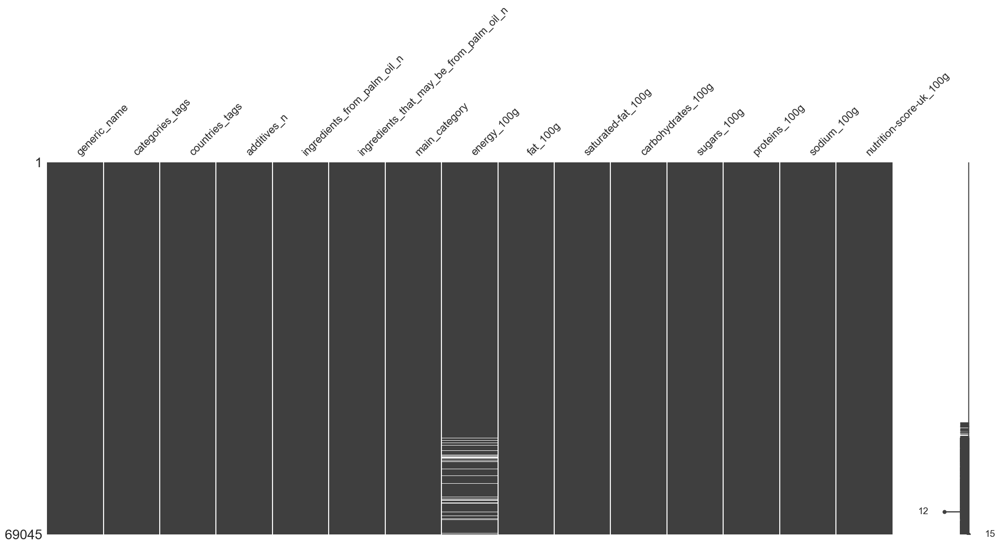

In [ ]:
# It seems relevant to impute nutrition-score-uk_100g variable based on the median of each main_category group
filtered_data_post_imputation = simple_imputation(df=filtered_data_post_imputation, group="main_category", cols=["nutrition-score-uk_100g"], variation_threshold=10, count_threshold=5)
msno.matrix(filtered_data_post_imputation)

### Using logic and available data

As said previsouly, 1 g of fat corresponds to 9 kcal, 1g of carbohydrates or proteins corresponds to 4 kcal approximately and 1g of alcohol brings about 7 kcal.  
Alcohol is not in the filtered dataset, therefore energy estimation might be a bit far from reality for products containing alcohol. 

In [ ]:
condition_mask = filtered_data_post_imputation["energy_100g"].isna() & filtered_data_post_imputation["carbohydrates_100g"].notna() & filtered_data_post_imputation["proteins_100g"].notna() & filtered_data_post_imputation["fat_100g"].notna()
print(f"Energy of {condition_mask.sum()} products can be estimated using linear combination of macronutrients quantity.")
filtered_data_post_imputation.loc[condition_mask, "energy_100g"] = 4*filtered_data_post_imputation.loc[condition_mask, "carbohydrates_100g"] + 4*filtered_data_post_imputation.loc[condition_mask, "proteins_100g"] + 9*filtered_data_post_imputation.loc[condition_mask, "fat_100g"]

Energy of 2237 products can be estimated using linear combination of macronutrients quantity.


<Axes: >

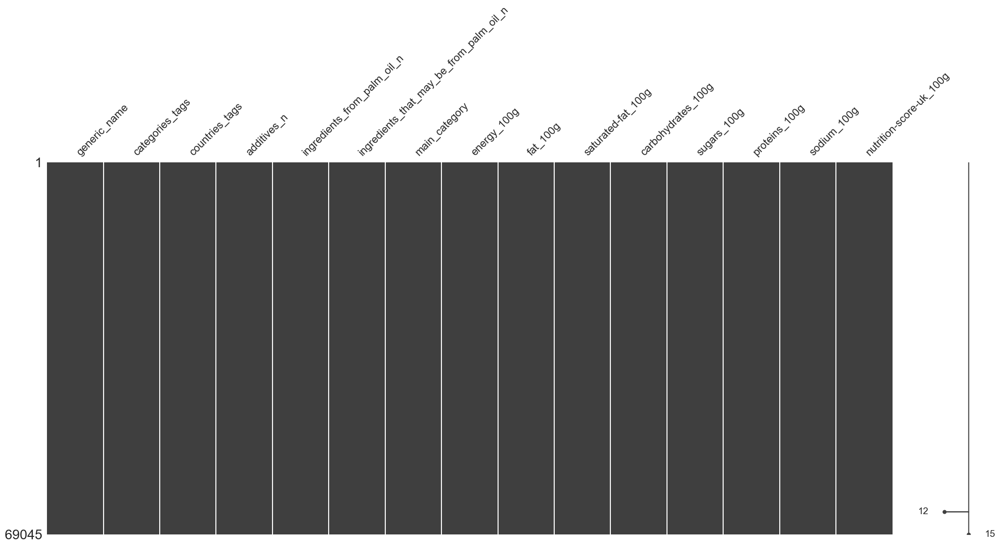

In [ ]:
msno.matrix(filtered_data_post_imputation)

In [ ]:
filtered_data_post_imputation.loc[filtered_data_post_imputation.isna().any(axis=1)]

,generic_name,categories_tags,countries_tags,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,main_category,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,sodium_100g,nutrition-score-uk_100g
64849,pronto nero peppermint sugar free chewing gum,"chewing gum,confectioneries,sugary snacks",(United States),NaN,NaN,NaN,en:sugary-snacks,724.0,0.2,5.95,71.0,38.7,6.7,0.145335,2.0


There still are a few products with some missing values. Let's remove them.

In [ ]:
# Remove products with remaining missing values
products_count_with_missing_values = filtered_data_post_imputation.isna().any(axis=1).sum()
print(f"{products_count_with_missing_values} products still contain missing values and will be removed.")
filtered_data_post_imputation.dropna(inplace=True)

1 products still contain missing values and will be removed.


## Analysis of the complete dataset

### Univariate analysis

In [ ]:
filtered_data_post_imputation_info = get_df_variables_info(filtered_data_post_imputation)

This DataFrame has 69044 rows and 15 columns.


In [ ]:
filtered_data_post_imputation_info

,column_type,missing_value_percentage,nbr_unique_values,nbr_null_values,nbr_non_null_values,duplicates_percentage,mode,min,max,mean,median,std,unique_values,additional_comment
additives_n,float64,0.0,40,0,69044,99.94,0.0 (32707 occurrence(s)),0.000000e+00,31.00,1.635841,1.000000,2.400023,too many to display,First 6 unique values represent 91.0% of total...
carbohydrates_100g,float64,0.0,2381,0,69044,96.55,1.0 (2904 occurrence(s)),1.000000e-03,99.95,25.495435,11.600000,26.931852,too many to display,None
categories_tags,object,0.0,15173,0,69044,78.02,"biscuits and cakes,biscuits,sugary snacks (789...",NaN,NaN,NaN,NaN,NaN,too many to display,None
countries_tags,object,0.0,478,0,69044,99.31,France (49908 occurrence(s)),NaN,NaN,NaN,NaN,NaN,too many to display,None
energy_100g,float64,0.0,5540,0,69044,91.98,44.099000000000004 (1763 occurrence(s)),0.000000e+00,900.00,375.477738,360.898662,197.639282,too many to display,None
fat_100g,float64,0.0,1948,0,69044,97.18,0.5 (5619 occurrence(s)),1.000000e-03,99.90,12.249572,4.650000,16.754260,too many to display,None
generic_name,object,0.0,41067,0,69044,40.52,fromage industriel de france a pate fraiche au...,NaN,NaN,NaN,NaN,NaN,too many to display,None
ingredients_from_palm_oil_n,float64,0.0,4,0,69044,99.99,0.0 (65505 occurrence(s)),0.000000e+00,2.00,0.051663,0.000000,0.224337,"0.0 (65505 occurrences), 1.0 (3439 occurrences...",None
ingredients_that_may_be_from_palm_oil_n,float64,0.0,9,0,69044,99.99,0.0 (62729 occurrence(s)),0.000000e+00,5.00,0.116317,0.000000,0.405778,too many to display,First 1 unique values represent 91.0% of total...
main_category,object,0.0,93,0,69044,99.87,en:beverages (9921 occurrence(s)),NaN,NaN,NaN,NaN,NaN,too many to display,None


In [ ]:
def overview_univariate_distributions(df:pd.DataFrame):
  for col in df:#.select_dtypes(include=object):
      data = df[col].copy()
      if col in LISTLIKE_COLS:
        data = data.str.split(',').explode()
      dtype = data.dtype
      value_counts = data.value_counts()
      entropy_value = entropy(value_counts)
      sns.set_style("whitegrid")
      if entropy_value < 2 or dtype == bool:  # Arbitrary threshold
        significant_values = value_counts[value_counts >= 0.15*value_counts.max()]
        other_count = value_counts[value_counts < 0.15*value_counts.max()].sum()
        value_counts = pd.concat([significant_values, pd.Series({'Other': other_count})])
        fig, ax = plt.subplots(figsize=(3,3))
        ax.pie(value_counts.values, labels=value_counts.index, autopct='%1.1f%%', colors=sns.color_palette("pastel"))
        ax.set_title(f"Overview of the distribution of {col}")
      elif dtype == "float64" or dtype == "int64":
        unique_values = data.unique()
        fig, ax = plt.subplots(figsize=(10,5))
        sns.histplot(data=data, ax=ax, kde=len(unique_values)>=50, bins=min(len(unique_values), 50), discrete=len(unique_values)<50)
        ax.set_title(f"Distribution of {col}", size=16)
      else:
        fig, ax = plt.subplots(figsize=(10,10))
        sns.barplot(value_counts.iloc[:50], ax=ax, orient='h')
        ax.set_title(f"Overview of the distribution of {col}", size=24)

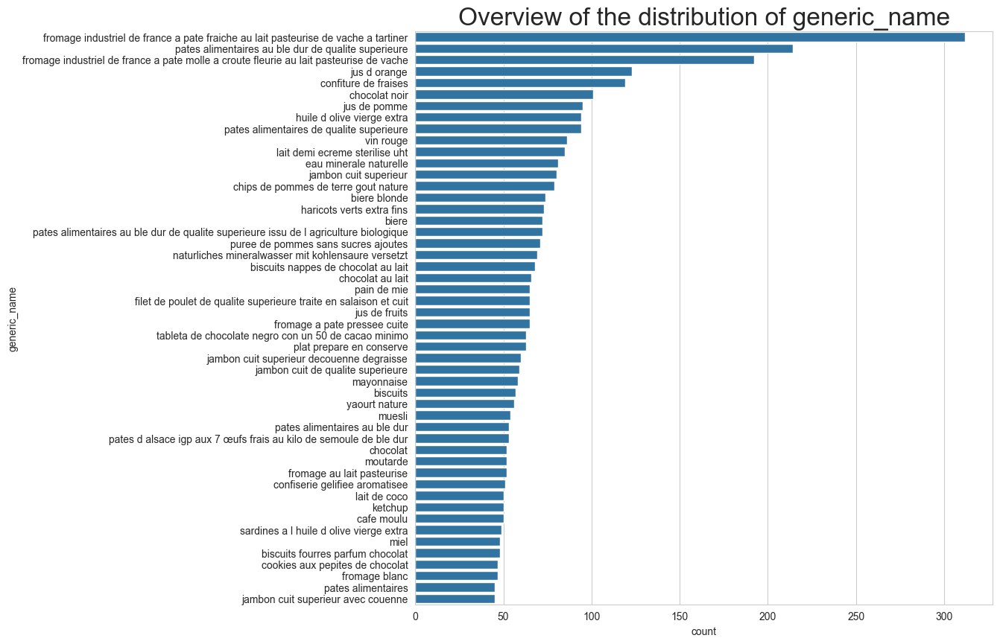

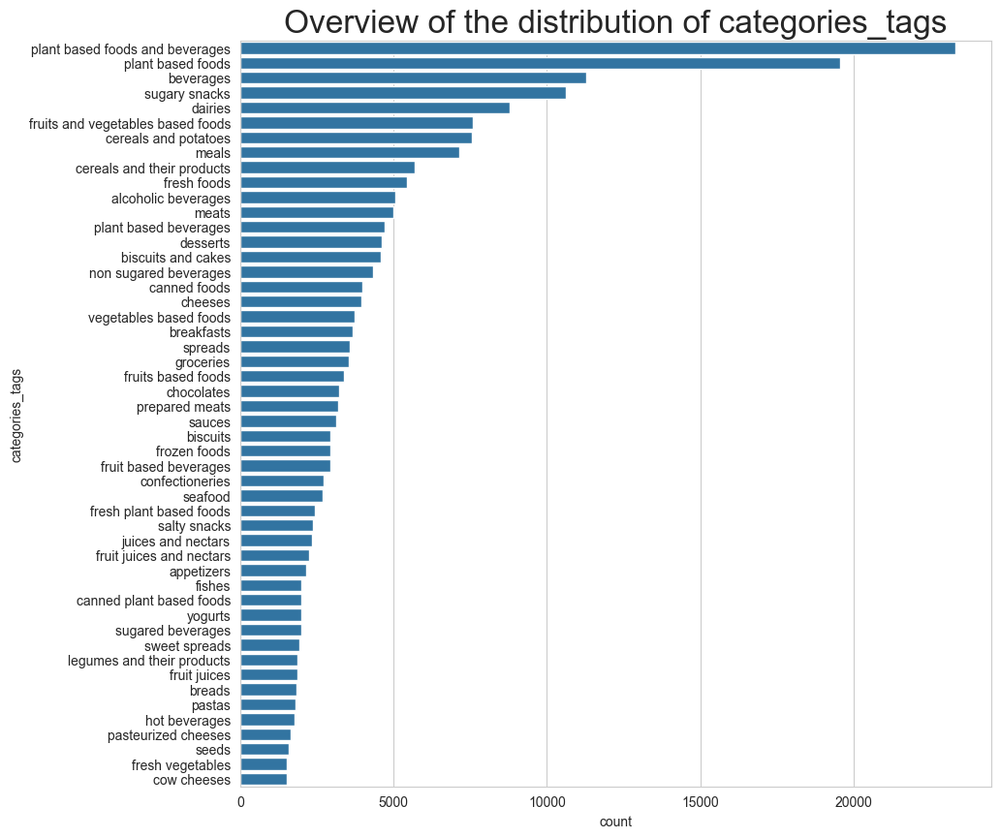

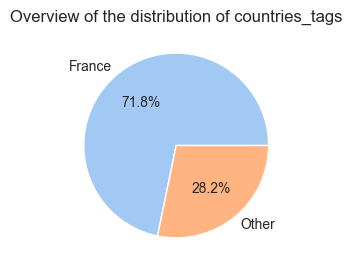

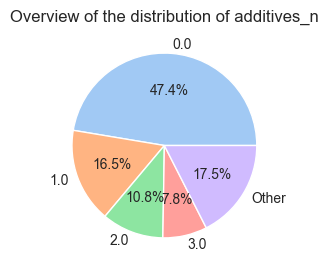

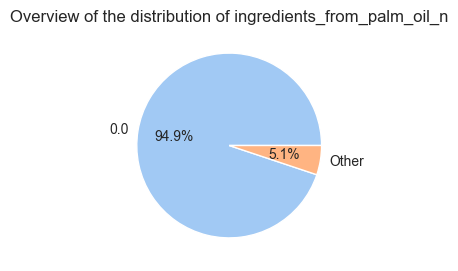

...

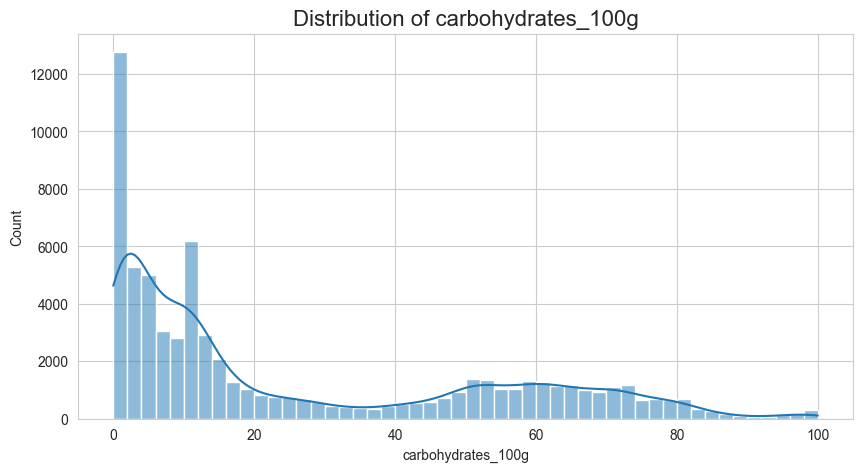

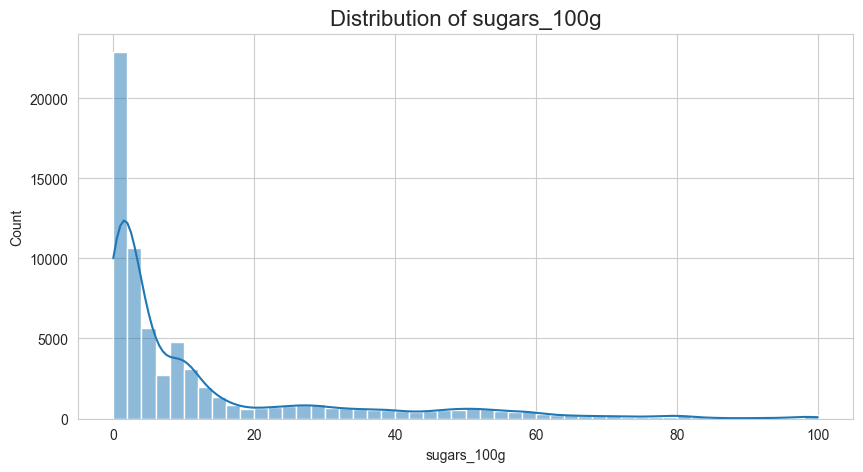

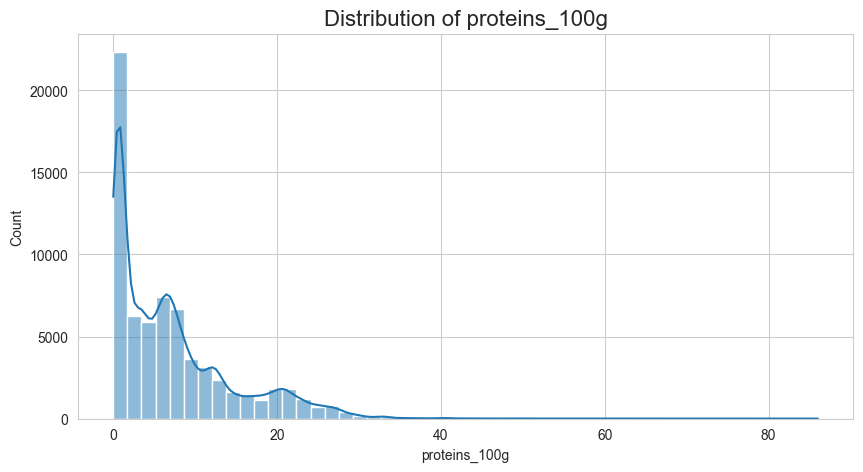

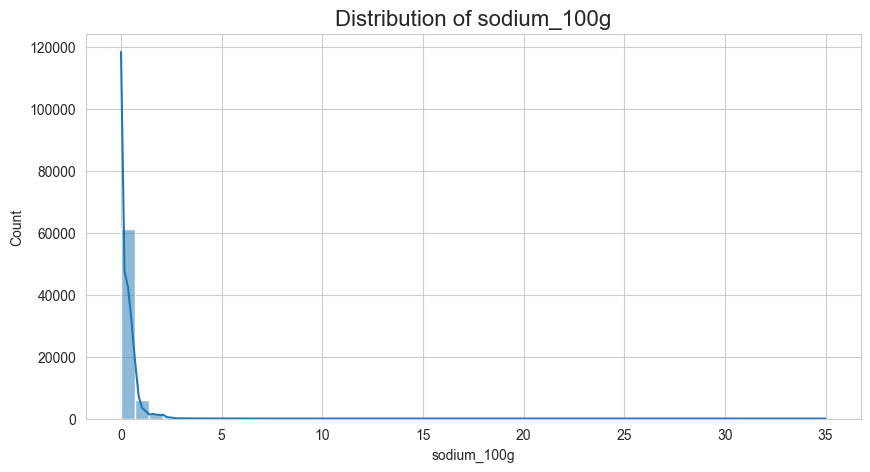

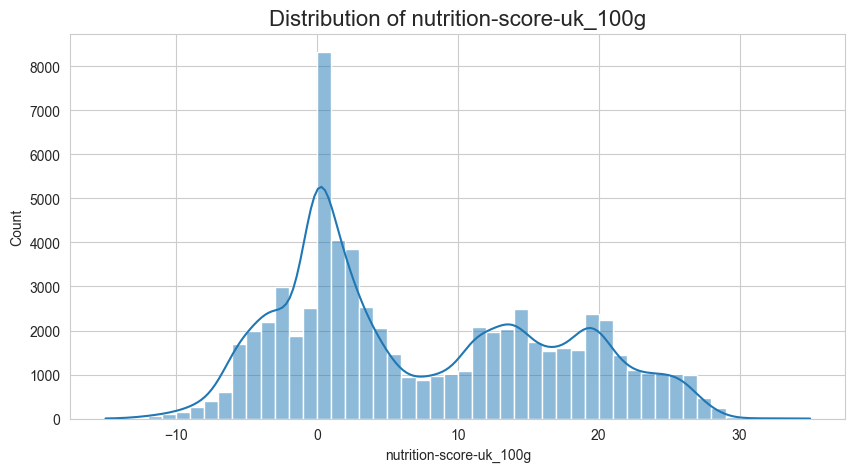

In [ ]:
overview_univariate_distributions(df=filtered_data_post_imputation)

### Bivariate analysis

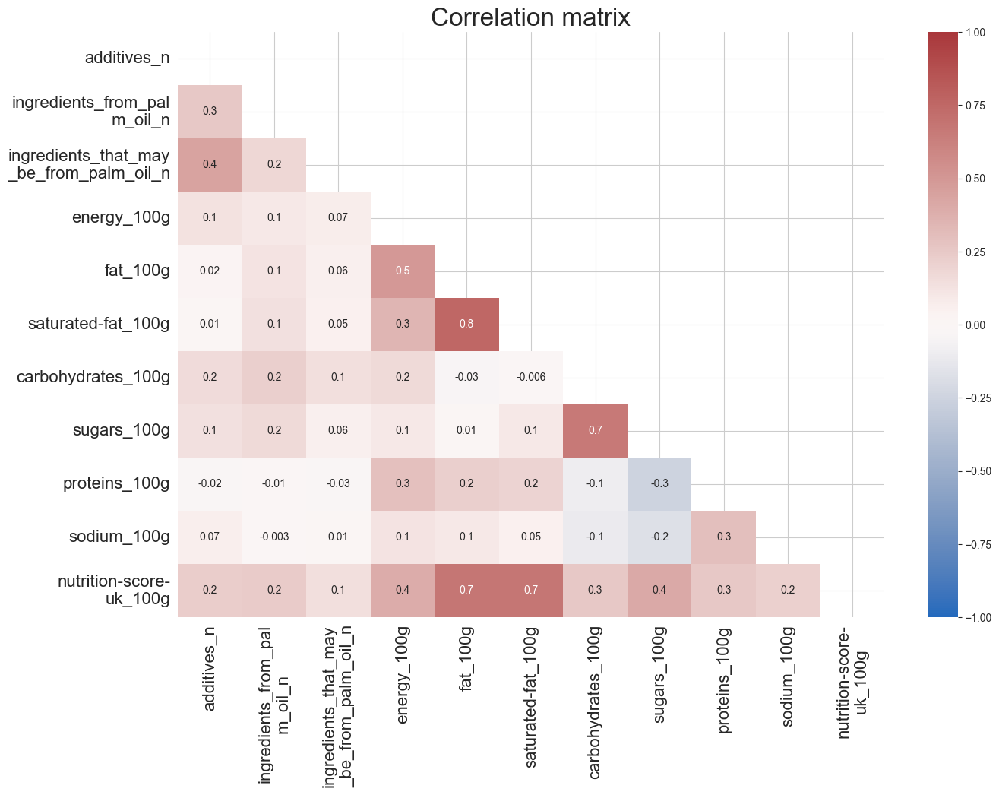

In [ ]:
draw_heatmap(corr_matrix=filtered_data_post_imputation.corr(numeric_only=True), cmap='vlag', vmax=1, vmin=-1, annot=True, fmt="0.0g")

No correlated features found for target 'additives_n'.
No correlated features found for target 'ingredients_from_palm_oil_n'.
No correlated features found for target 'ingredients_that_may_be_from_palm_oil_n'.
No correlated features found for target 'energy_100g'.
No correlated features found for target 'carbohydrates_100g'.
No correlated features found for target 'sugars_100g'.
No correlated features found for target 'proteins_100g'.
No correlated features found for target 'sodium_100g'.


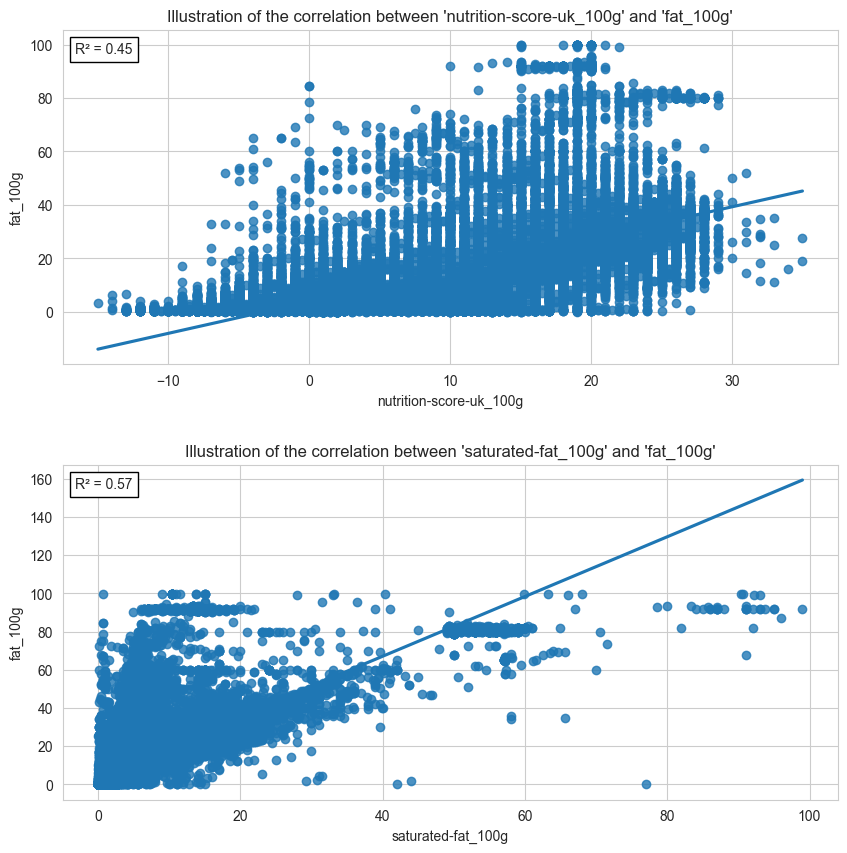

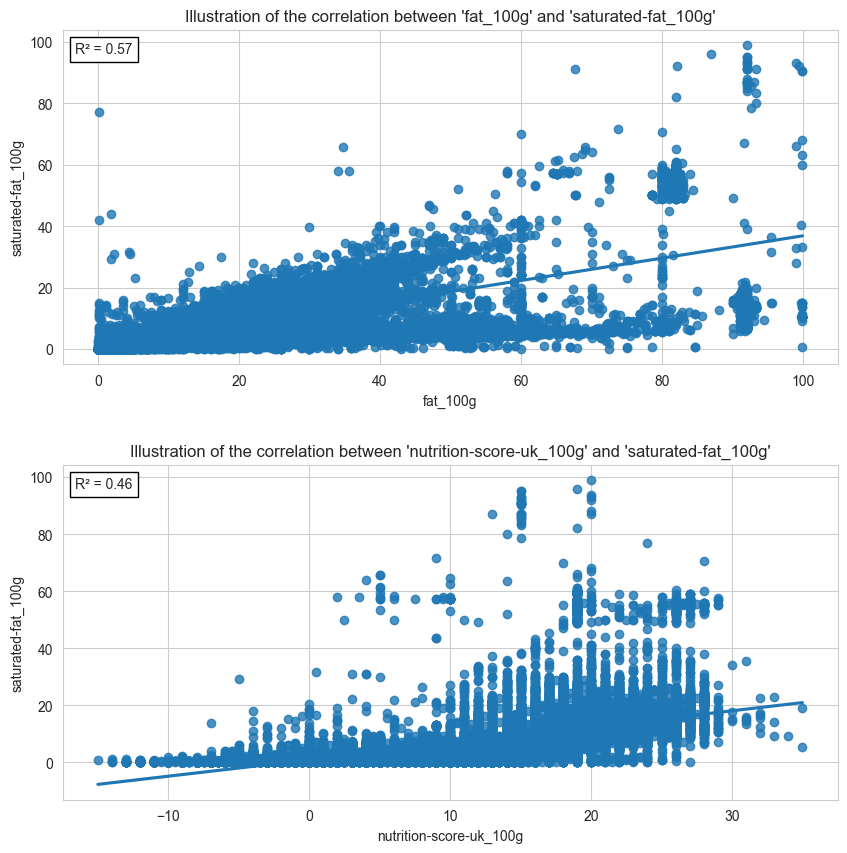

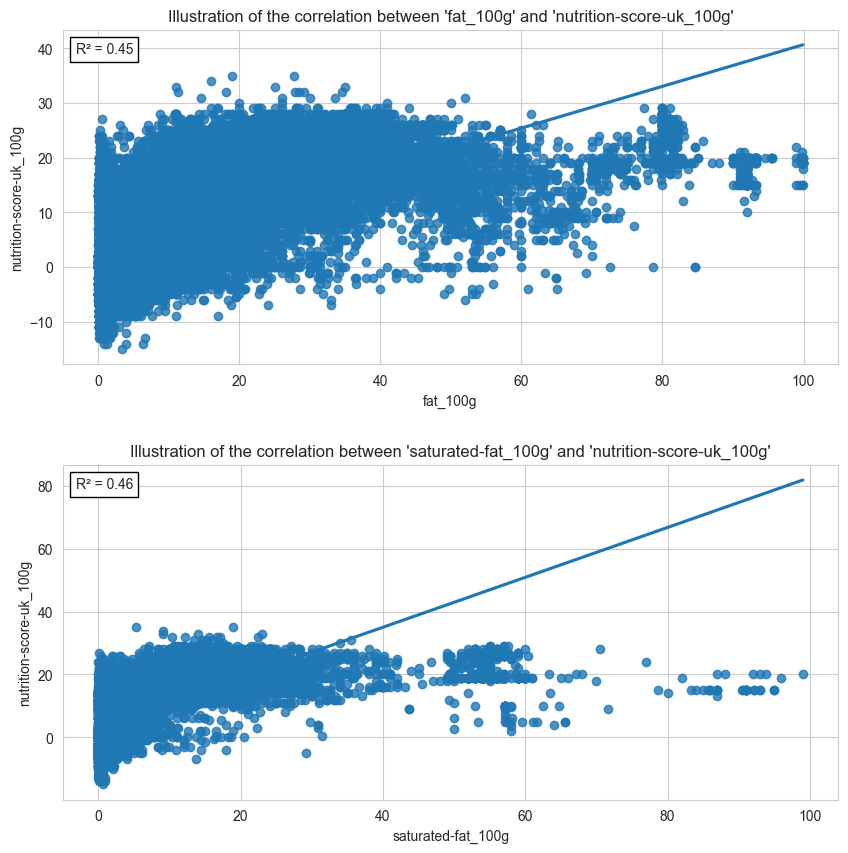

In [ ]:
for col in filtered_data_post_imputation.select_dtypes(include=np.number).columns:
  impute_using_linreg(df=filtered_data_post_imputation, target=col, threshold=0.45, impute=False, visualize=True)

There are some slight correlations between some features. For example, a high amount of fats usually means a high nutrition-score. This is expected since nutrition-score increases with saturated fat amount (see [here](https://www.hooleybrown.com/blog-post/how-to-calculate-your-hfss-score) for more information). It also increases with sugar amount though, so why isn't sugar_100g correlated as much with nutrition-score ?

Text(-10, 30, 'Secondary high density area')

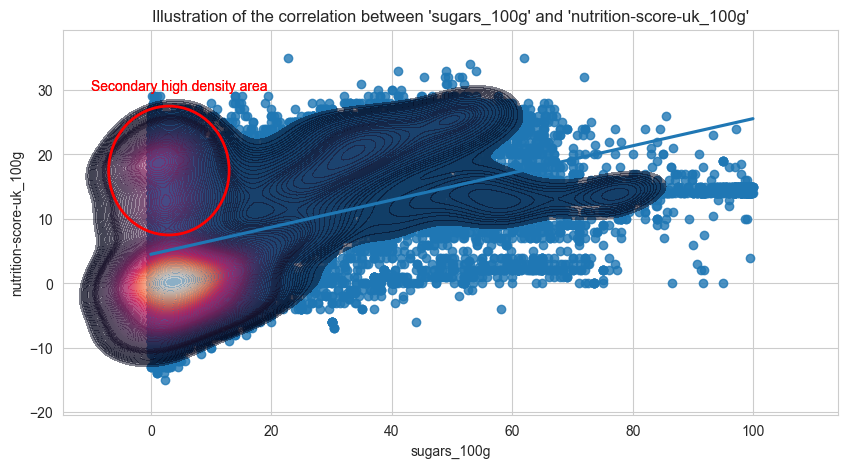

In [ ]:
fig, ax = plt.subplots(figsize=(10,5))
ax.set_title(f"Illustration of the correlation between 'sugars_100g' and 'nutrition-score-uk_100g'")
sns.regplot(data=filtered_data_post_imputation, x="sugars_100g", y="nutrition-score-uk_100g", ci=None, ax=ax)
sns.kdeplot(data=filtered_data_post_imputation.sample(3000), x="sugars_100g", y="nutrition-score-uk_100g", levels=100, thresh=0.05, cmap="rocket", fill=True, alpha=0.5, cut=3, ax=ax)
circle = plt.Circle((3, 17.5), 10, color='r', fill=False, lw=2)
ax.add_patch(circle)
text = plt.text(-10, 30, "Secondary high density area", color="r")
ax.add_artist(text)

Might be because a huge amount of products actually have a quite low amount of sugars but a nutrition-score between 10 and 25 (see "Secondary high density area" on previous figure).  

This can be confirmed by looking at the scatterplot of fat_100g and nutrition-score-uk_100g ,where this density area is less localized and closer to the regression line.

<Axes: title={'center': "Illustration of the correlation between 'fat_100g' and 'nutrition-score-uk_100g'"}, xlabel='fat_100g', ylabel='nutrition-score-uk_100g'>

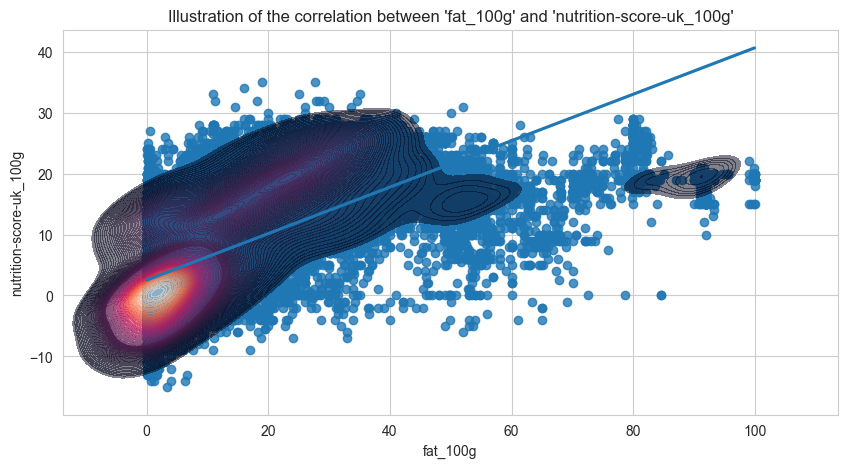

In [ ]:
fig, ax = plt.subplots(figsize=(10,5))
ax.set_title(f"Illustration of the correlation between 'fat_100g' and 'nutrition-score-uk_100g'")
sns.regplot(data=filtered_data_post_imputation, x="fat_100g", y="nutrition-score-uk_100g", ci=None, ax=ax)
sns.kdeplot(data=filtered_data_post_imputation.sample(3000), x="fat_100g", y="nutrition-score-uk_100g", levels=100, thresh=0.05, cmap="rocket", fill=True, alpha=0.5, cut=3, ax=ax)

Anyway, none of those correlations really seems significant, which was expected since the heaviest correlations were already dealt with earlier in the processing phase.

However, it is important to note that the imputation induced outliers, because there are cases where :
- sugars_100g > carbohydrates_100g
- saturated-fat_100g > fat_100g

### PCA with all numerical features

In [ ]:
df = filtered_data_post_imputation.select_dtypes(include=np.number)
print(f"{','.join([str(round(skew(df[col]), 2)) for col in df.columns])}")
log_normal_columns = [c for c in df.columns if skew(df[c]) > 0.6] # Arbitrary threshold
print(log_normal_columns)
features = df.columns
names = df.index

2.22,4.25,4.22,0.38,2.24,3.31,0.87,2.06,1.41,17.35,0.39
['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'proteins_100g', 'sodium_100g']


In [ ]:
# Some columns have a lot of low values and a few high values. Applying log is needed to make them more normal.
for col in log_normal_columns:
    df[col] = np.log(df[col] + 1 - df[col].min())
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df.dropna())

In [ ]:
skew(X_scaled)

array([ 0.68648331,  4.13048621,  3.29550321,  0.38042555,  0.17809346,
        0.67803747, -0.1748305 ,  0.44586606, -0.01544335,  2.16292015,
        0.38983895])

In [ ]:
n_components = 6
pca = PCA(n_components=n_components)
pca.fit(X_scaled)

PCA(n_components=6)

In [ ]:
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
x_list = [f"PC{i+1}" for i in range(n_components)]

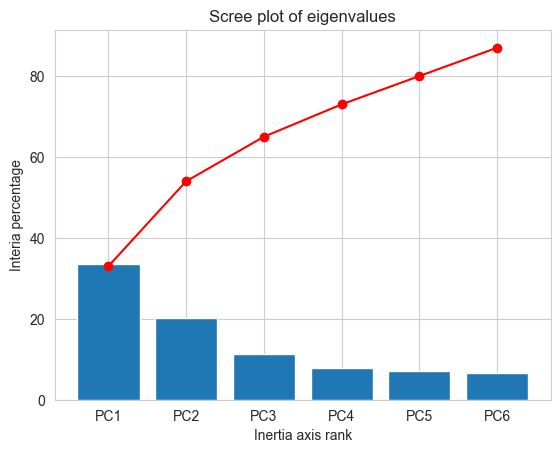

In [ ]:
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("Inertia axis rank")
plt.ylabel("Interia percentage")
plt.title("Scree plot of eigenvalues")
plt.show(block=False)

<Axes: >

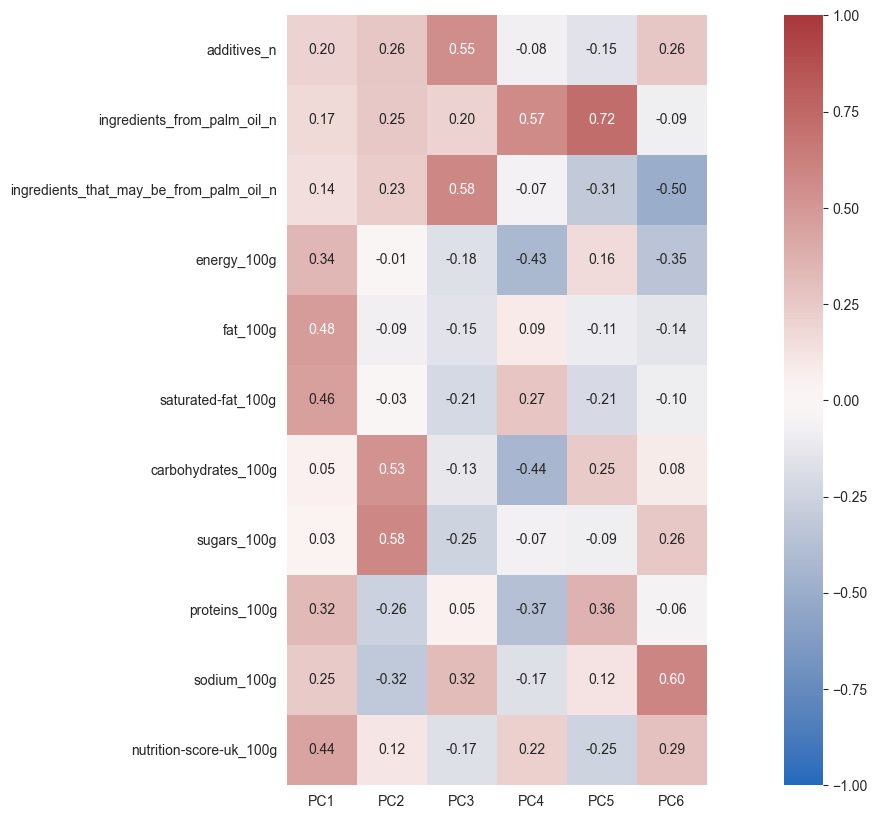

In [ ]:
pcs = pd.DataFrame(pca.components_)
pcs.columns = features
pcs.index = x_list
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="vlag", fmt="0.2f", square=True, ax=ax)

In [ ]:
def correlation_graph(pca, 
                      x_y, 
                      features,
                      figsize=(10,9)) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    x,y=x_y

    # Figure initialization
    fig, ax = plt.subplots(figsize=figsize)
 
    for i in range(0, pca.components_.shape[1]):

        # Arrows
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i], size=12)
        
    # Displaying horizontal and vertical lines
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Axes names with % explained inertia
    plt.xlabel('PC{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('PC{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    plt.title("Correlation circle (PC{} et PC{})".format(x+1, y+1))

    # The circle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes and display
    plt.axis('equal')
    plt.show(block=False)

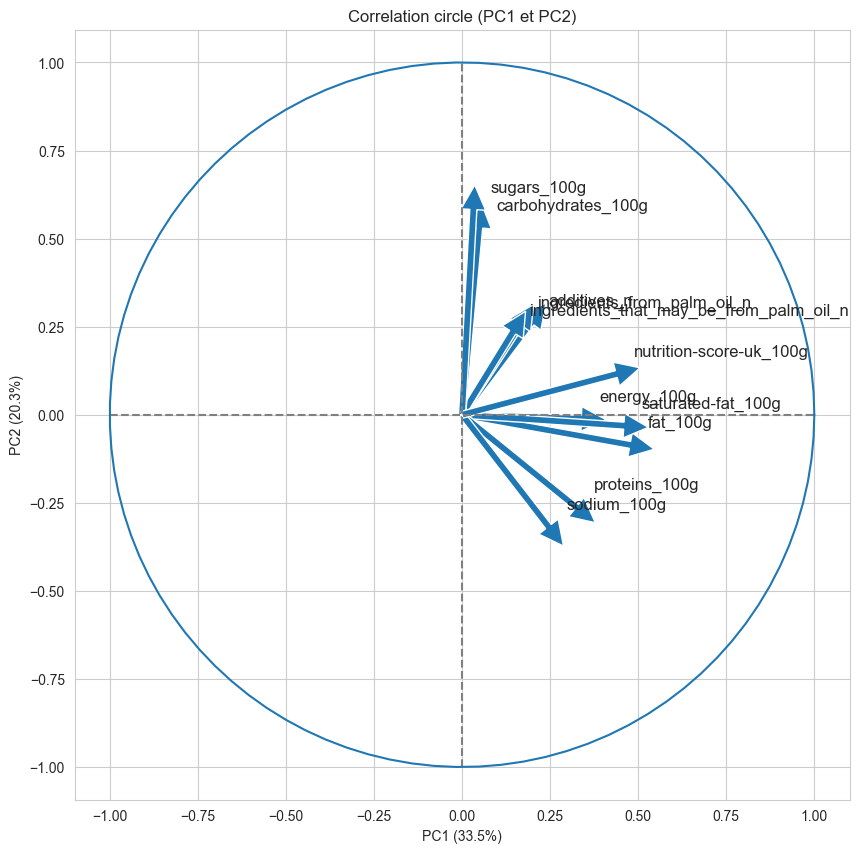

In [ ]:
correlation_graph(pca, (0,1), features, figsize=(10,10))

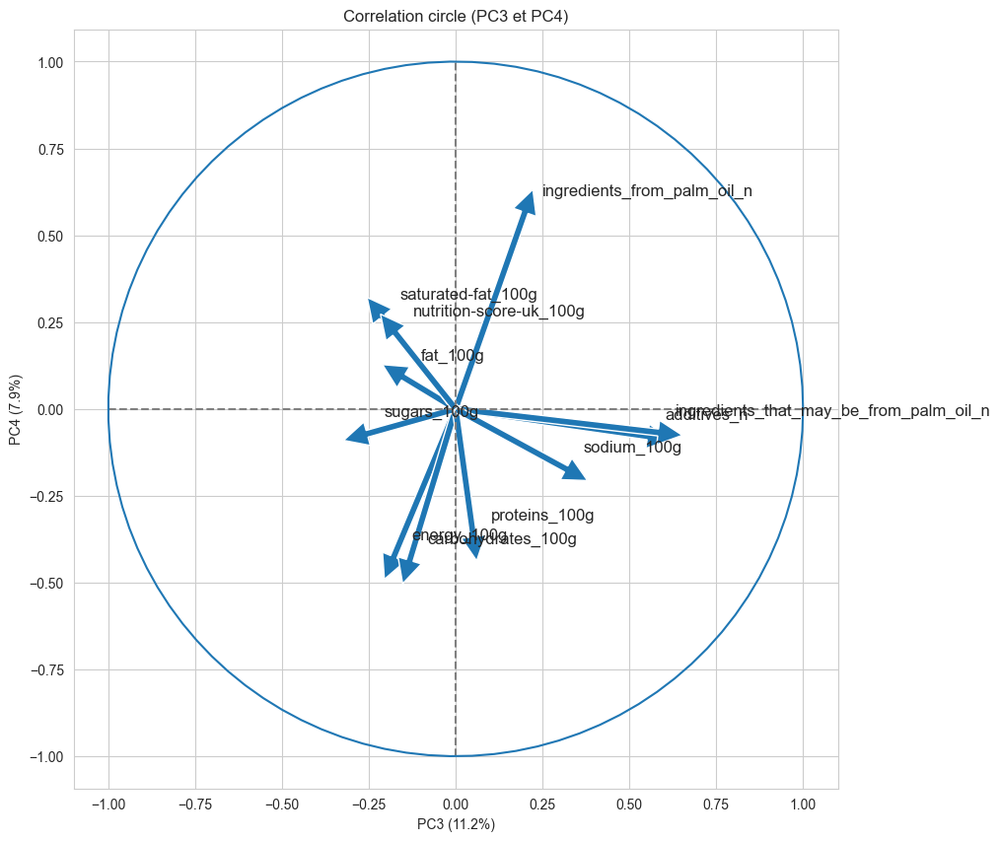

In [ ]:
correlation_graph(pca, (2,3), features, figsize=(10,10))

In [ ]:
X_proj = pca.transform(X_scaled)

In [ ]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=0.8,
                                figsize=(7,6), 
                                marker=None ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : fitted and transformed PCA object, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Convert X_projected into np.array
    X_ = np.array(X_projected)

    # Handle labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # Checking 'axis' argument
    if not len(x_y) == 2 : 
        raise AttributeError("Please provide 2 axes.")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("Argument 'axis' is not correct.")   

    # Defining data
    x, y = x_y
    data = pd.DataFrame(data={'x':X_[:, x], 'y':X_[:, y],})

    # Figure initialisation      
    fig, ax = plt.subplots(figsize=figsize)

    # Plots   
    sns.scatterplot(data=data, x='x', y='y', hue=clusters, markers=marker)
    try:
        sns.kdeplot(data=data.sample(3000), x='x', y='y', levels=100, thresh=0.01, cmap="rocket", fill=True, alpha=0.5, cut=3, ax=ax)
    except:
        sns.kdeplot(data=data.sample(3000), x='x', y='y', levels=20, thresh=0.01, cmap="rocket", fill=True, alpha=0.5, cut=3, ax=ax)

    # Add information about each axis variance
    if pca : 
        v1 = f"({str(round(100*pca.explained_variance_ratio_[x]))}%)"
        v2 = f"({str(round(100*pca.explained_variance_ratio_[y]))}%)"
    else : 
        v1=v2= ''

    # Axes names with % explained inertia
    ax.set_xlabel(f'PC{x+1} {v1}')
    ax.set_ylabel(f'PC{y+1} {v2}')

    # Limit axes
    x_max = np.abs(data['x']).max() *1.1
    y_max = np.abs(data['y']).max() *1.1
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Plot lines
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=alpha)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=alpha)

    # Display labels
    if len(labels) : 
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Title and display
    plt.title(f"Individuals projection (on PC{x+1} and PC{y+1})")
    plt.show()


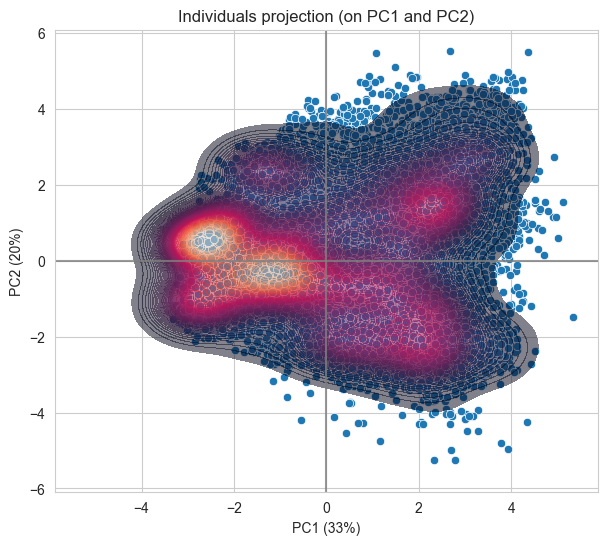

In [ ]:
display_factorial_planes(X_proj, (0,1), pca=pca)

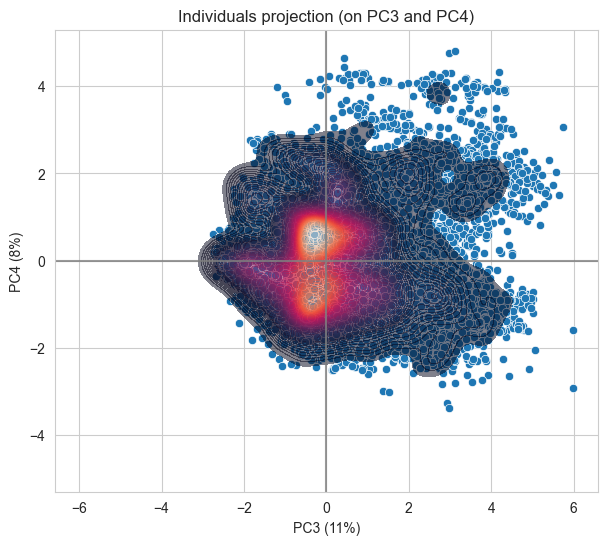

In [ ]:
display_factorial_planes(X_proj, (2,3), pca=pca)

### PCA with only a few features

In [ ]:
# df = filtered_data_post_imputation.select_dtypes(include=np.number)
valid_cols = [c for c in NUTRIENTS_COLS+["energy_100g"] if c in filtered_data_post_imputation]
df = filtered_data_post_imputation[valid_cols]
log_normal_columns = [c for c in df.columns if skew(df[c]) > 1] # Arbitrary threshold
print(log_normal_columns)
features = df.columns
names = df.index

['proteins_100g', 'sugars_100g', 'saturated-fat_100g', 'fat_100g', 'sodium_100g']


In [ ]:
# All nutrients columns have a lot of low values and a few high values. Applying log is needed to make them more normal.
for col in log_normal_columns:
    df[col] = np.log(df[col] + 1 - df[col].min())
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df.dropna())

C:\Users\HCYF5290\AppData\Local\Temp\ipykernel_4620\1021848443.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = np.log(df[col] + 1 - df[col].min())


In [ ]:
skew(X_scaled)

array([-0.01544335,  0.44586606,  0.86696259,  0.67803747,  0.17809346,
        2.16292015,  0.38042555])

In [ ]:
n_components = 6
pca = PCA(n_components=n_components)
pca.fit(X_scaled)

PCA(n_components=6)

In [ ]:
scree = (pca.explained_variance_ratio_*100).round(2)
scree_cum = scree.cumsum().round()
x_list = [f"PC{i+1}" for i in range(n_components)]

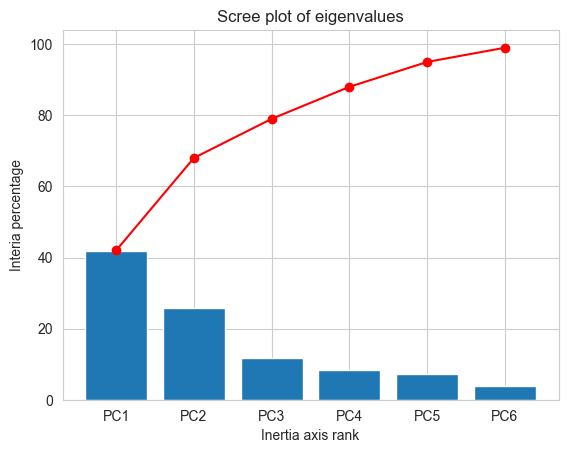

In [ ]:
plt.bar(x_list, scree)
plt.plot(x_list, scree_cum,c="red",marker='o')
plt.xlabel("Inertia axis rank")
plt.ylabel("Interia percentage")
plt.title("Scree plot of eigenvalues")
plt.show(block=False)

Text(0.5, 1.0, 'Features contribution to each principal component')

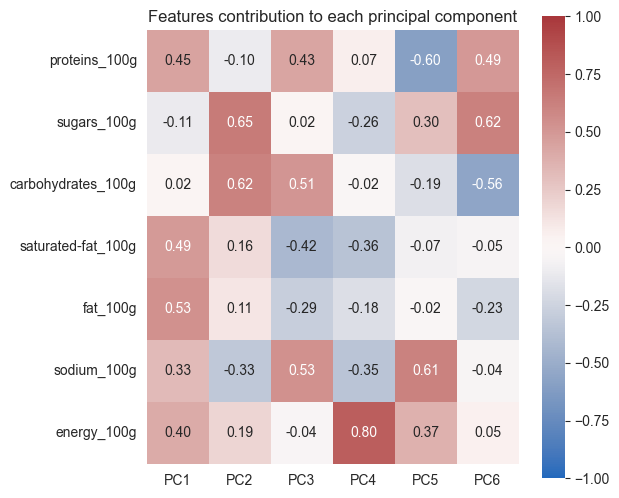

In [ ]:
pcs = pd.DataFrame(pca.components_)
pcs.columns = features
pcs.index = x_list
fig, ax = plt.subplots(figsize=(6, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="vlag", fmt="0.2f", square=True, ax=ax)
ax.set_title("Features contribution to each principal component")

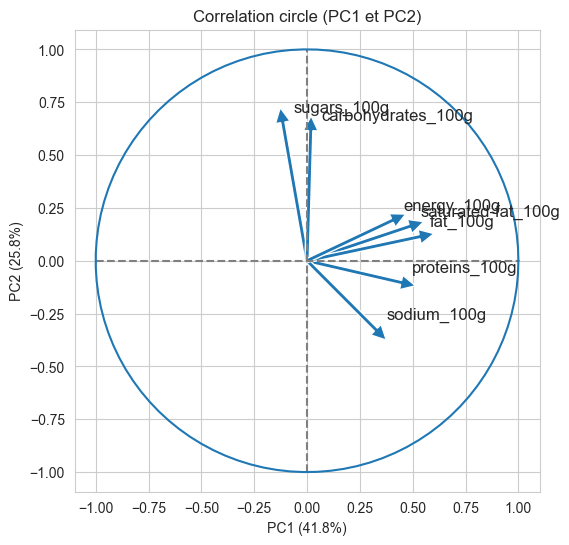

In [ ]:
correlation_graph(pca, (0,1), features, figsize=(6,6))

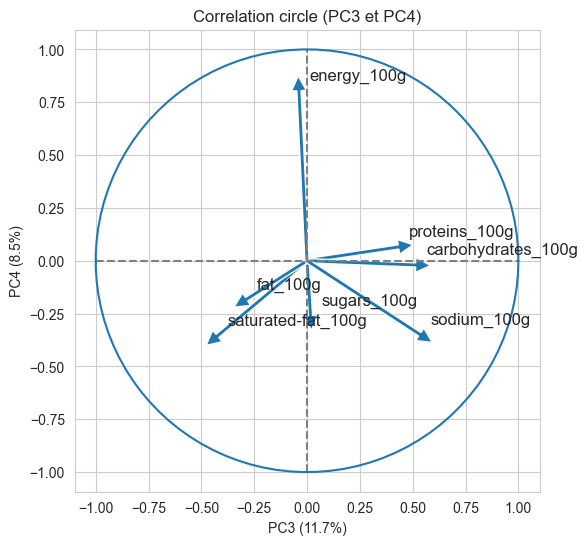

In [ ]:
correlation_graph(pca, (2,3), features, figsize=(6,6))

In [ ]:
X_proj = pca.transform(X_scaled)

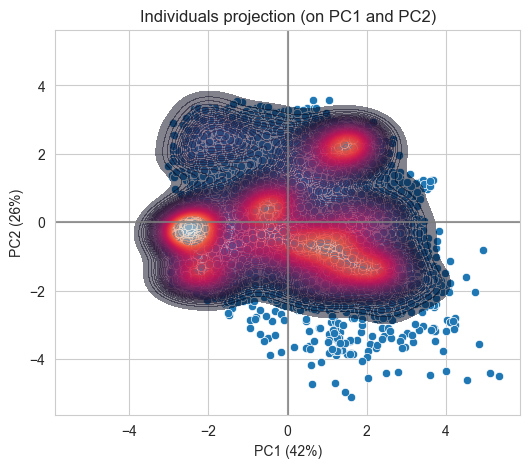

In [ ]:
display_factorial_planes(X_proj, (0,1), pca=pca, figsize=(6,5))

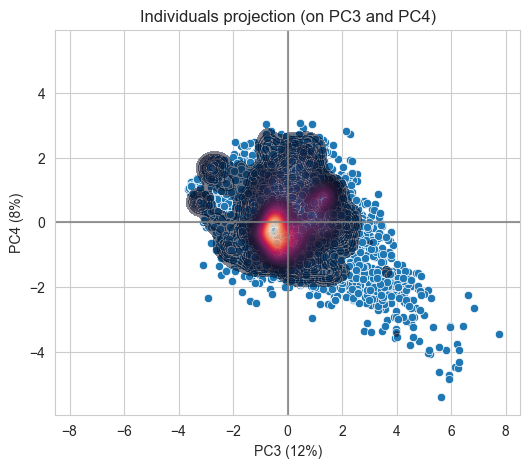

In [ ]:
display_factorial_planes(X_proj, (2,3), pca=pca, figsize=(6,5))